# 1. EDA
1. 결측치 확인
2. 무한대 확인
3. boxplot → 이상치 처리 → winsorizing

In [19]:
import pandas as pd
import numpy as np

In [20]:
df_final = pd.read_csv('./data/df_final_1.csv',index_col=0)
df_final

,회사명,거래소코드,회계년도,감사의견코드,y,자기자본비율,부채비율,유동비율,당좌비율,차입금의존도,...,광업,교육 서비스업,도매 및 소매업,"사업시설 관리, 사업 지원 및 임대 서비스업","수도, 하수 및 폐기물 처리, 원료 재생업","예술, 스포츠 및 여가관련 서비스업","전기, 가스, 증기 및 공기조절 공급업","전문, 과학 및 기술 서비스업",정보통신업,제조업
0,(주)강원에너지,114190,2020,1,1.0,41.659492,78.715434,171.652368,97.346502,12.303099,...,0,0,0,0,0,0,0,0,0,1
1,(주)골드앤에스,35290,2014,1,1.0,20.669768,335.311991,51.192980,78.536538,36.337895,...,0,0,0,0,0,0,0,0,1,0
2,(주)골드앤에스,35290,2015,1,1.0,48.368876,42.093766,324.774250,80.879343,0.598762,...,0,0,0,0,0,0,0,0,1,0
3,(주)골드앤에스,35290,2019,0,1.0,37.021190,171.147017,41.744283,76.596773,6.594573,...,0,0,0,0,0,0,0,0,1,0
4,(주)골드앤에스,35290,2020,1,1.0,-12.754704,-704.718468,17.931353,77.878012,6.355326,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,(주)바이오솔루션,86820,2020,1,0.0,93.079812,4.890369,2761.424968,96.465210,0.000000,...,0,0,0,0,0,0,0,0,0,1
934,(주)씨유메디칼시스템,115480,2020,1,0.0,59.525673,92.000919,117.374389,75.839411,27.414434,...,0,0,0,0,0,0,0,0,0,1
935,(주)메카로,241770,2020,1,0.0,89.105169,11.156992,629.191005,78.976175,0.700766,...,0,0,0,0,0,0,0,0,0,1
936,비디아이(주),148140,2020,1,0.0,32.634844,216.670953,135.740416,100.000000,17.276681,...,0,0,0,0,0,0,0,0,0,1


## 1-1. 결측치 확인

In [30]:
df_final.isna().sum()

회사명                         0
거래소코드                       0
회계년도                        0
감사의견코드                      0
y                           0
자기자본비율                      0
부채비율                        0
유동비율                        0
당좌비율                        0
차입금의존도                      0
매출액규모                       0
총자산규모                       0
부채상환계수                      0
총자본순이익률                     0
자본금세전순이익률                   0
자기자본순이익률                    0
매출액세전순이익률                   0
매출액영업이익률                    0
금융비용대비매출액                   0
매출원가율                       0
이자보상배율                      0
총자본회전율                      0
자기자본회전율                     0
비유동자산회전율                    0
유형고정자산회전율                   0
매출채권회전율                     0
재고자산회전율                     0
운전자산회전율                     0
총자산증가율                      0
유형자산증가율                     0
매출액증가율                      0
순이익증가율                      0
자기자본증가율                     0
총자본투자효율   

## 1-2. 무한대 확인

In [31]:
np.isinf(abs(df_final.iloc[:,5:37])).sum()

자기자본비율       0
부채비율         0
유동비율         0
당좌비율         0
차입금의존도       0
매출액규모        0
총자산규모        0
부채상환계수       0
총자본순이익률      0
자본금세전순이익률    0
자기자본순이익률     0
매출액세전순이익률    0
매출액영업이익률     0
금융비용대비매출액    0
매출원가율        0
이자보상배율       0
총자본회전율       0
자기자본회전율      0
비유동자산회전율     0
유형고정자산회전율    0
매출채권회전율      0
재고자산회전율      0
운전자산회전율      0
총자산증가율       0
유형자산증가율      0
매출액증가율       0
순이익증가율       0
자기자본증가율      0
총자본투자효율      0
부가가치율        0
노동소득분배율      0
현금흐름         0
dtype: int64

## 1-3. boxplot 이상치 처리

In [5]:
# 이상치 확인을 위한 boxplot 그리기 전 초기작업
import seaborn as sns #heatmap 만들기 위한 라이브러리
import matplotlib.pyplot as plt
import warnings
import numpy as np
import matplotlib

%matplotlib inline
plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [30, 40]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

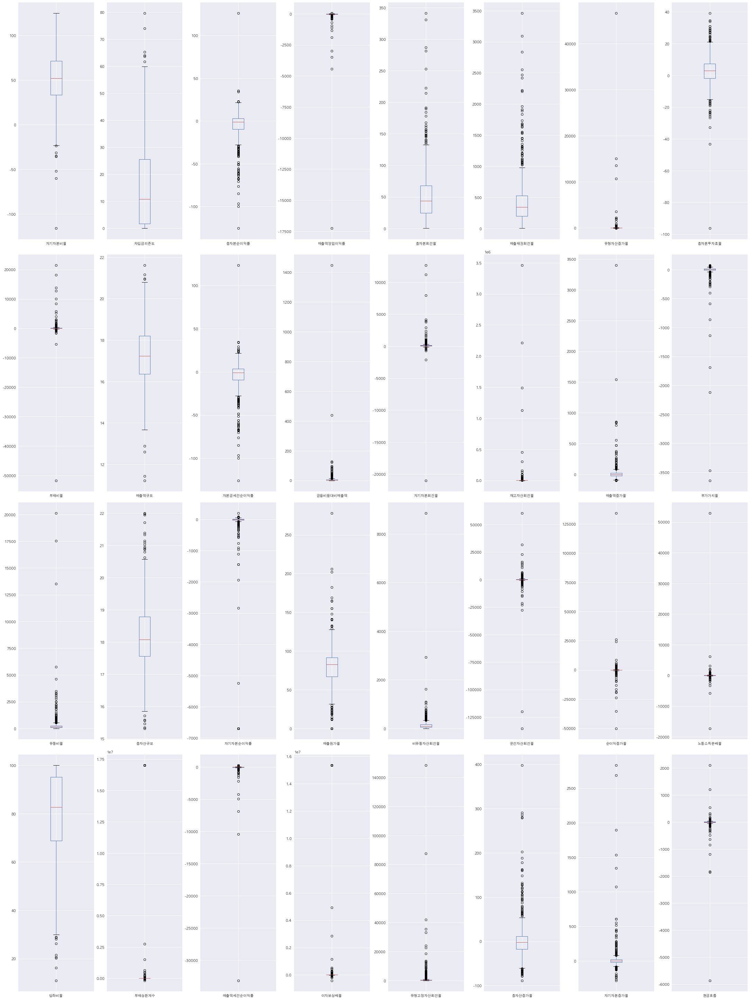

In [7]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "NanumGothic"

ncols = 8
nrows = 4

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)

fig.set_size_inches((30, 40))

for col, ax in zip(df_final.columns[5:37], axs.T.ravel()):
    df_final[[col]].boxplot(ax=ax)
    
plt.show()

이상치 조정
- 너무 극단적인 이상치에 대해서는 winsorising 진행
- winsorize시 분포의 95% 외의 값은 max와 min 값으로 대체

In [32]:
x = df_final.iloc[:,5:37]
x

,자기자본비율,부채비율,유동비율,당좌비율,차입금의존도,매출액규모,총자산규모,부채상환계수,총자본순이익률,자본금세전순이익률,...,운전자산회전율,총자산증가율,유형자산증가율,매출액증가율,순이익증가율,자기자본증가율,총자본투자효율,부가가치율,노동소득분배율,현금흐름
0,41.659492,78.715434,171.652368,97.346502,12.303099,17.161917,17.583764,-89.560725,-10.714159,-10.714159,...,260.835838,-40.698452,-7.485894,-10.095643,-146.148683,-36.568135,-3.355146,-6.871342,-99.011783,17.397557
1,20.669768,335.311991,51.192980,78.536538,36.337895,17.034148,17.714853,7.374011,-7.445354,-7.514566,...,-163.121344,-18.218210,21.664094,-20.337630,-231.855405,-55.327901,2.745650,6.027474,193.362805,-8.818698
2,48.368876,42.093766,324.774250,80.879343,0.598762,16.560886,17.067764,-358.813255,-15.116177,-1.437314,...,155.943863,-47.643241,-98.376233,-37.703368,-239.163255,60.397782,5.770305,13.937739,76.620945,7.409362
3,37.021190,171.147017,41.744283,76.596773,6.594573,15.637464,17.231392,-144.152613,-35.200343,-34.676298,...,-58.441035,0.766632,38.002005,-7.731282,-442.614164,-8.762799,-6.899849,-33.839080,-69.583921,-45.108715
4,-12.754704,-704.718468,17.931353,77.878012,6.355326,14.987710,16.765759,-34.427106,-17.252203,-17.187801,...,-17.828586,-37.226271,-61.348826,-47.782566,-140.041210,-128.146832,-0.120078,-0.921375,-2612.069777,17.882626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.079812,4.890369,2761.424968,96.465210,0.000000,15.548236,17.722137,716.861254,-2.380746,-2.380746,...,14.103125,-4.626905,45.244686,-22.856771,-326.947283,-2.185597,-0.804465,-7.244845,-337.923284,-4.101015
934,59.525673,92.000919,117.374389,75.839411,27.414434,17.758305,18.877611,10.571588,-3.382666,-3.400753,...,595.979618,33.344563,2.677153,-17.232473,-853.589342,66.091353,3.849428,10.315665,101.143427,8.226030
935,89.105169,11.156992,629.191005,78.976175,0.700766,17.782810,18.861992,506.016413,-0.594747,-0.691449,...,92.219919,-1.888743,19.122630,-7.706858,-110.388840,-3.774855,5.070220,15.061557,76.633829,4.800863
936,32.634844,216.670953,135.740416,100.000000,17.276681,18.955340,18.960815,-51.875354,-14.352540,-15.417872,...,453.226828,6.921679,-2.693640,124.657694,-2427.908560,55.448194,-3.525107,-3.429733,-28.575109,-69.421513


In [33]:
# boxplot에서 보이는 이상치 처리 -> 5% winsorizing 활용
from scipy.stats.mstats import winsorize
for i in range(len(x.columns)):
  x.iloc[:,i]= winsorize(x.iloc[:,i], limits=[0.025, 0.025])

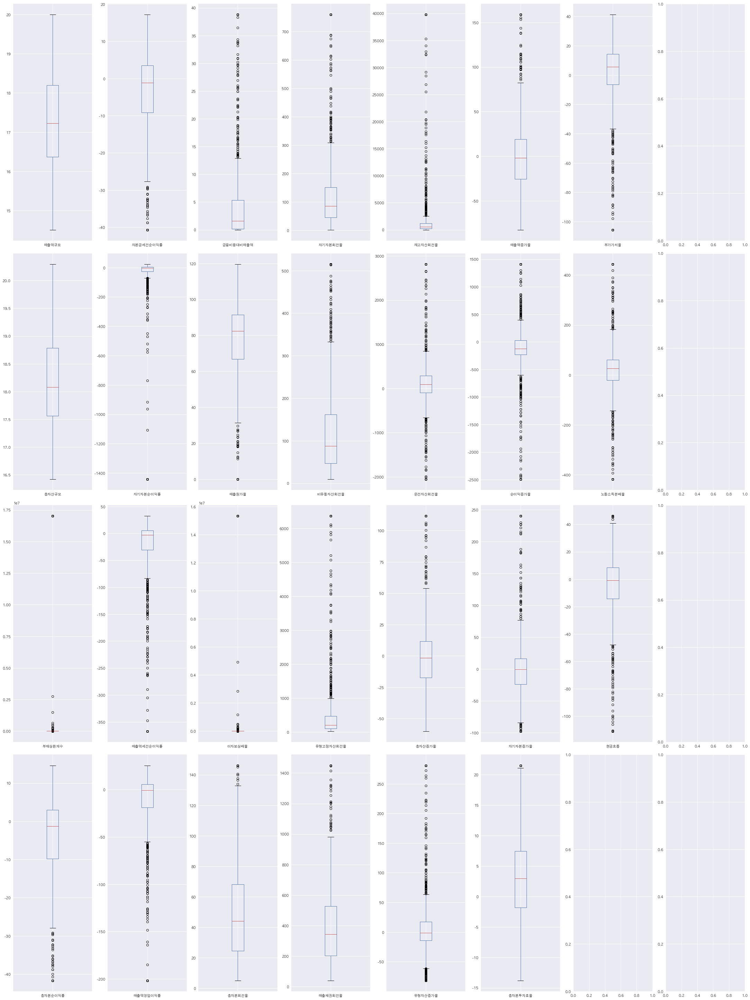

In [10]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "NanumGothic"

ncols = 8
nrows = 4

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)

fig.set_size_inches((30, 40))

for col, ax in zip(x.columns, axs.T.ravel()):
    x[[col]].boxplot(ax=ax)
    
plt.show()

# 2. 변수 선택 및 변수 세분화

## 2-1. StandardScaler

In [8]:
# 2) standard scale로 변화를 확인해보고자 원본 독립변수들을 스케일링 진행
from sklearn.preprocessing import StandardScaler

scale = StandardScaler()
x_scaled = scale.fit_transform(x)
x_scaled_df = pd.DataFrame(x_scaled, columns = x.columns)
x_scaled_df.head()

,자기자본비율,부채비율,유동비율,당좌비율,차입금의존도,매출액규모,총자산규모,부채상환계수,총자본순이익률,자본금세전순이익률,...,운전자산회전율,총자산증가율,유형자산증가율,매출액증가율,순이익증가율,자기자본증가율,총자본투자효율,부가가치율,노동소득분배율,현금흐름
0,-0.401876,-0.347000,-0.246377,1.026805,-0.193453,-0.086546,-0.660994,-0.196540,-0.534109,-0.596907,...,0.184745,-1.216583,-0.281455,-0.256262,0.027509,-0.676857,-0.853626,-0.232649,-0.864732,0.818739
1,-1.235217,0.824754,-0.688285,-0.062359,1.443515,-0.184621,-0.518404,-0.196509,-0.254285,-0.324566,...,-0.381305,-0.536640,0.167019,-0.475977,-0.115127,-0.986391,-0.035322,0.228323,1.275870,-0.078893
2,-0.135498,-0.514233,0.315355,0.073298,-0.990615,-0.547897,-1.222267,-0.196624,-0.910941,0.192713,...,0.044698,-1.426637,-1.425079,-0.848513,-0.127289,0.923075,0.370377,0.511017,0.421151,0.476748
3,-0.586028,0.075091,-0.722948,-0.174678,-0.582251,-1.256715,-1.044283,-0.196557,-2.630235,-2.636497,...,-0.241540,0.037580,0.418378,-0.205541,-0.465878,-0.218070,-1.329080,-1.196411,-0.649278,-1.321447
4,-2.010414,-0.690237,-0.799154,-0.100490,-0.598545,-1.755466,-1.550771,-0.196522,-1.093794,-1.147925,...,-0.187316,-1.111563,-1.110137,-1.064735,0.037673,-1.680178,-0.419704,-0.020012,-3.200488,0.835347


### 2-1-1. 히트맵을 이용한 다중공선성확인

In [9]:
# 이상치 확인을 위한 boxplot 그리기 전 초기작업
import seaborn as sns #heatmap 만들기 위한 라이브러리
import matplotlib.pyplot as plt
import warnings
import numpy as np
import matplotlib
from matplotlib import rc

%matplotlib inline
plt.style.use('seaborn')
plt.rcParams['figure.dpi'] = 300
#rc('font', family='AppleGothic') # Mac Os
rc('font', family='NanumGothic') # Windows Os
plt.rcParams['axes.unicode_minus'] = False
warnings.simplefilter(action='ignore', category=FutureWarning)

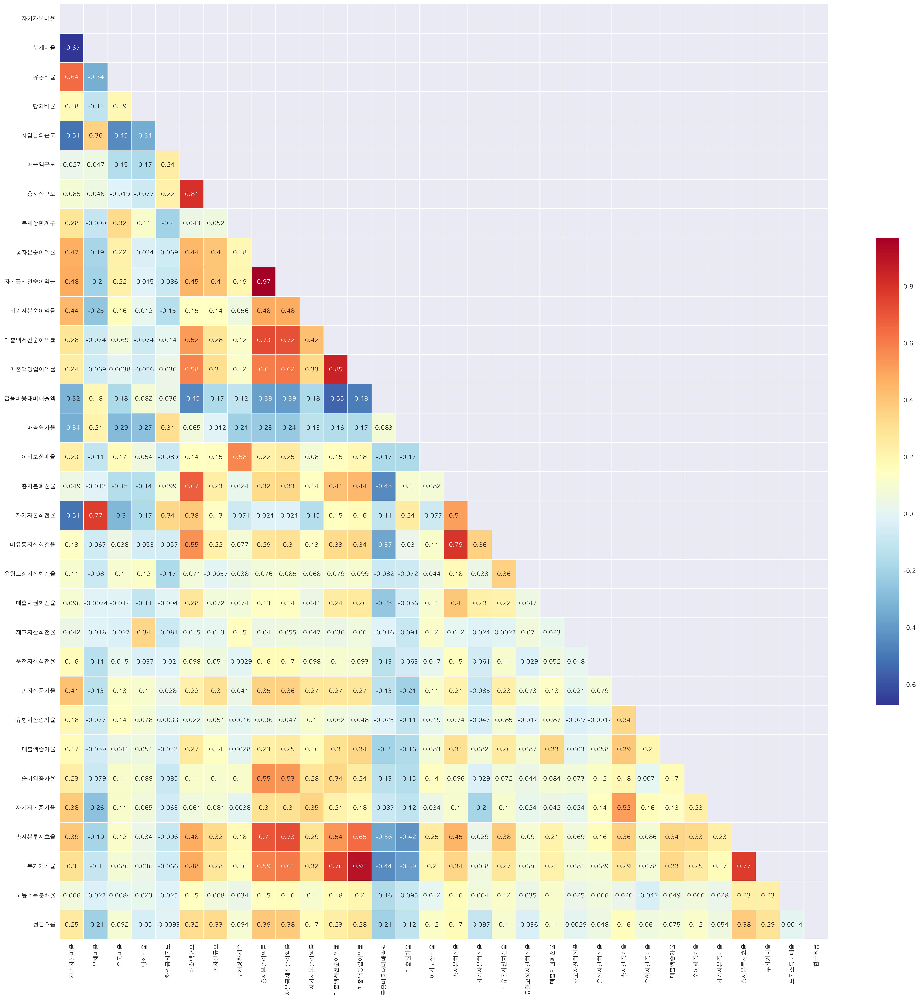

In [14]:
# 3) 상관행렬 시각화
mask_ut=np.triu(np.ones(x_scaled_df.corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(x_scaled_df.corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut)
plt.show()

### 2-1-2. 피처 유의성 검정

In [10]:
import statsmodels.api as sm

In [11]:
# 1-1) 상수항 추가
x_ = sm.add_constant(x_scaled_df, has_constant = "add")

# 1-2) 회귀모델 적합
multi_model1 = sm.Logit(df_final[['y']], x_)
fitted_multi_model1 = multi_model1.fit()

# 1-3) 결과 출력
fitted_multi_model1.summary()

Optimization terminated successfully.
         Current function value: 0.402197
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  938
Model:                          Logit   Df Residuals:                      905
Method:                           MLE   Df Model:                           32
Date:                Thu, 29 Sep 2022   Pseudo R-squ.:                  0.4198
Time:                        09:43:56   Log-Likelihood:                -377.26
converged:                       True   LL-Null:                       -650.17
Covariance Type:            nonrobust   LLR p-value:                 8.406e-95
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3989      0.167      2.387      0.017       0.071       0.726
자기자본비율        -0.6083      0.269     -2.263      0.024      -1.135      -0.081
부채비율           0.4053      0.389      1.043      0.297      -0.356       1.167
유동비율          -0.2782      0.136     -2.041      0.041      -0.545      -0.011
당좌비율           0.0159      0.111      0.144      0.886      -0.201       0.233
차입금의존도        -0.5360      0.136     -3.935      0.000      -0.803      -0.269
매출액규모         -0.8590      0.480     -1.791      0.073      -1.799       0.081
총자산규모         -0.1144      0.349     -0.328      0.743      -0.799       0.570
부채상환계수         0.1519      0.118      1.282      0.200      -0.080       0.384
총자본순이익률       -2.0075      0.759     -2.645      0.008      -3.495      -0.520
자본금세전순이익률      1.1293      0.709      1.593      0.111      -0.261       2.519
자기자본순이익률      -0.8969      0.681     -1.317      0.188      -2.232       0.438
매출액세전순이익률      0.4041      0.305      1.325      0.185      -0.194       1.002
매출액영업이익률       0.5935      0.411      1.443      0.149      -0.213       1.400
금융비용대비매출액     -0.0120      0.149     -0.080      0.936      -0.305       0.281
매출원가율          0.1091      0.124      0.877      0.380      -0.135       0.353
이자보상배율         0.0286      0.117      0.245      0.806      -0.200       0.257
총자본회전율        -0.6606      0.361     -1.830      0.067      -1.368       0.047
자기자본회전율        0.7647      0.360      2.124      0.034       0.059       1.470
비유동자산회전율      -0.2343      0.183     -1.279      0.201      -0.593       0.125
유형고정자산회전율     -0.1637      0.106     -1.548      0.122      -0.371       0.043
매출채권회전율       -0.2509      0.107     -2.351      0.019      -0.460      -0.042
재고자산회전율       -0.0634      0.099     -0.641      0.521      -0.257       0.130
운전자산회전율        0.0159      0.094      0.169      0.866      -0.168       0.200
총자산증가율        -0.6247      0.160     -3.895      0.000      -0.939      -0.310
유형자산증가율       -0.0967      0.095     -1.013      0.311      -0.284       0.090
매출액증가율         0.2079      0.110      1.889      0.059      -0.008       0.424
순이익증가율         0.0342      0.115      0.298      0.766      -0.191       0.259
자기자본증가율        0.8611      0.161      5.342      0.000       0.545       1.177
총자본투자효율        0.4975      0.260      1.913      0.056      -0.012       1.007
부가가치율         -0.6924      0.400     -1.730      0.084      -1.477       0.092
노동소득분배율       -0.0689      0.093     -0.744      0.457      -0.250       0.113
현금흐름          -0.2760      0.161     -1.716      0.086      -0.591       0.039
==============================================================================
"""

In [14]:
# 2) 유의한 변수들만 보이기
list_ = pd.DataFrame(fitted_multi_model1.pvalues, columns = ['p_value'])
list_[(list_['p_value'] < 0.05)][['p_value']].sort_values('p_value')

,p_value
자기자본증가율,9.208284e-08
차입금의존도,8.308543e-05
총자산증가율,9.837496e-05
총자본순이익률,8.167253e-03
const,1.698117e-02
매출채권회전율,1.874820e-02
자기자본비율,2.363853e-02
자기자본회전율,3.369971e-02
유동비율,4.121449e-02


### 2-1-3. VIF를 이용한 다중공선성 확인

In [15]:
def vif(data):
    import pandas as pd
    from statsmodels.stats.outliers_influence import variance_inflation_factor

    # VIF 출력을 위한 데이터 프레임 형성
    vif = pd.DataFrame()

    # VIF 값과 각 Feature 이름에 대해 설정
    vif["VIF Factor"] = [variance_inflation_factor(data.values, i) for i in range(len(data.columns))]
    vif["features"] = data.columns 

    # VIF 값이 높은 순으로 정렬
    vif = vif.sort_values(by="VIF Factor", ascending=False)
    vif = vif.reset_index().drop(columns='index')
    
    return vif

In [16]:
vif(x_scaled_df)

,VIF Factor,features
0,24.305571,매출액규모
1,22.180848,총자본순이익률
2,19.169565,자본금세전순이익률
3,13.319569,매출액영업이익률
4,13.185930,총자산규모
5,13.128148,부가가치율
6,10.370212,총자본회전율
7,8.419598,자기자본회전율
8,8.363232,매출액세전순이익률
9,7.288422,부채비율


In [17]:
# 매출액규모
x1_sd = x_scaled_df.drop('매출액규모',axis = 1)
# vif 확인
vif(x1_sd)

,VIF Factor,features
0,21.857696,총자본순이익률
1,19.146775,자본금세전순이익률
2,13.039541,부가가치율
3,12.557152,매출액영업이익률
4,8.418657,자기자본회전율
5,8.021781,매출액세전순이익률
6,7.285383,부채비율
7,7.034954,총자본회전율
8,6.478637,총자본투자효율
9,5.963410,자기자본비율


In [18]:
# 자본금세전순이익률
x2_sd = x1_sd.drop('자본금세전순이익률',axis = 1)
# vif 확인
vif(x2_sd)

,VIF Factor,features
0,12.885919,부가가치율
1,12.296177,매출액영업이익률
2,8.417501,자기자본회전율
3,7.983487,매출액세전순이익률
4,7.285367,부채비율
5,7.018651,총자본회전율
6,6.732471,총자본순이익률
7,6.262066,총자본투자효율
8,5.963301,자기자본비율
9,3.578076,비유동자산회전율


In [19]:
# 부가가치율
x3_sd = x2_sd.drop('부가가치율',axis = 1)
# vif 확인
df_x3_sd = vif(x3_sd)
df_x3_sd

,VIF Factor,features
0,8.401558,자기자본회전율
1,7.878501,매출액세전순이익률
2,7.244881,부채비율
3,6.933392,총자본회전율
4,6.337845,총자본순이익률
5,5.956011,자기자본비율
6,5.837522,매출액영업이익률
7,4.323566,총자본투자효율
8,3.577083,비유동자산회전율
9,2.408546,총자산증가율


In [20]:
# 3) 다중 공선성이 없는 변수들만 모은 데이터 프레임
df_x3_sd = df_x3_sd.reset_index(drop=True)['features']
df_x3_sd[df_x3_sd.index.max()+1] = 'y'
df_final_x3_sd = df_final[df_x3_sd]
df_final_x3_sd

,자기자본회전율,매출액세전순이익률,부채비율,총자본회전율,총자본순이익률,자기자본비율,매출액영업이익률,총자본투자효율,비유동자산회전율,총자산증가율,...,매출액증가율,당좌비율,매출채권회전율,현금흐름,유형고정자산회전율,유형자산증가율,재고자산회전율,노동소득분배율,운전자산회전율,y
0,117.207626,-21.942609,78.715434,48.828101,-10.714159,41.659492,-15.715555,-3.355146,138.838749,-40.698452,...,-10.095643,97.346502,207.069186,17.397557,268.103732,-7.485894,4103.261605,-99.011783,260.835838,1.0
1,220.381043,-16.344645,335.311991,45.552250,-7.445354,20.669768,-7.858118,2.745650,67.653693,-18.218210,...,-20.337630,78.536538,326.816705,-8.818698,119.206669,21.664094,724.574248,193.362805,-163.121344,1.0
2,85.593433,-36.511991,42.093766,41.400582,-15.116177,48.368876,0.943460,5.770305,69.634708,-47.643241,...,-37.703368,80.879343,252.028667,7.409362,133.138224,-98.376233,564.456445,76.620945,155.943863,1.0
3,55.077048,-172.633813,171.147017,20.390178,-35.200343,37.021190,-72.057157,-6.899849,37.308653,0.766632,...,-7.731282,76.596773,433.103612,-45.108715,58.269717,38.002005,348.484688,-69.583921,-58.441035,1.0
4,-102.177825,-132.378523,-704.718468,13.032479,-17.252203,-12.754704,-55.173783,-0.120078,16.988581,-37.226271,...,-47.782566,77.878012,356.074466,17.882626,37.846882,-61.348826,368.856097,-2612.069777,-17.828586,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,11.929506,-21.440514,4.890369,11.103961,-2.380746,93.079812,-41.154948,-0.804465,82.824390,-4.626905,...,-22.856771,96.465210,142.098806,-4.101015,160.078301,45.244686,384.532165,-337.923284,14.103125,0.0
934,62.689478,-9.064840,92.000919,37.316334,-3.382666,59.525673,-2.430274,3.849428,62.300649,33.344563,...,-17.232473,75.839411,245.222662,8.226030,113.380942,2.677153,365.140571,101.143427,595.979618,0.0
935,37.779315,-1.766750,11.156992,33.663323,-0.594747,89.105169,-0.362284,5.070220,65.255327,-1.888743,...,-7.706858,78.976175,686.028360,4.800863,72.544454,19.122630,368.929136,76.633829,92.219919,0.0
936,314.941934,-13.964222,216.670953,102.780809,-14.352540,32.634844,-4.725185,-3.525107,515.545287,6.921679,...,124.657694,100.000000,190.586116,-69.421513,1136.845208,-2.693640,0.000000,-28.575109,453.226828,0.0


### 2-1-4. 로지스틱 회귀 전 정규성 검정, 독립성 검정, 등분산성 검정

### - 정규성 검정
- shapiro-wilk test로 정규성 검정
> - H0 : 표본의 모집단이 정규분포를 따른다
> - H1 : 표본의 모집단이 정규분포를 따르지 않는다.
- normaltest
- anderson test
- kstest
- -> 만족시키지 못한 표본이 30 넘어가서 중심극한정리에 따라 정규성 가정

In [21]:
from scipy.stats import shapiro, normaltest, anderson, kstest

def normal_test(test_name,x):
    normal = []
    notnormal = []
    if test_name == 'shapiro':
        for var in x.columns :
            stat, p  = shapiro(x[var].values)
            alpha = 0.05
            if p > alpha :
                normal.append(var)
            else :
                notnormal.append(var)
    elif test_name == 'normaltest':
        for var in x.columns :
            stat, p  = normaltest(x[var].values)
            alpha = 0.05
            if p > alpha :
                normal.append(var)
            else :
                notnormal.append(var)
    elif test_name == 'anderson':
        for var in x.columns :
            result  = anderson(x[var].values)
            normality = 0
            for i in range(len(result.critical_values)):
                sl, cv = result.significance_level[i], result.critical_values[i]
                if result.statistic < result.critical_values[i]:
                    normality +=1
                else :
                    normality +=0
            if normality > 2.5 :
                normal.append(var)
            else :
                notnormal.append(var)
    elif test_name == 'kstest':
        for var in x.columns :
            stat,p  = kstest(x[var].values, "norm")
            alpha = 0.05
            if p > alpha :
                normal.append(var)
            else :
                notnormal.append(var)
    else:
        pass
    return pd.DataFrame(normal, columns = ['normal']),pd.DataFrame(notnormal, columns = ['notnormal'])

In [22]:
# 1-1) shapiro
## normal
## 귀무가설을 기각하지 못했다 -> 정규분포를 따른다
## notnormal
## 귀무가설을 기각 대립가설 채택 -> data 분포가 정규분포를 따르지 않는다.
normal_s,notnormal_s = normal_test('shapiro',x3_sd)
normal_s

,normal


In [23]:
normal_a,notnormal_a = normal_test('anderson',x3_sd)
normal_a

,normal


In [24]:
normal_ks,notnormal_ks = normal_test('kstest',x3_sd)
normal_ks

,normal
0,자기자본비율
1,총자본투자효율


- (추가) QQ-Plot

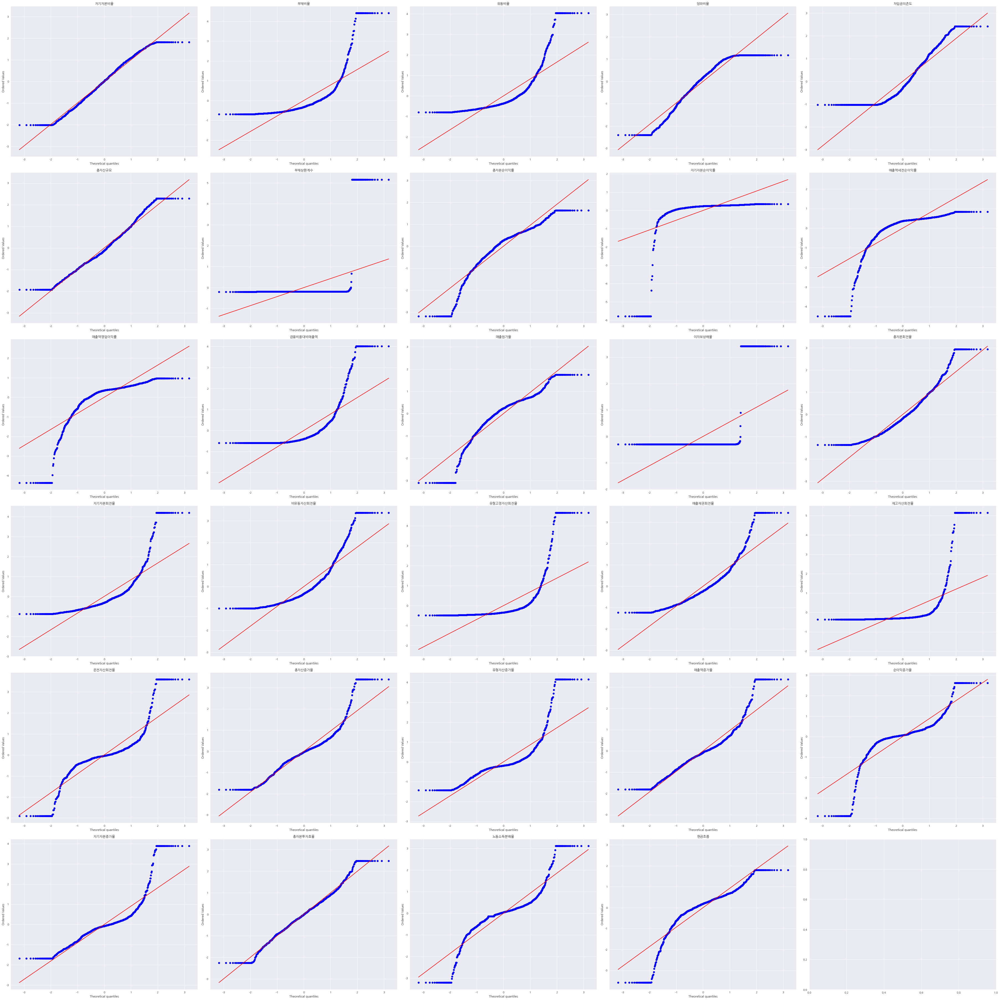

In [33]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "NanumGothic"

ncols = 5
nrows = 6

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), x3_sd):
       stats.probplot(x3_sd[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### - 독립성 검정
- 자료 수집이 무선표집(random sampling)되었다면 만족한다고 봄

### - 등분산성 검정
- H0 : 모집단의 표준편차가 같다(등분산)
- H1 : 모집단의 표준편차가 다르다(이분산)

In [25]:
# H가 1인 경우 이분산성
from scipy.stats import bartlett
def bartlett_test(col, good, bad, p_value = 0.05, H = 1):
    list= []
    for i in col:
        T, p_val =bartlett(good[i], bad[i]) 
        list.append([i, p_val])

    list = pd.DataFrame(list, columns = ['변수', 'p_value'])
    if H == 1:
        a = list[(list['p_value'] < p_value)][['변수', 'p_value']].sort_values('p_value')
        return a
    else:
        a = list[(list['p_value'] >= p_value)][['변수', 'p_value']].sort_values('p_value')
        return a

In [26]:
# 이분산성 변수
x_hetero_sd = bartlett_test(x3_sd.columns, df_final_x3_sd[df_final_x3_sd['y']==0], df_final_x3_sd[df_final_x3_sd['y']==1], H = 1)
x_hetero_sd

,변수,p_value
28,현금흐름,0.000000e+00
1,부채비율,0.000000e+00
22,유형자산증가율,0.000000e+00
11,금융비용대비매출액,0.000000e+00
8,자기자본순이익률,0.000000e+00
15,자기자본회전율,1.050863e-305
9,매출액세전순이익률,2.843632e-284
25,자기자본증가율,3.582216e-253
17,유형고정자산회전율,2.529598e-227
24,순이익증가율,4.340822e-161


In [28]:
# 등분산성 변수
x_homo_sd =bartlett_test(x3_sd.columns, df_final_x3_sd[df_final_x3_sd['y']==0], df_final_x3_sd[df_final_x3_sd['y']==1], H = 0)
x_homo_sd

,변수,p_value
5,총자산규모,0.058306


### 2-1-5. T-test(등분산성,이분산성 변수가 있다는 가정 하에)

In [29]:
# 1) t_test
import scipy.stats as stats
def t_test(col, col_h0, col_h1, good, bad, p_value = 0.05):
    list= []
    for i in col:
        if (col_h0['변수']==i).any():
            t_stat, p_val = stats.ttest_ind(good[i], bad[i], equal_var=True, alternative='two-sided')
            list.append([i, p_val])
        elif (col_h1['변수']==i).any():
            t_stat, p_val = stats.ttest_ind(good[i], bad[i], equal_var=False, alternative='two-sided')
            list.append([i, p_val])

    list = pd.DataFrame(list, columns = ['변수', 'p_value'])
    a = list[(list['p_value'] < p_value)][['변수', 'p_value']].sort_values('p_value')
    return a

In [30]:
# 2) t_test 결과 p_value < 0.05보다 작은 유의한 변수 가져오기
x_ttest_sd = t_test(x3_sd.columns, x_homo_sd, x_hetero_sd, df_final_x3_sd[df_final_x3_sd['y']==0], df_final_x3_sd[df_final_x3_sd['y']==1], p_value=0.05)
x_ttest_sd

,변수,p_value
0,자기자본비율,7.304718e-41
5,총자산규모,3.665042e-36
7,총자본순이익률,1.196899e-33
26,총자본투자효율,1.860080e-33
14,총자본회전율,1.688307e-23
21,총자산증가율,8.392682e-16
8,자기자본순이익률,5.434722e-08
18,매출채권회전율,6.726408e-08
12,매출원가율,3.195533e-07
16,비유동자산회전율,1.739722e-06


In [31]:
# 3) t test 유의한 변수들만 모은 데이터 프레임
x_ttest_sd = x_ttest_sd.reset_index(drop=True)['변수']
x_ttest_sd[x_ttest_sd.index.max()+1] = 'y'
df_final_ttest_sd = df_final[x_ttest_sd]
df_final_ttest_sd

,자기자본비율,총자산규모,총자본순이익률,총자본투자효율,총자본회전율,총자산증가율,자기자본순이익률,매출채권회전율,매출원가율,비유동자산회전율,이자보상배율,부채상환계수,금융비용대비매출액,유동비율,유형고정자산회전율,현금흐름,매출액증가율,매출액세전순이익률,y
0,41.659492,17.583764,-10.714159,-3.355146,48.828101,-40.698452,-25.718411,207.069186,95.288833,138.838749,-720.507696,-89.560725,2.181178,171.652368,268.103732,17.397557,-10.095643,-21.942609,1.0
1,20.669768,17.714853,-7.445354,2.745650,45.552250,-18.218210,-36.020500,326.816705,69.517934,67.653693,-135.010369,7.374011,5.820381,51.192980,119.206669,-8.818698,-20.337630,-16.344645,1.0
2,48.368876,17.067764,-15.116177,5.770305,41.400582,-47.643241,-31.251866,252.028667,70.540226,69.634708,32.124816,-358.813255,2.936858,324.774250,133.138224,7.409362,-37.703368,-36.511991,1.0
3,37.021190,17.231392,-35.200343,-6.899849,20.390178,0.766632,-95.081608,433.103612,60.812603,37.308653,-166.569488,-144.152613,43.259518,41.744283,58.269717,-45.108715,-7.731282,-172.633813,1.0
4,-12.754704,16.765759,-17.252203,-0.120078,13.032479,-37.226271,-6691.365964,356.074466,39.940751,16.988581,-75.420044,-34.427106,73.155331,17.931353,37.846882,17.882626,-47.782566,-132.378523,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.079812,17.722137,-2.380746,-0.804465,11.103961,-4.626905,-2.557747,142.098806,42.938472,82.824390,-10533.731559,716.861254,0.390697,2761.424968,160.078301,-4.101015,-22.856771,-21.440514,0.0
934,59.525673,18.877611,-3.382666,3.849428,37.316334,33.344563,-5.682701,245.222662,70.527446,62.300649,-33.537862,10.571588,7.246359,117.374389,113.380942,8.226030,-17.232473,-9.064840,0.0
935,89.105169,18.861992,-0.594747,5.070220,33.663323,-1.888743,-0.667466,686.028360,65.557883,65.255327,-520.817803,506.016413,0.069561,629.191005,72.544454,4.800863,-7.706858,-1.766750,0.0
936,32.634844,18.960815,-14.352540,-3.525107,102.780809,6.921679,-43.979190,190.586116,100.324936,515.545287,-297.795205,-51.875354,1.586723,135.740416,1136.845208,-69.421513,124.657694,-13.964222,0.0


### 2-1-6. Lasso
(다음에는 c값을 조절해서 적당한 수의 피처만을 사용할 것)

In [32]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel

lasso = SelectFromModel(LogisticRegression(C=1, penalty='l1',solver='liblinear'))
lasso.fit(x3_sd, df_final_x3_sd['y'])
lasso_support = lasso.get_support()
lr_feature_sd = x3_sd.loc[:,lasso_support].columns.tolist()
print(str(len(lr_feature_sd)), 'selected features')

29 selected features


In [33]:
# lasso 선택된 변수들만 모은 데이터 프레임
lr_feature_sd.append('y')
df_final_lasso_sd = df_final[lr_feature_sd]
df_final_lasso_sd

,자기자본비율,부채비율,유동비율,당좌비율,차입금의존도,총자산규모,부채상환계수,총자본순이익률,자기자본순이익률,매출액세전순이익률,...,운전자산회전율,총자산증가율,유형자산증가율,매출액증가율,순이익증가율,자기자본증가율,총자본투자효율,노동소득분배율,현금흐름,y
0,41.659492,78.715434,171.652368,97.346502,12.303099,17.583764,-89.560725,-10.714159,-25.718411,-21.942609,...,260.835838,-40.698452,-7.485894,-10.095643,-146.148683,-36.568135,-3.355146,-99.011783,17.397557,1.0
1,20.669768,335.311991,51.192980,78.536538,36.337895,17.714853,7.374011,-7.445354,-36.020500,-16.344645,...,-163.121344,-18.218210,21.664094,-20.337630,-231.855405,-55.327901,2.745650,193.362805,-8.818698,1.0
2,48.368876,42.093766,324.774250,80.879343,0.598762,17.067764,-358.813255,-15.116177,-31.251866,-36.511991,...,155.943863,-47.643241,-98.376233,-37.703368,-239.163255,60.397782,5.770305,76.620945,7.409362,1.0
3,37.021190,171.147017,41.744283,76.596773,6.594573,17.231392,-144.152613,-35.200343,-95.081608,-172.633813,...,-58.441035,0.766632,38.002005,-7.731282,-442.614164,-8.762799,-6.899849,-69.583921,-45.108715,1.0
4,-12.754704,-704.718468,17.931353,77.878012,6.355326,16.765759,-34.427106,-17.252203,-6691.365964,-132.378523,...,-17.828586,-37.226271,-61.348826,-47.782566,-140.041210,-128.146832,-0.120078,-2612.069777,17.882626,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.079812,4.890369,2761.424968,96.465210,0.000000,17.722137,716.861254,-2.380746,-2.557747,-21.440514,...,14.103125,-4.626905,45.244686,-22.856771,-326.947283,-2.185597,-0.804465,-337.923284,-4.101015,0.0
934,59.525673,92.000919,117.374389,75.839411,27.414434,18.877611,10.571588,-3.382666,-5.682701,-9.064840,...,595.979618,33.344563,2.677153,-17.232473,-853.589342,66.091353,3.849428,101.143427,8.226030,0.0
935,89.105169,11.156992,629.191005,78.976175,0.700766,18.861992,506.016413,-0.594747,-0.667466,-1.766750,...,92.219919,-1.888743,19.122630,-7.706858,-110.388840,-3.774855,5.070220,76.633829,4.800863,0.0
936,32.634844,216.670953,135.740416,100.000000,17.276681,18.960815,-51.875354,-14.352540,-43.979190,-13.964222,...,453.226828,6.921679,-2.693640,124.657694,-2427.908560,55.448194,-3.525107,-28.575109,-69.421513,0.0


In [34]:
lr_feature_sd

['자기자본비율',
 '부채비율',
 '유동비율',
 '당좌비율',
 '차입금의존도',
 '총자산규모',
 '부채상환계수',
 '총자본순이익률',
 '자기자본순이익률',
 '매출액세전순이익률',
 '매출액영업이익률',
 '금융비용대비매출액',
 '매출원가율',
 '이자보상배율',
 '총자본회전율',
 '자기자본회전율',
 '비유동자산회전율',
 '유형고정자산회전율',
 '매출채권회전율',
 '재고자산회전율',
 '운전자산회전율',
 '총자산증가율',
 '유형자산증가율',
 '매출액증가율',
 '순이익증가율',
 '자기자본증가율',
 '총자본투자효율',
 '노동소득분배율',
 '현금흐름',
 'y']

### 2-1-7. Stepwise

In [35]:
def stepwise_feature_selection(feature, target, variables):
    import statsmodels.api as sm
    import matplotlib.pyplot as plt
    import warnings
    import pandas as pd
    warnings.filterwarnings("ignore")
    
    y = target ## 반응 변수

    selected_variables = [] ## 선택된 변수들
    sl_enter = 0.05
    sl_remove = 0.05
    
    sv_per_step = [] ## 각 스텝별로 선택된 변수들
    r_squared = [] ## 각 스텝별 수정된 결정계수
    steps = [] ## 스텝
    step = 0
    while len(variables) > 0:
        remainder = list(set(variables) - set(selected_variables))
        pval = pd.Series(index=remainder) ## 변수의 p-value
        ## 기존에 포함된 변수와 새로운 변수 하나씩 돌아가면서
        ## 선형 모형을 적합한다.
        for col in remainder: 
            X = feature[selected_variables+[col]]
            model = sm.Logit(y,X).fit(disp=0)
            pval[col] = model.pvalues[col]
    
        min_pval = pval.min()
        if min_pval < sl_enter: ## 최소 p-value 값이 기준 값보다 작으면 포함
            selected_variables.append(pval.idxmin())
            ## 선택된 변수들에대해서
            ## 어떤 변수를 제거할지 고른다.
            while len(selected_variables) > 0:
                selected_X = feature[selected_variables]
                selected_pval = sm.Logit(y,selected_X).fit(disp=0).pvalues[:]
                max_pval = selected_pval.max()
                if max_pval >= sl_remove: ## 최대 p-value값이 기준값보다 크거나 같으면 제외
                    remove_variable = selected_pval.idxmax()
                    selected_variables.remove(remove_variable)
                else:
                    break
            
            step += 1
            steps.append(step)
            presudo_r_squared = sm.Logit(y,feature[selected_variables]).fit(disp=0).prsquared
            r_squared.append(presudo_r_squared)
            sv_per_step.append(selected_variables.copy())
        else:
            break

    
    # 시각화
    fig = plt.figure(figsize=(40,40))
    plt.xticks(steps,[f'step {s}\n'+'\n'.join(sv_per_step[i]) for i,s in enumerate(steps)])
    plt.plot(steps,r_squared, marker='o')
    plt.ylabel('pseudo R Squared')
    plt.grid(True)
    plt.show()

    return selected_variables
    
selected_variables = stepwise_feature_selection(x3_sd, df_final_x3_sd['y'],x3_sd.columns.tolist())

### 2-1-7. 선택 -> Step8
'총자본순이익률','자기자본비율','총자산규모','총자본회전율','자기자본증가율','차입금의존도','자기자본회전율,'총자산증가율'

In [37]:
# select된 변수 들고오기
select_sd = ['총자본순이익률','자기자본비율','총자산규모','총자본회전율','자기자본증가율','차입금의존도','자기자본회전율','총자산증가율']
select_sd.append('y')
df_select_sd = df_final[select_sd]
df_select_sd

,총자본순이익률,자기자본비율,총자산규모,총자본회전율,자기자본증가율,차입금의존도,자기자본회전율,총자산증가율,y
0,-10.714159,41.659492,17.583764,48.828101,-36.568135,12.303099,117.207626,-40.698452,1.0
1,-7.445354,20.669768,17.714853,45.552250,-55.327901,36.337895,220.381043,-18.218210,1.0
2,-15.116177,48.368876,17.067764,41.400582,60.397782,0.598762,85.593433,-47.643241,1.0
3,-35.200343,37.021190,17.231392,20.390178,-8.762799,6.594573,55.077048,0.766632,1.0
4,-17.252203,-12.754704,16.765759,13.032479,-128.146832,6.355326,-102.177825,-37.226271,1.0
...,...,...,...,...,...,...,...,...,...
933,-2.380746,93.079812,17.722137,11.103961,-2.185597,0.000000,11.929506,-4.626905,0.0
934,-3.382666,59.525673,18.877611,37.316334,66.091353,27.414434,62.689478,33.344563,0.0
935,-0.594747,89.105169,18.861992,33.663323,-3.774855,0.700766,37.779315,-1.888743,0.0
936,-14.352540,32.634844,18.960815,102.780809,55.448194,17.276681,314.941934,6.921679,0.0


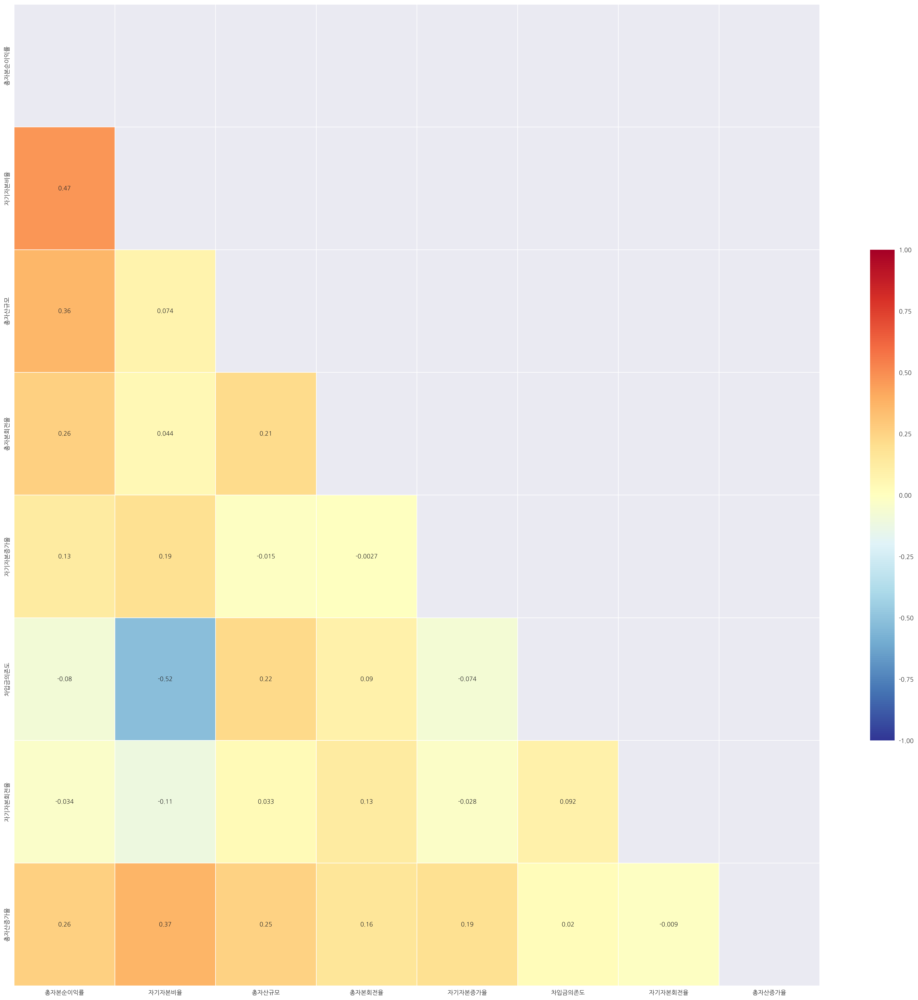

In [42]:
# 상관행렬 시각화
mask_ut=np.triu(np.ones(df_select_sd.drop('y',axis=1).corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(df_select_sd.drop('y',axis=1).corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut, vmin=-1, vmax=1)
plt.show()

In [43]:
df_final_sd_full = pd.concat([df_select_sd, df_final[['감사의견코드','광업', '교육 서비스업', '도매 및 소매업',
       '사업시설 관리, 사업 지원 및 임대 서비스업', '수도, 하수 및 폐기물 처리, 원료 재생업',
       '예술, 스포츠 및 여가관련 서비스업', '전기, 가스, 증기 및 공기조절 공급업', '전문, 과학 및 기술 서비스업',
       '정보통신업', '제조업','회계년도']]],axis=1)
df_final_sd_full

,총자본순이익률,자기자본비율,총자산규모,총자본회전율,자기자본증가율,차입금의존도,자기자본회전율,총자산증가율,y,감사의견코드,...,교육 서비스업,도매 및 소매업,"사업시설 관리, 사업 지원 및 임대 서비스업","수도, 하수 및 폐기물 처리, 원료 재생업","예술, 스포츠 및 여가관련 서비스업","전기, 가스, 증기 및 공기조절 공급업","전문, 과학 및 기술 서비스업",정보통신업,제조업,회계년도
0,-10.714159,41.659492,17.583764,48.828101,-36.568135,12.303099,117.207626,-40.698452,1.0,1,...,0,0,0,0,0,0,0,0,1,2020
1,-7.445354,20.669768,17.714853,45.552250,-55.327901,36.337895,220.381043,-18.218210,1.0,1,...,0,0,0,0,0,0,0,1,0,2014
2,-15.116177,48.368876,17.067764,41.400582,60.397782,0.598762,85.593433,-47.643241,1.0,1,...,0,0,0,0,0,0,0,1,0,2015
3,-35.200343,37.021190,17.231392,20.390178,-8.762799,6.594573,55.077048,0.766632,1.0,0,...,0,0,0,0,0,0,0,1,0,2019
4,-17.252203,-12.754704,16.765759,13.032479,-128.146832,6.355326,-102.177825,-37.226271,1.0,1,...,0,0,0,0,0,0,0,1,0,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,-2.380746,93.079812,17.722137,11.103961,-2.185597,0.000000,11.929506,-4.626905,0.0,1,...,0,0,0,0,0,0,0,0,1,2020
934,-3.382666,59.525673,18.877611,37.316334,66.091353,27.414434,62.689478,33.344563,0.0,1,...,0,0,0,0,0,0,0,0,1,2020
935,-0.594747,89.105169,18.861992,33.663323,-3.774855,0.700766,37.779315,-1.888743,0.0,1,...,0,0,0,0,0,0,0,0,1,2020
936,-14.352540,32.634844,18.960815,102.780809,55.448194,17.276681,314.941934,6.921679,0.0,1,...,0,0,0,0,0,0,0,0,1,2020


In [44]:
df_final_sd_full.to_csv('./data/df_final_sd_full.csv')

## 2-2. RobustScaler

In [45]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
x_robust_df = scaler.fit_transform(x)
x_robust_df = pd.DataFrame(x_robust_df, columns = x.columns)
x_robust_df.head()

,자기자본비율,부채비율,유동비율,당좌비율,차입금의존도,매출액규모,총자산규모,부채상환계수,총자본순이익률,자본금세전순이익률,...,운전자산회전율,총자산증가율,유형자산증가율,매출액증가율,순이익증가율,자기자본증가율,총자본투자효율,부가가치율,노동소득분배율,현금흐름
0,-0.275426,-0.038241,0.174698,0.557653,0.060809,-0.035117,-0.405864,-0.892581,-0.733283,-0.758532,...,0.439363,-1.352154,-0.190819,-0.188306,-0.089330,-0.894873,-0.680383,-0.608168,-1.520764,0.803512
1,-0.828987,1.927273,-0.495374,-0.155032,1.072145,-0.105155,-0.298865,-0.000471,-0.477911,-0.505619,...,-0.664909,-0.576194,0.734694,-0.417854,-0.423682,-1.357326,-0.022289,0.015436,2.045188,-0.342511
2,-0.098480,-0.318761,1.026460,-0.066266,-0.431686,-0.364582,-0.827039,-3.370565,-1.077187,-0.025241,...,0.166153,-1.591870,-2.550914,-0.807063,-0.452191,1.495466,0.303981,0.397864,0.621344,0.366886
3,-0.397752,0.669779,-0.547934,-0.228527,-0.179395,-0.870770,-0.693481,-1.395000,-2.646244,-2.652625,...,-0.392251,0.079113,1.253423,-0.135315,-1.245878,-0.209435,-1.062751,-1.911945,-1.161847,-1.928901
4,-1.343924,-0.613992,-0.663485,-0.179983,-0.189462,-1.226943,-1.073546,-0.385175,-1.244062,-1.270242,...,-0.286468,-1.232303,-1.900968,-1.032963,-0.065504,-2.393862,-0.331416,-0.320512,-5.411815,0.824716


### 2-2-1. 히트맵을 이용한 다중공선성확인

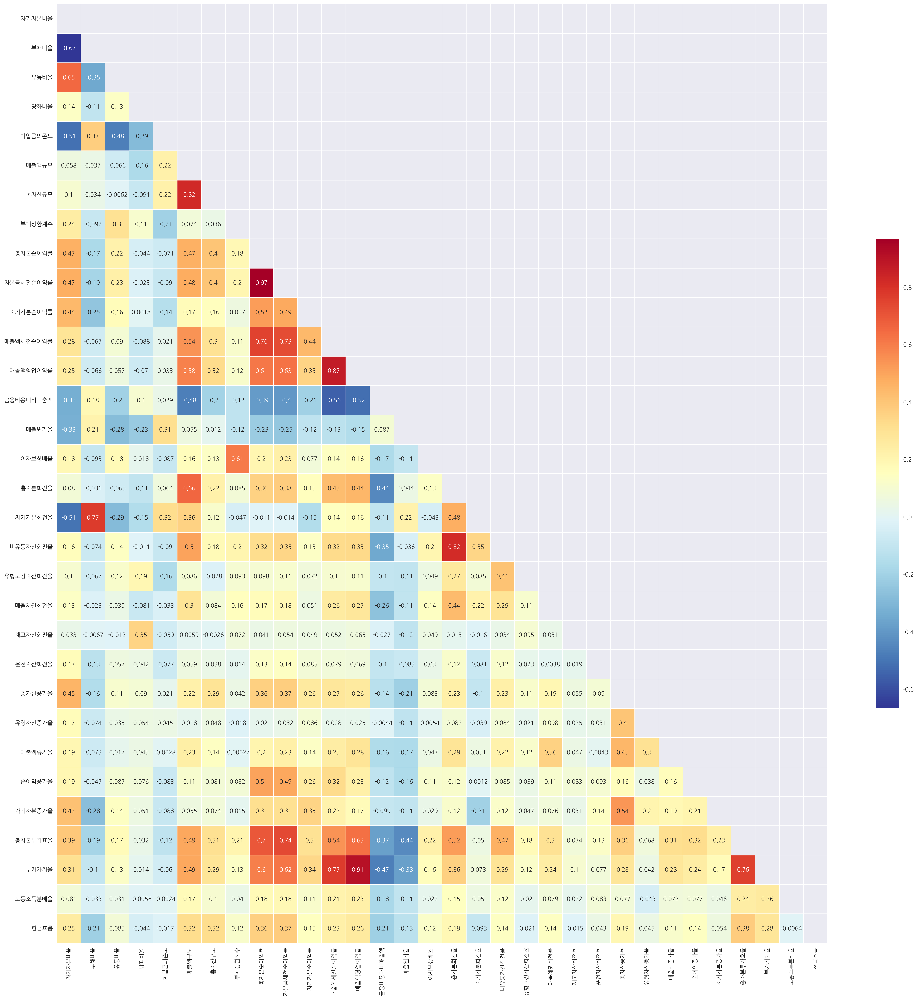

In [194]:
# 3. robust 상관행렬 시각화
mask_ut=np.triu(np.ones(x_robust_df.corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(x_robust_df.corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut)
plt.show()

### 2-2-2.피처의 유의성검정

In [48]:
# 1-1) 상수항 추가
x_ = sm.add_constant(x_robust_df, has_constant = "add")

# 1-2) 회귀모델 적합
multi_model2 = sm.Logit(df_final[['y']], x_)
fitted_multi_model2 = multi_model2.fit()

# 1-3) 결과 출력
fitted_multi_model2.summary()

Optimization terminated successfully.
         Current function value: 0.402197
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  938
Model:                          Logit   Df Residuals:                      905
Method:                           MLE   Df Model:                           32
Date:                Thu, 29 Sep 2022   Pseudo R-squ.:                  0.4198
Time:                        10:21:07   Log-Likelihood:                -377.26
converged:                       True   LL-Null:                       -650.17
Covariance Type:            nonrobust   LLR p-value:                 8.406e-95
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2355      0.167      1.412      0.158      -0.091       0.562
자기자본비율        -0.9158      0.405     -2.263      0.024      -1.709      -0.123
부채비율           0.2416      0.232      1.043      0.297      -0.212       0.696
유동비율          -0.1835      0.090     -2.041      0.041      -0.360      -0.007
당좌비율           0.0243      0.169      0.144      0.886      -0.307       0.356
차입금의존도        -0.8675      0.220     -3.935      0.000      -1.300      -0.435
매출액규모         -1.2028      0.671     -1.791      0.073      -2.519       0.113
총자산규모         -0.1524      0.465     -0.328      0.743      -1.064       0.759
부채상환계수      5.192e-06   4.05e-06      1.282      0.200   -2.74e-06    1.31e-05
총자본순이익률       -2.1997      0.832     -2.645      0.008      -3.830      -0.570
자본금세전순이익률      1.2161      0.764      1.593      0.111      -0.281       2.713
자기자본순이익률      -0.1153      0.088     -1.317      0.188      -0.287       0.056
매출액세전순이익률      0.1934      0.146      1.325      0.185      -0.093       0.479
매출액영업이익률       0.3434      0.238      1.443      0.149      -0.123       0.810
금융비용대비매출액     -0.0073      0.092     -0.080      0.936      -0.187       0.172
매출원가율          0.1090      0.124      0.877      0.380      -0.135       0.353
이자보상배율      7.153e-06   2.92e-05      0.245      0.806      -5e-05    6.43e-05
총자본회전율        -0.8769      0.479     -1.830      0.067      -1.816       0.062
자기자본회전율        0.5412      0.255      2.124      0.034       0.042       1.041
비유동자산회전율      -0.2317      0.181     -1.279      0.201      -0.587       0.123
유형고정자산회전율     -0.0485      0.031     -1.548      0.122      -0.110       0.013
매출채권회전율       -0.2711      0.115     -2.351      0.019      -0.497      -0.045
재고자산회전율       -0.0082      0.013     -0.641      0.521      -0.033       0.017
운전자산회전율        0.0082      0.048      0.169      0.866      -0.086       0.103
총자산증가율        -0.5474      0.141     -3.895      0.000      -0.823      -0.272
유형자산증가율       -0.0469      0.046     -1.013      0.311      -0.137       0.044
매출액증가율         0.1990      0.105      1.889      0.059      -0.007       0.405
순이익증가율         0.0146      0.049      0.298      0.766      -0.081       0.111
자기자본증가율        0.5764      0.108      5.342      0.000       0.365       0.788
총자본투자효율        0.6186      0.323      1.913      0.056      -0.015       1.253
부가가치율         -0.5118      0.296     -1.730      0.084      -1.092       0.068
노동소득분배율       -0.0414      0.056     -0.744      0.457      -0.150       0.068
현금흐름          -0.2162      0.126     -1.716      0.086      -0.463       0.031
==============================================================================
"""

In [49]:
# 2) 유의한 변수들만 보이기
list_ = pd.DataFrame(fitted_multi_model2.pvalues, columns = ['p_value'])
list_[(list_['p_value'] < 0.05)][['p_value']].sort_values('p_value')

,p_value
자기자본증가율,9.208284e-08
차입금의존도,8.308543e-05
총자산증가율,9.837496e-05
총자본순이익률,8.167253e-03
매출채권회전율,1.874820e-02
자기자본비율,2.363853e-02
자기자본회전율,3.369971e-02
유동비율,4.121449e-02


### 2-2-3. VIF를 이용한 다중공선성 확인

In [50]:
vif(x_robust_df)

,VIF Factor,features
0,24.338957,매출액규모
1,22.970171,총자본순이익률
2,19.972806,자본금세전순이익률
3,14.534551,매출액영업이익률
4,13.701630,부가가치율
5,13.353206,총자산규모
6,10.574959,총자본회전율
7,9.365947,매출액세전순이익률
8,9.203223,자기자본회전율
9,7.699128,부채비율


In [51]:
# 매출액규모
x1_rb = x_robust_df.drop('매출액규모',axis = 1)
# vif 확인
vif(x1_rb)

,VIF Factor,features
0,22.628652,총자본순이익률
1,19.948390,자본금세전순이익률
2,13.673029,매출액영업이익률
3,13.608238,부가가치율
4,9.202259,자기자본회전율
5,8.980623,매출액세전순이익률
6,7.695430,부채비율
7,7.142981,총자본회전율
8,6.462306,총자본투자효율
9,5.658672,자기자본비율


In [52]:
# 자본금세전순이익률
x2_rb = x1_rb.drop('자본금세전순이익률',axis = 1)
# vif 확인
vif(x2_rb)

,VIF Factor,features
0,13.459549,부가가치율
1,13.431286,매출액영업이익률
2,9.201951,자기자본회전율
3,8.947617,매출액세전순이익률
4,7.692801,부채비율
5,7.132155,총자본회전율
6,6.875396,총자본순이익률
7,6.234749,총자본투자효율
8,5.655748,자기자본비율
9,3.905833,비유동자산회전율


In [53]:
# 부가가치율
x3_rb = x2_rb.drop('부가가치율',axis = 1)
# vif 확인
df_x3_rb = vif(x3_rb)
df_x3_rb

,VIF Factor,features
0,9.181267,자기자본회전율
1,8.816639,매출액세전순이익률
2,7.634590,부채비율
3,7.053173,총자본회전율
4,6.412533,총자본순이익률
5,6.324967,매출액영업이익률
6,5.652369,자기자본비율
7,4.268512,총자본투자효율
8,3.905334,비유동자산회전율
9,2.495351,유동비율


In [54]:
# 3) 다중 공선성이 없는 변수들만 모은 데이터 프레임
df_x3_rb = df_x3_rb.reset_index(drop=True)['features']
df_x3_rb[df_x3_rb.index.max()+1] = 'y'
df_final_x3_rb = df_final[df_x3_rb]
df_final_x3_rb

,자기자본회전율,매출액세전순이익률,부채비율,총자본회전율,총자본순이익률,매출액영업이익률,자기자본비율,총자본투자효율,비유동자산회전율,유동비율,...,매출채권회전율,매출액증가율,현금흐름,당좌비율,유형고정자산회전율,유형자산증가율,재고자산회전율,노동소득분배율,운전자산회전율,y
0,117.207626,-21.942609,78.715434,48.828101,-10.714159,-15.715555,41.659492,-3.355146,138.838749,171.652368,...,207.069186,-10.095643,17.397557,97.346502,268.103732,-7.485894,4103.261605,-99.011783,260.835838,1.0
1,220.381043,-16.344645,335.311991,45.552250,-7.445354,-7.858118,20.669768,2.745650,67.653693,51.192980,...,326.816705,-20.337630,-8.818698,78.536538,119.206669,21.664094,724.574248,193.362805,-163.121344,1.0
2,85.593433,-36.511991,42.093766,41.400582,-15.116177,0.943460,48.368876,5.770305,69.634708,324.774250,...,252.028667,-37.703368,7.409362,80.879343,133.138224,-98.376233,564.456445,76.620945,155.943863,1.0
3,55.077048,-172.633813,171.147017,20.390178,-35.200343,-72.057157,37.021190,-6.899849,37.308653,41.744283,...,433.103612,-7.731282,-45.108715,76.596773,58.269717,38.002005,348.484688,-69.583921,-58.441035,1.0
4,-102.177825,-132.378523,-704.718468,13.032479,-17.252203,-55.173783,-12.754704,-0.120078,16.988581,17.931353,...,356.074466,-47.782566,17.882626,77.878012,37.846882,-61.348826,368.856097,-2612.069777,-17.828586,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,11.929506,-21.440514,4.890369,11.103961,-2.380746,-41.154948,93.079812,-0.804465,82.824390,2761.424968,...,142.098806,-22.856771,-4.101015,96.465210,160.078301,45.244686,384.532165,-337.923284,14.103125,0.0
934,62.689478,-9.064840,92.000919,37.316334,-3.382666,-2.430274,59.525673,3.849428,62.300649,117.374389,...,245.222662,-17.232473,8.226030,75.839411,113.380942,2.677153,365.140571,101.143427,595.979618,0.0
935,37.779315,-1.766750,11.156992,33.663323,-0.594747,-0.362284,89.105169,5.070220,65.255327,629.191005,...,686.028360,-7.706858,4.800863,78.976175,72.544454,19.122630,368.929136,76.633829,92.219919,0.0
936,314.941934,-13.964222,216.670953,102.780809,-14.352540,-4.725185,32.634844,-3.525107,515.545287,135.740416,...,190.586116,124.657694,-69.421513,100.000000,1136.845208,-2.693640,0.000000,-28.575109,453.226828,0.0


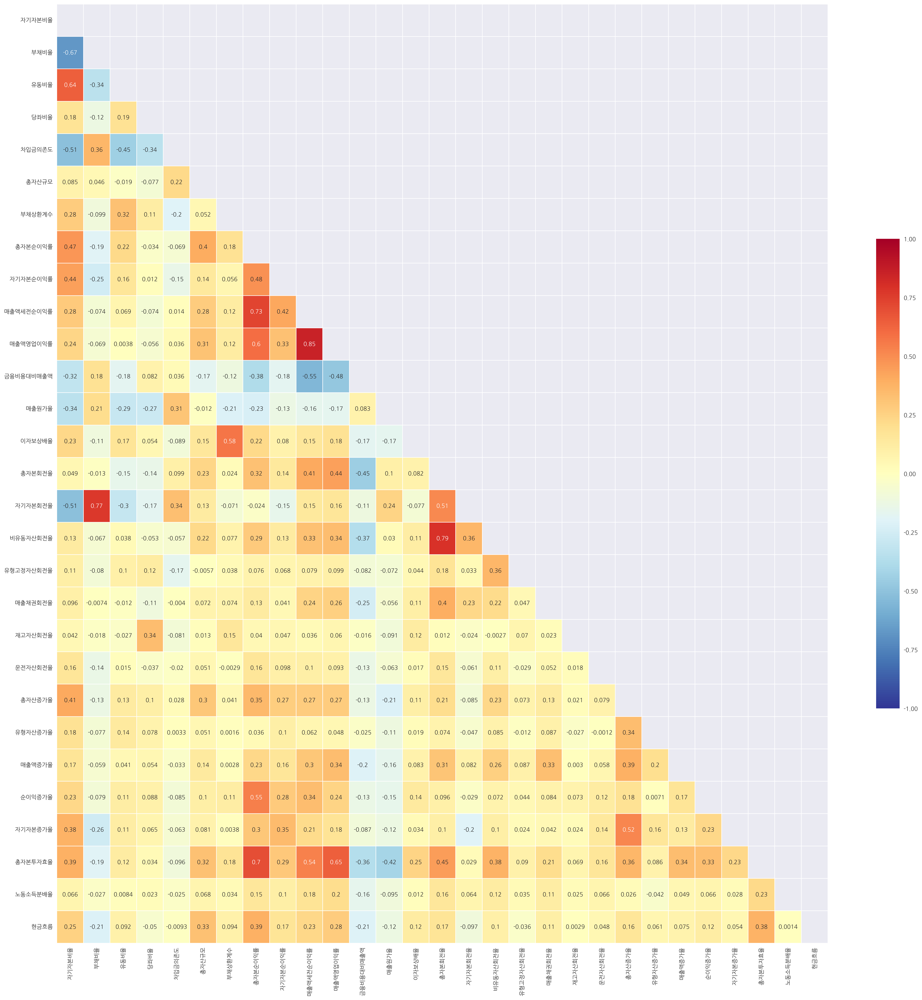

In [55]:
# 4) 상관행렬 시각화
mask_ut=np.triu(np.ones(x3_rb.corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(x3_rb.corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut, vmin=-1, vmax=1)
plt.show()

### 2-2-4. 로지스틱 회귀 전 정규성 검정, 독립성 검정, 등분산성 검정

In [56]:
normal_s,notnormal_s = normal_test('shapiro',x3_rb)
normal_s

,normal


In [57]:
normal_a,notnormal_a = normal_test('anderson',x3_rb)
normal_a

,normal


In [58]:
normal_ks,notnormal_ks = normal_test('kstest',x3_rb)
normal_ks

,normal


- (추가) qqplot

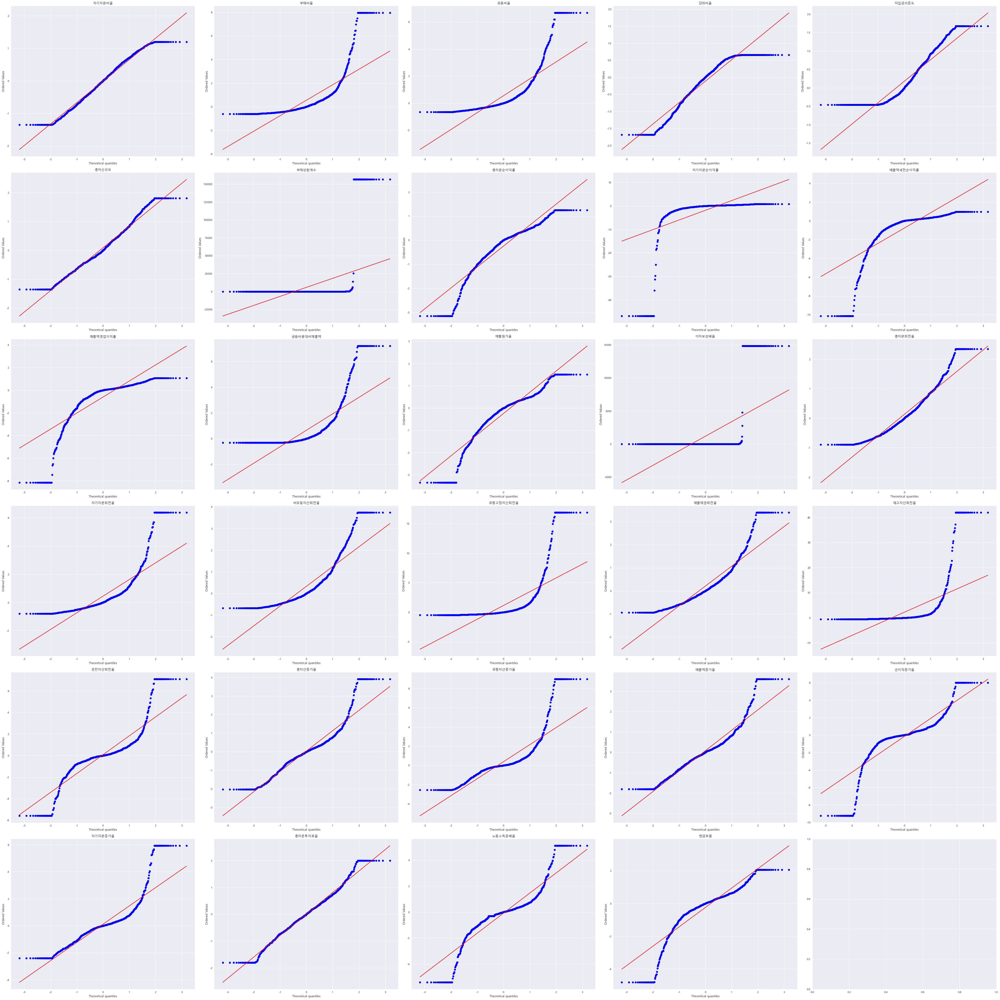

In [59]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 6

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), x3_rb):
       stats.probplot(x3_rb[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

In [60]:
# 이분산성 변수
x_hetero_rb = bartlett_test(x3_rb.columns, df_final_x3_rb[df_final_x3_rb['y']==0], df_final_x3_rb[df_final_x3_rb['y']==1], H = 1)
x_hetero_rb

,변수,p_value
28,현금흐름,0.000000e+00
1,부채비율,0.000000e+00
22,유형자산증가율,0.000000e+00
11,금융비용대비매출액,0.000000e+00
8,자기자본순이익률,0.000000e+00
15,자기자본회전율,1.050863e-305
9,매출액세전순이익률,2.843632e-284
25,자기자본증가율,3.582216e-253
17,유형고정자산회전율,2.529598e-227
24,순이익증가율,4.340822e-161


In [61]:
# 등분산성 변수
x_homo_rb =bartlett_test(x3_rb.columns, df_final_x3_rb[df_final_x3_rb['y']==0], df_final_x3_rb[df_final_x3_rb['y']==1], H = 0)
x_homo_rb

,변수,p_value
5,총자산규모,0.058306


### 2-2-5. T-test(등분산성,이분산성 변수가 있다는 가정 하에)

In [62]:
# 1) t_test 결과 p_value < 0.05보다 작은 유의한 변수 가져오기
x_ttest_rb = t_test(x3_rb.columns, x_homo_rb, x_hetero_rb, df_final_x3_rb[df_final_x3_rb['y']==0], df_final_x3_rb[df_final_x3_rb['y']==1], p_value=0.05)
x_ttest_rb

,변수,p_value
0,자기자본비율,7.304718e-41
5,총자산규모,3.665042e-36
7,총자본순이익률,1.196899e-33
26,총자본투자효율,1.860080e-33
14,총자본회전율,1.688307e-23
21,총자산증가율,8.392682e-16
8,자기자본순이익률,5.434722e-08
18,매출채권회전율,6.726408e-08
12,매출원가율,3.195533e-07
16,비유동자산회전율,1.739722e-06


In [64]:
# 2) t test 유의한 변수들만 모은 데이터 프레임
x_ttest_rb = x_ttest_rb.reset_index(drop=True)['변수']
x_ttest_rb[x_ttest_rb.index.max()+1] = 'y'
df_final_ttest_rb = df_final[x_ttest_rb]
df_final_ttest_rb

,자기자본비율,총자산규모,총자본순이익률,총자본투자효율,총자본회전율,총자산증가율,자기자본순이익률,매출채권회전율,매출원가율,비유동자산회전율,이자보상배율,부채상환계수,금융비용대비매출액,유동비율,유형고정자산회전율,현금흐름,매출액증가율,매출액세전순이익률,y
0,41.659492,17.583764,-10.714159,-3.355146,48.828101,-40.698452,-25.718411,207.069186,95.288833,138.838749,-720.507696,-89.560725,2.181178,171.652368,268.103732,17.397557,-10.095643,-21.942609,1.0
1,20.669768,17.714853,-7.445354,2.745650,45.552250,-18.218210,-36.020500,326.816705,69.517934,67.653693,-135.010369,7.374011,5.820381,51.192980,119.206669,-8.818698,-20.337630,-16.344645,1.0
2,48.368876,17.067764,-15.116177,5.770305,41.400582,-47.643241,-31.251866,252.028667,70.540226,69.634708,32.124816,-358.813255,2.936858,324.774250,133.138224,7.409362,-37.703368,-36.511991,1.0
3,37.021190,17.231392,-35.200343,-6.899849,20.390178,0.766632,-95.081608,433.103612,60.812603,37.308653,-166.569488,-144.152613,43.259518,41.744283,58.269717,-45.108715,-7.731282,-172.633813,1.0
4,-12.754704,16.765759,-17.252203,-0.120078,13.032479,-37.226271,-6691.365964,356.074466,39.940751,16.988581,-75.420044,-34.427106,73.155331,17.931353,37.846882,17.882626,-47.782566,-132.378523,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.079812,17.722137,-2.380746,-0.804465,11.103961,-4.626905,-2.557747,142.098806,42.938472,82.824390,-10533.731559,716.861254,0.390697,2761.424968,160.078301,-4.101015,-22.856771,-21.440514,0.0
934,59.525673,18.877611,-3.382666,3.849428,37.316334,33.344563,-5.682701,245.222662,70.527446,62.300649,-33.537862,10.571588,7.246359,117.374389,113.380942,8.226030,-17.232473,-9.064840,0.0
935,89.105169,18.861992,-0.594747,5.070220,33.663323,-1.888743,-0.667466,686.028360,65.557883,65.255327,-520.817803,506.016413,0.069561,629.191005,72.544454,4.800863,-7.706858,-1.766750,0.0
936,32.634844,18.960815,-14.352540,-3.525107,102.780809,6.921679,-43.979190,190.586116,100.324936,515.545287,-297.795205,-51.875354,1.586723,135.740416,1136.845208,-69.421513,124.657694,-13.964222,0.0


### 2-2-6. Lasso

In [65]:
lasso = SelectFromModel(LogisticRegression(C=1, penalty='l1',solver='liblinear'))
lasso.fit(x3_rb, df_final_x3_rb['y'])
lasso_support = lasso.get_support()
lr_feature_rb = x3_rb.loc[:,lasso_support].columns.tolist()
print(str(len(lr_feature_rb)), 'selected features')

28 selected features


In [66]:
# lasso 선택된 변수들만 모은 데이터 프레임
lr_feature_rb.append('y')
df_final_lasso_rb = df_final[lr_feature_rb]
df_final_lasso_rb

,자기자본비율,부채비율,유동비율,당좌비율,차입금의존도,총자산규모,총자본순이익률,자기자본순이익률,매출액세전순이익률,매출액영업이익률,...,운전자산회전율,총자산증가율,유형자산증가율,매출액증가율,순이익증가율,자기자본증가율,총자본투자효율,노동소득분배율,현금흐름,y
0,41.659492,78.715434,171.652368,97.346502,12.303099,17.583764,-10.714159,-25.718411,-21.942609,-15.715555,...,260.835838,-40.698452,-7.485894,-10.095643,-146.148683,-36.568135,-3.355146,-99.011783,17.397557,1.0
1,20.669768,335.311991,51.192980,78.536538,36.337895,17.714853,-7.445354,-36.020500,-16.344645,-7.858118,...,-163.121344,-18.218210,21.664094,-20.337630,-231.855405,-55.327901,2.745650,193.362805,-8.818698,1.0
2,48.368876,42.093766,324.774250,80.879343,0.598762,17.067764,-15.116177,-31.251866,-36.511991,0.943460,...,155.943863,-47.643241,-98.376233,-37.703368,-239.163255,60.397782,5.770305,76.620945,7.409362,1.0
3,37.021190,171.147017,41.744283,76.596773,6.594573,17.231392,-35.200343,-95.081608,-172.633813,-72.057157,...,-58.441035,0.766632,38.002005,-7.731282,-442.614164,-8.762799,-6.899849,-69.583921,-45.108715,1.0
4,-12.754704,-704.718468,17.931353,77.878012,6.355326,16.765759,-17.252203,-6691.365964,-132.378523,-55.173783,...,-17.828586,-37.226271,-61.348826,-47.782566,-140.041210,-128.146832,-0.120078,-2612.069777,17.882626,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.079812,4.890369,2761.424968,96.465210,0.000000,17.722137,-2.380746,-2.557747,-21.440514,-41.154948,...,14.103125,-4.626905,45.244686,-22.856771,-326.947283,-2.185597,-0.804465,-337.923284,-4.101015,0.0
934,59.525673,92.000919,117.374389,75.839411,27.414434,18.877611,-3.382666,-5.682701,-9.064840,-2.430274,...,595.979618,33.344563,2.677153,-17.232473,-853.589342,66.091353,3.849428,101.143427,8.226030,0.0
935,89.105169,11.156992,629.191005,78.976175,0.700766,18.861992,-0.594747,-0.667466,-1.766750,-0.362284,...,92.219919,-1.888743,19.122630,-7.706858,-110.388840,-3.774855,5.070220,76.633829,4.800863,0.0
936,32.634844,216.670953,135.740416,100.000000,17.276681,18.960815,-14.352540,-43.979190,-13.964222,-4.725185,...,453.226828,6.921679,-2.693640,124.657694,-2427.908560,55.448194,-3.525107,-28.575109,-69.421513,0.0


In [67]:
lr_feature_rb

['자기자본비율',
 '부채비율',
 '유동비율',
 '당좌비율',
 '차입금의존도',
 '총자산규모',
 '총자본순이익률',
 '자기자본순이익률',
 '매출액세전순이익률',
 '매출액영업이익률',
 '금융비용대비매출액',
 '매출원가율',
 '이자보상배율',
 '총자본회전율',
 '자기자본회전율',
 '비유동자산회전율',
 '유형고정자산회전율',
 '매출채권회전율',
 '재고자산회전율',
 '운전자산회전율',
 '총자산증가율',
 '유형자산증가율',
 '매출액증가율',
 '순이익증가율',
 '자기자본증가율',
 '총자본투자효율',
 '노동소득분배율',
 '현금흐름',
 'y']

### 2-2-7. Stepwise

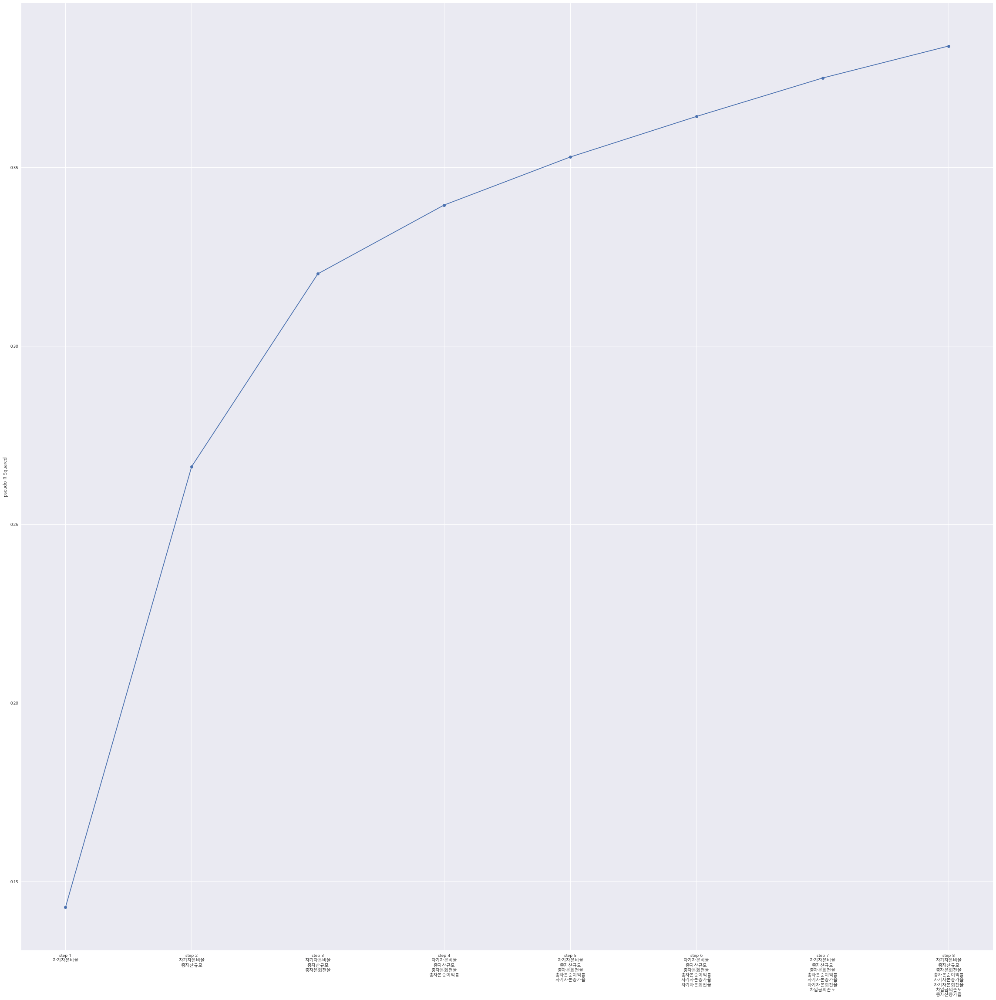

In [68]:
def stepwise_feature_selection(feature, target, variables):
    import statsmodels.api as sm
    import matplotlib.pyplot as plt
    import warnings
    import pandas as pd
    warnings.filterwarnings("ignore")
    
    y = target ## 반응 변수

    selected_variables = [] ## 선택된 변수들
    sl_enter = 0.05
    sl_remove = 0.05
    
    sv_per_step = [] ## 각 스텝별로 선택된 변수들
    r_squared = [] ## 각 스텝별 수정된 결정계수
    steps = [] ## 스텝
    step = 0
    while len(variables) > 0:
        remainder = list(set(variables) - set(selected_variables))
        pval = pd.Series(index=remainder) ## 변수의 p-value
        ## 기존에 포함된 변수와 새로운 변수 하나씩 돌아가면서
        ## 선형 모형을 적합한다.
        for col in remainder: 
            X = feature[selected_variables+[col]]
            model = sm.Logit(y,X).fit(disp=0)
            pval[col] = model.pvalues[col]
    
        min_pval = pval.min()
        if min_pval < sl_enter: ## 최소 p-value 값이 기준 값보다 작으면 포함
            selected_variables.append(pval.idxmin())
            ## 선택된 변수들에대해서
            ## 어떤 변수를 제거할지 고른다.
            while len(selected_variables) > 0:
                selected_X = feature[selected_variables]
                selected_pval = sm.Logit(y,selected_X).fit(disp=0).pvalues[:]
                max_pval = selected_pval.max()
                if max_pval >= sl_remove: ## 최대 p-value값이 기준값보다 크거나 같으면 제외
                    remove_variable = selected_pval.idxmax()
                    selected_variables.remove(remove_variable)
                else:
                    break
            
            step += 1
            steps.append(step)
            presudo_r_squared = sm.Logit(y,feature[selected_variables]).fit(disp=0).prsquared
            r_squared.append(presudo_r_squared)
            sv_per_step.append(selected_variables.copy())
        else:
            break

    
    # 시각화
    fig = plt.figure(figsize=(40,40))
    plt.xticks(steps,[f'step {s}\n'+'\n'.join(sv_per_step[i]) for i,s in enumerate(steps)])
    plt.plot(steps,r_squared, marker='o')
    plt.ylabel('pseudo R Squared')
    plt.grid(True)
    plt.show()

    return selected_variables
    
selected_variables = stepwise_feature_selection(x3_rb, df_final_x3_rb['y'],x3_rb.columns.tolist())

### 2-2-7. 선택 -> Step8
'자기자본비율','총자산규모','총자본회전율','총자본순이익률','자기자본증가율','자기자본회전율','차입금의존도','총자산증가율'

In [69]:
# select된 변수 들고오기
select_rb = ['자기자본비율','총자산규모','총자본회전율','총자본순이익률','자기자본증가율','자기자본회전율','차입금의존도','총자산증가율']
select_rb.append('y')
df_select_rb = df_final[select_rb]
df_select_rb

,자기자본비율,총자산규모,총자본회전율,총자본순이익률,자기자본증가율,자기자본회전율,차입금의존도,총자산증가율,y
0,41.659492,17.583764,48.828101,-10.714159,-36.568135,117.207626,12.303099,-40.698452,1.0
1,20.669768,17.714853,45.552250,-7.445354,-55.327901,220.381043,36.337895,-18.218210,1.0
2,48.368876,17.067764,41.400582,-15.116177,60.397782,85.593433,0.598762,-47.643241,1.0
3,37.021190,17.231392,20.390178,-35.200343,-8.762799,55.077048,6.594573,0.766632,1.0
4,-12.754704,16.765759,13.032479,-17.252203,-128.146832,-102.177825,6.355326,-37.226271,1.0
...,...,...,...,...,...,...,...,...,...
933,93.079812,17.722137,11.103961,-2.380746,-2.185597,11.929506,0.000000,-4.626905,0.0
934,59.525673,18.877611,37.316334,-3.382666,66.091353,62.689478,27.414434,33.344563,0.0
935,89.105169,18.861992,33.663323,-0.594747,-3.774855,37.779315,0.700766,-1.888743,0.0
936,32.634844,18.960815,102.780809,-14.352540,55.448194,314.941934,17.276681,6.921679,0.0


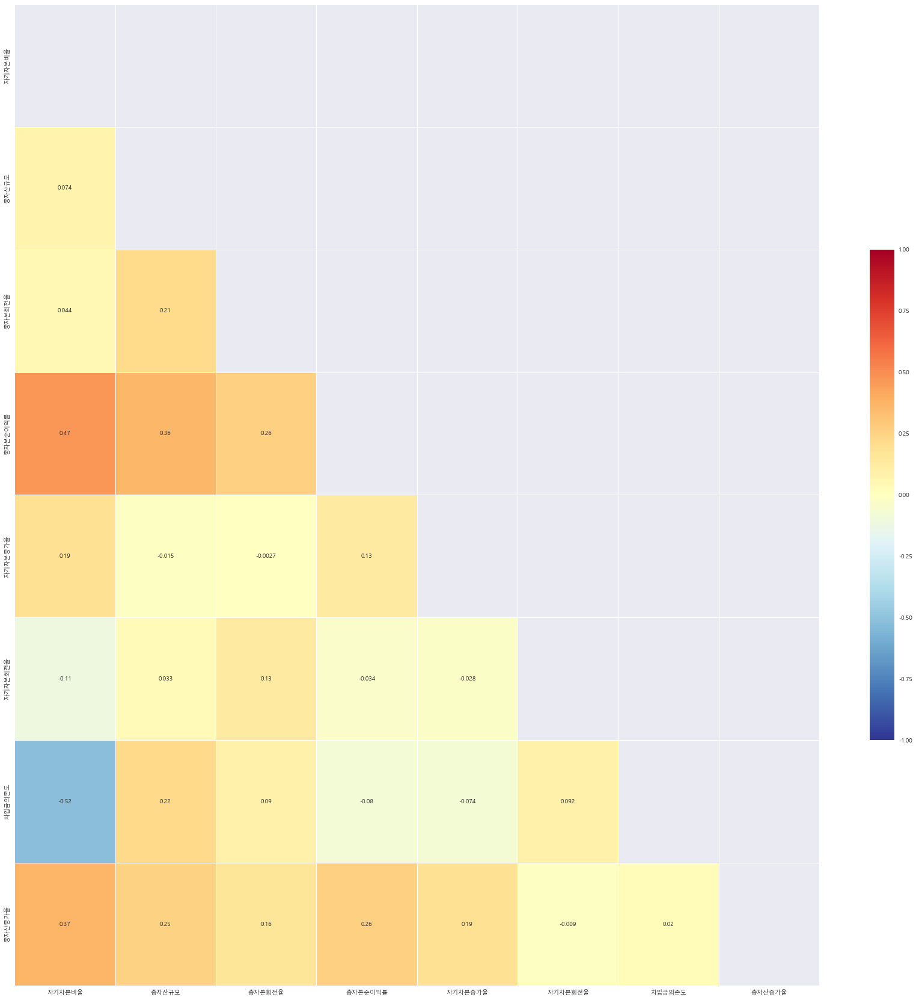

In [70]:
# 상관행렬 시각화
mask_ut=np.triu(np.ones(df_select_rb.drop('y',axis=1).corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(df_select_rb.drop('y',axis=1).corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut, vmin=-1, vmax=1)
plt.show()

In [173]:
df_final_rb_full = pd.concat([df_select_rb, df_final[['감사의견코드','광업', '교육 서비스업', '도매 및 소매업',
       '사업시설 관리, 사업 지원 및 임대 서비스업', '수도, 하수 및 폐기물 처리, 원료 재생업',
       '예술, 스포츠 및 여가관련 서비스업', '전기, 가스, 증기 및 공기조절 공급업', '전문, 과학 및 기술 서비스업',
       '정보통신업', '제조업','회계년도']]],axis=1)
df_final_rb_full

,자기자본비율,총자산규모,총자본회전율,총자본순이익률,자기자본증가율,자기자본회전율,차입금의존도,총자산증가율,y,감사의견코드,...,교육 서비스업,도매 및 소매업,"사업시설 관리, 사업 지원 및 임대 서비스업","수도, 하수 및 폐기물 처리, 원료 재생업","예술, 스포츠 및 여가관련 서비스업","전기, 가스, 증기 및 공기조절 공급업","전문, 과학 및 기술 서비스업",정보통신업,제조업,회계년도
0,41.65949,17.58376,48.82810,-10.71416,-36.56814,117.20763,12.30310,-40.69845,1.00000,1,...,0,0,0,0,0,0,0,0,1,2020
1,20.66977,17.71485,45.55225,-7.44535,-55.32790,220.38104,36.33789,-18.21821,1.00000,1,...,0,0,0,0,0,0,0,1,0,2014
2,48.36888,17.06776,41.40058,-15.11618,60.39778,85.59343,0.59876,-47.64324,1.00000,1,...,0,0,0,0,0,0,0,1,0,2015
3,37.02119,17.23139,20.39018,-35.20034,-8.76280,55.07705,6.59457,0.76663,1.00000,0,...,0,0,0,0,0,0,0,1,0,2019
4,-12.75470,16.76576,13.03248,-17.25220,-128.14683,-102.17783,6.35533,-37.22627,1.00000,1,...,0,0,0,0,0,0,0,1,0,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.07981,17.72214,11.10396,-2.38075,-2.18560,11.92951,0.00000,-4.62691,0.00000,1,...,0,0,0,0,0,0,0,0,1,2020
934,59.52567,18.87761,37.31633,-3.38267,66.09135,62.68948,27.41443,33.34456,0.00000,1,...,0,0,0,0,0,0,0,0,1,2020
935,89.10517,18.86199,33.66332,-0.59475,-3.77485,37.77932,0.70077,-1.88874,0.00000,1,...,0,0,0,0,0,0,0,0,1,2020
936,32.63484,18.96081,102.78081,-14.35254,55.44819,314.94193,17.27668,6.92168,0.00000,1,...,0,0,0,0,0,0,0,0,1,2020


In [174]:
df_final_rb_full.to_csv('./data/df_final_rb_full.csv')

## 2-3. MinMaxScaler

In [74]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
x_minmax_df = scaler.fit_transform(x)
x_minmax_df = pd.DataFrame(x_minmax_df, columns = x.columns)
x_minmax_df.head()

,자기자본비율,부채비율,유동비율,당좌비율,차입금의존도,매출액규모,총자산규모,부채상환계수,총자본순이익률,자본금세전순이익률,...,운전자산회전율,총자산증가율,유형자산증가율,매출액증가율,순이익증가율,자기자본증가율,총자본투자효율,부가가치율,노동소득분배율,현금흐름
0,0.419663,0.067265,0.114281,0.957101,0.243106,0.483349,0.299967,0.000102,0.550125,0.518110,...,0.475275,0.112649,0.204846,0.299852,0.600908,0.180134,0.295980,0.672581,0.369987,0.817290
1,0.202247,0.296894,0.022921,0.653003,0.718026,0.460071,0.333774,0.000108,0.608156,0.573419,...,0.388169,0.243648,0.285177,0.257364,0.578951,0.124561,0.468564,0.760479,0.709062,0.650405
2,0.489161,0.034492,0.230413,0.690879,0.011831,0.373848,0.166894,0.000087,0.471976,0.678473,...,0.453724,0.072180,0.000000,0.185323,0.577078,0.467381,0.554128,0.814383,0.573673,0.753708
3,0.371619,0.149982,0.015755,0.621643,0.130307,0.205610,0.209092,0.000099,0.115423,0.103893,...,0.409676,0.354279,0.330201,0.309661,0.524955,0.262503,0.195705,0.488811,0.404115,0.419395
4,0.000000,0.000000,0.000000,0.642357,0.125579,0.087231,0.089009,0.000106,0.434055,0.406205,...,0.418021,0.132882,0.056413,0.143510,0.602473,0.000000,0.387496,0.713127,0.000000,0.820378


### 2-3-1. 히트맵을 이용한 다중공선성확인

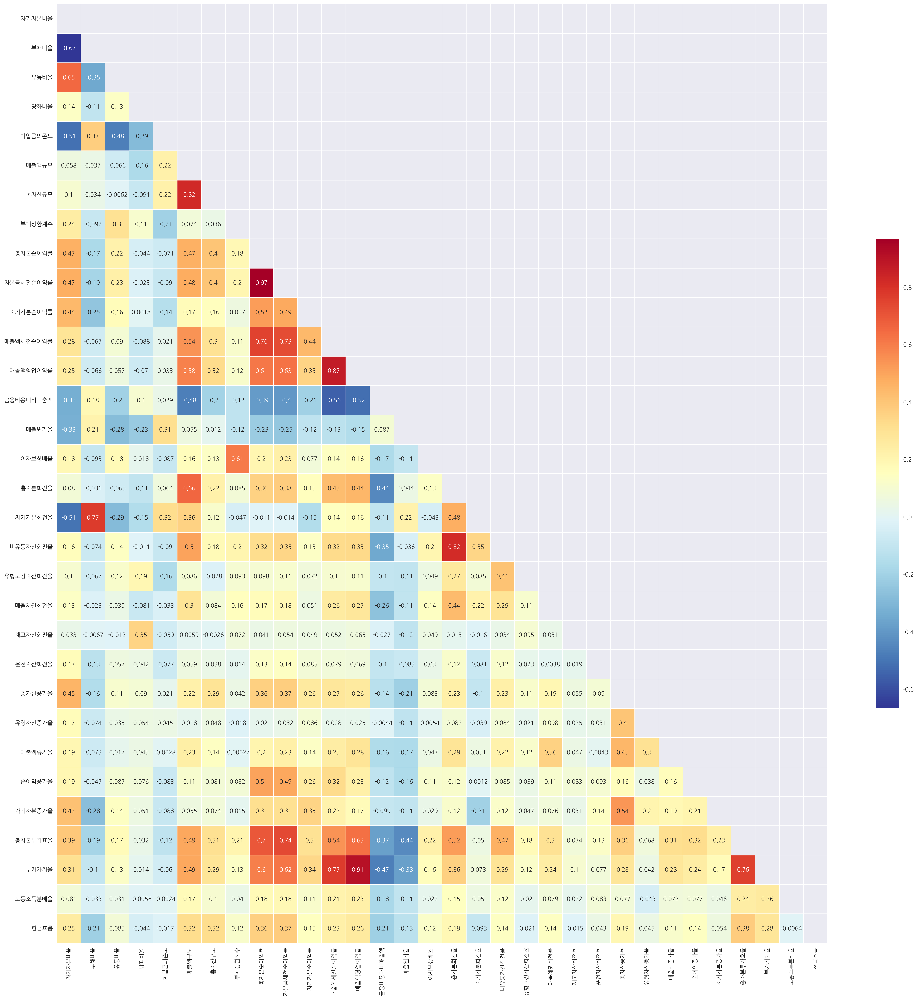

In [221]:
# 3. standard 상관행렬 시각화
mask_ut=np.triu(np.ones(x_minmax_df.corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(x_minmax_df.corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut)
plt.show()

### 2-3-2. VIF,유의성테스트를 이용한 다중공선성 확인

In [75]:
# 1-1) 상수항 추가
x_ = sm.add_constant(x_minmax_df, has_constant = "add")

# 1-2) 회귀모델 적합
multi_model3 = sm.Logit(df_final[['y']], x_)
fitted_multi_model3 = multi_model3.fit()

# 1-3) 결과 출력
fitted_multi_model3.summary()

Optimization terminated successfully.
         Current function value: 0.402197
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  938
Model:                          Logit   Df Residuals:                      905
Method:                           MLE   Df Model:                           32
Date:                Thu, 29 Sep 2022   Pseudo R-squ.:                  0.4198
Time:                        11:10:53   Log-Likelihood:                -377.26
converged:                       True   LL-Null:                       -650.17
Covariance Type:            nonrobust   LLR p-value:                 8.406e-95
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         10.2050      3.982      2.563      0.010       2.400      18.010
자기자본비율        -2.3316      1.030     -2.263      0.024      -4.351      -0.312
부채비율           2.0684      1.983      1.043      0.297      -1.818       5.955
유동비율          -1.3456      0.659     -2.041      0.041      -2.638      -0.054
당좌비율           0.0569      0.396      0.144      0.886      -0.720       0.833
차입금의존도        -1.8473      0.469     -3.935      0.000      -2.767      -0.927
매출액규모         -3.6190      2.020     -1.791      0.073      -7.579       0.341
총자산규모         -0.4824      1.472     -0.328      0.743      -3.368       2.404
부채상환계수         0.8129      0.634      1.282      0.200      -0.430       2.056
총자본순이익률       -9.6799      3.660     -2.645      0.008     -16.853      -2.507
자본금세전순이익률      5.5606      3.492      1.593      0.111      -1.283      12.404
자기자본순이익률      -5.5046      4.180     -1.317      0.188     -13.697       2.688
매출액세전순이익률      2.1499      1.622      1.325      0.185      -1.030       5.330
매출액영업이익률       3.1675      2.196      1.443      0.149      -1.136       7.471
금융비용대비매출액     -0.0552      0.688     -0.080      0.936      -1.403       1.293
매출원가율          0.5300      0.604      0.877      0.380      -0.654       1.714
이자보상배율         0.1061      0.433      0.245      0.806      -0.742       0.954
총자본회전율        -2.8401      1.552     -1.830      0.067      -5.882       0.202
자기자본회전율        3.8747      1.825      2.124      0.034       0.299       7.451
비유동자산회전율      -1.0229      0.800     -1.279      0.201      -2.591       0.545
유형고정자산회전율     -0.8406      0.543     -1.548      0.122      -1.904       0.223
매출채권회전율       -1.1735      0.499     -2.351      0.019      -2.152      -0.195
재고자산회전율       -0.3492      0.544     -0.641      0.521      -1.416       0.718
운전자산회전율        0.1034      0.611      0.169      0.866      -1.094       1.301
총자산증가율        -3.2425      0.833     -3.895      0.000      -4.874      -1.611
유형자산증가율       -0.5398      0.533     -1.013      0.311      -1.584       0.504
매출액증가율         1.0752      0.569      1.889      0.059      -0.040       2.191
순이익증가율         0.2223      0.745      0.298      0.766      -1.239       1.683
자기자본증가율        4.7961      0.898      5.342      0.000       3.036       6.556
총자본투자효율        2.3590      1.233      1.913      0.056      -0.058       4.776
부가가치율         -3.6313      2.098     -1.730      0.084      -7.744       0.482
노동소득분배율       -0.4349      0.585     -0.744      0.457      -1.581       0.711
현금흐름          -1.4845      0.865     -1.716      0.086      -3.180       0.211
==============================================================================
"""

In [76]:
# 2) 유의한 변수들만 보이기
list_ = pd.DataFrame(fitted_multi_model3.pvalues, columns = ['p_value'])
list_[(list_['p_value'] < 0.05)][['p_value']].sort_values('p_value')

,p_value
자기자본증가율,9.208284e-08
차입금의존도,8.308543e-05
총자산증가율,9.837496e-05
총자본순이익률,8.167253e-03
const,1.038986e-02
매출채권회전율,1.874820e-02
자기자본비율,2.363853e-02
자기자본회전율,3.369971e-02
유동비율,4.121449e-02


In [77]:
vif(x_minmax_df)

,VIF Factor,features
0,266.658304,매출액영업이익률
1,241.854844,총자본순이익률
2,209.066534,자본금세전순이익률
3,197.313173,부가가치율
4,165.103827,매출액세전순이익률
5,133.630936,매출액규모
6,61.991274,총자산규모
7,51.421543,자기자본순이익률
8,40.104251,총자본투자효율
9,29.599274,총자본회전율


In [78]:
# 매출액영업이익률
x1_mm = x_minmax_df.drop('매출액영업이익률',axis = 1)
# vif 확인
vif(x1_mm)

,VIF Factor,features
0,238.362432,총자본순이익률
1,204.374414,자본금세전순이익률
2,141.826170,매출액세전순이익률
3,125.758349,매출액규모
4,94.103946,부가가치율
5,59.496245,총자산규모
6,51.100605,자기자본순이익률
7,38.942566,총자본투자효율
8,29.290951,총자본회전율
9,29.117587,자기자본비율


In [79]:
# 자본금세전순이익률
x2_mm = x1_mm.drop('자본금세전순이익률',axis = 1)
# vif 확인
vif(x2_mm)

,VIF Factor,features
0,141.803044,매출액세전순이익률
1,125.757397,매출액규모
2,94.099571,부가가치율
3,73.758621,총자본순이익률
4,59.493464,총자산규모
5,51.006316,자기자본순이익률
6,37.900324,총자본투자효율
7,29.252442,총자본회전율
8,29.113871,자기자본비율
9,23.975352,순이익증가율


In [80]:
# 매출액세전순이익률
x3_mm = x2_mm.drop('매출액세전순이익률',axis = 1)
# vif 확인
vif(x3_mm)

,VIF Factor,features
0,112.714749,매출액규모
1,53.770247,부가가치율
2,52.436560,총자산규모
3,49.158896,자기자본순이익률
4,40.768024,총자본순이익률
5,29.074674,자기자본비율
6,28.828447,총자본회전율
7,27.404607,총자본투자효율
8,23.924062,순이익증가율
9,17.053015,현금흐름


In [81]:
# 매출액규모
x4_mm = x3_mm.drop('매출액규모',axis = 1)
# vif 확인
vif(x4_mm)

,VIF Factor,features
0,48.716073,자기자본순이익률
1,41.307398,부가가치율
2,40.549917,총자본순이익률
3,28.985602,자기자본비율
4,27.252723,총자본투자효율
5,23.920138,순이익증가율
6,19.887163,총자본회전율
7,17.052892,현금흐름
8,14.686451,자기자본회전율
9,13.863140,매출원가율


In [83]:
# 자기자본순이익률
x5_mm = x4_mm.drop('자기자본순이익률',axis = 1)
# vif 확인
vif(x5_mm)

,VIF Factor,features
0,38.672920,총자본순이익률
1,37.495221,부가가치율
2,26.403869,자기자본비율
3,25.842514,총자본투자효율
4,23.641479,순이익증가율
5,19.778904,총자본회전율
6,16.792529,현금흐름
7,14.644224,자기자본회전율
8,13.342581,매출원가율
9,11.417849,노동소득분배율


In [84]:
# 부가가치율
x6_mm = x5_mm.drop('부가가치율',axis = 1)
# vif 확인
vif(x6_mm)

,VIF Factor,features
0,38.405188,총자본순이익률
1,26.111168,자기자본비율
2,23.629011,순이익증가율
3,19.659882,총자본회전율
4,18.895890,총자본투자효율
5,16.482729,현금흐름
6,14.643466,자기자본회전율
7,13.208210,매출원가율
8,10.976097,노동소득분배율
9,10.130434,부채비율


In [85]:
# 순이익증가율
x7_mm = x6_mm.drop('순이익증가율',axis = 1)
# vif 확인
vif(x7_mm)

,VIF Factor,features
0,29.558346,총자본순이익률
1,26.110343,자기자본비율
2,19.628600,총자본회전율
3,18.867704,총자본투자효율
4,16.469838,현금흐름
5,14.636372,자기자본회전율
6,12.953124,매출원가율
7,10.914709,노동소득분배율
8,10.123732,부채비율
9,9.923727,총자산증가율


In [86]:
# 총자본회전율
x8_mm = x7_mm.drop('총자본회전율',axis = 1)
# vif 확인
vif(x8_mm)

,VIF Factor,features
0,29.555915,총자본순이익률
1,26.075524,자기자본비율
2,17.835851,총자본투자효율
3,16.457650,현금흐름
4,12.499058,매출원가율
5,10.914703,노동소득분배율
6,9.814626,총자산증가율
7,9.385762,운전자산회전율
8,9.373797,자기자본회전율
9,8.051693,당좌비율


In [87]:
# 총자본투자효율
x9_mm = x8_mm.drop('총자본투자효율',axis = 1)
# vif 확인
vif(x9_mm)

,VIF Factor,features
0,25.898217,자기자본비율
1,21.799872,총자본순이익률
2,15.763733,현금흐름
3,10.538752,노동소득분배율
4,10.364842,매출원가율
5,9.813189,총자산증가율
6,9.366646,운전자산회전율
7,9.314888,자기자본회전율
8,8.041866,당좌비율
9,7.441848,부채비율


In [88]:
# 현금흐름
x10_mm = x9_mm.drop('현금흐름',axis = 1)
# vif 확인
vif(x10_mm)

,VIF Factor,features
0,25.555443,자기자본비율
1,19.727813,총자본순이익률
2,10.499389,노동소득분배율
3,9.976762,매출원가율
4,9.804211,총자산증가율
5,9.314860,자기자본회전율
6,9.305094,운전자산회전율
7,7.882946,당좌비율
8,7.435271,부채비율
9,6.524628,총자산규모


In [107]:
# 노동소득분배율
x11_mm = x10_mm.drop('노동소득분배율',axis = 1)
# vif 확인
df_x11_mm = vif(x11_mm)
df_x11_mm

,VIF Factor,features
0,25.177356,자기자본비율
1,19.141334,총자본순이익률
2,9.769393,매출원가율
3,9.735564,총자산증가율
4,9.314857,자기자본회전율
5,9.109711,운전자산회전율
6,7.491624,당좌비율
7,7.393151,부채비율
8,6.521237,총자산규모
9,5.843787,자기자본증가율


In [108]:
# 3) 다중 공선성이 없는 변수들만 모은 데이터 프레임
df_x11_mm = df_x11_mm.reset_index(drop=True)['features']
df_x11_mm[df_x11_mm.index.max()+1] = 'y'
df_final_x11_mm = df_final[df_x11_mm]
df_final_x11_mm

,자기자본비율,총자본순이익률,매출원가율,총자산증가율,자기자본회전율,운전자산회전율,당좌비율,부채비율,총자산규모,자기자본증가율,...,차입금의존도,유형자산증가율,유동비율,매출채권회전율,금융비용대비매출액,부채상환계수,이자보상배율,유형고정자산회전율,재고자산회전율,y
0,41.659492,-10.714159,95.288833,-40.698452,117.207626,260.835838,97.346502,78.715434,17.583764,-36.568135,...,12.303099,-7.485894,171.652368,207.069186,2.181178,-89.560725,-720.507696,268.103732,4103.261605,1.0
1,20.669768,-7.445354,69.517934,-18.218210,220.381043,-163.121344,78.536538,335.311991,17.714853,-55.327901,...,36.337895,21.664094,51.192980,326.816705,5.820381,7.374011,-135.010369,119.206669,724.574248,1.0
2,48.368876,-15.116177,70.540226,-47.643241,85.593433,155.943863,80.879343,42.093766,17.067764,60.397782,...,0.598762,-98.376233,324.774250,252.028667,2.936858,-358.813255,32.124816,133.138224,564.456445,1.0
3,37.021190,-35.200343,60.812603,0.766632,55.077048,-58.441035,76.596773,171.147017,17.231392,-8.762799,...,6.594573,38.002005,41.744283,433.103612,43.259518,-144.152613,-166.569488,58.269717,348.484688,1.0
4,-12.754704,-17.252203,39.940751,-37.226271,-102.177825,-17.828586,77.878012,-704.718468,16.765759,-128.146832,...,6.355326,-61.348826,17.931353,356.074466,73.155331,-34.427106,-75.420044,37.846882,368.856097,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.079812,-2.380746,42.938472,-4.626905,11.929506,14.103125,96.465210,4.890369,17.722137,-2.185597,...,0.000000,45.244686,2761.424968,142.098806,0.390697,716.861254,-10533.731559,160.078301,384.532165,0.0
934,59.525673,-3.382666,70.527446,33.344563,62.689478,595.979618,75.839411,92.000919,18.877611,66.091353,...,27.414434,2.677153,117.374389,245.222662,7.246359,10.571588,-33.537862,113.380942,365.140571,0.0
935,89.105169,-0.594747,65.557883,-1.888743,37.779315,92.219919,78.976175,11.156992,18.861992,-3.774855,...,0.700766,19.122630,629.191005,686.028360,0.069561,506.016413,-520.817803,72.544454,368.929136,0.0
936,32.634844,-14.352540,100.324936,6.921679,314.941934,453.226828,100.000000,216.670953,18.960815,55.448194,...,17.276681,-2.693640,135.740416,190.586116,1.586723,-51.875354,-297.795205,1136.845208,0.000000,0.0


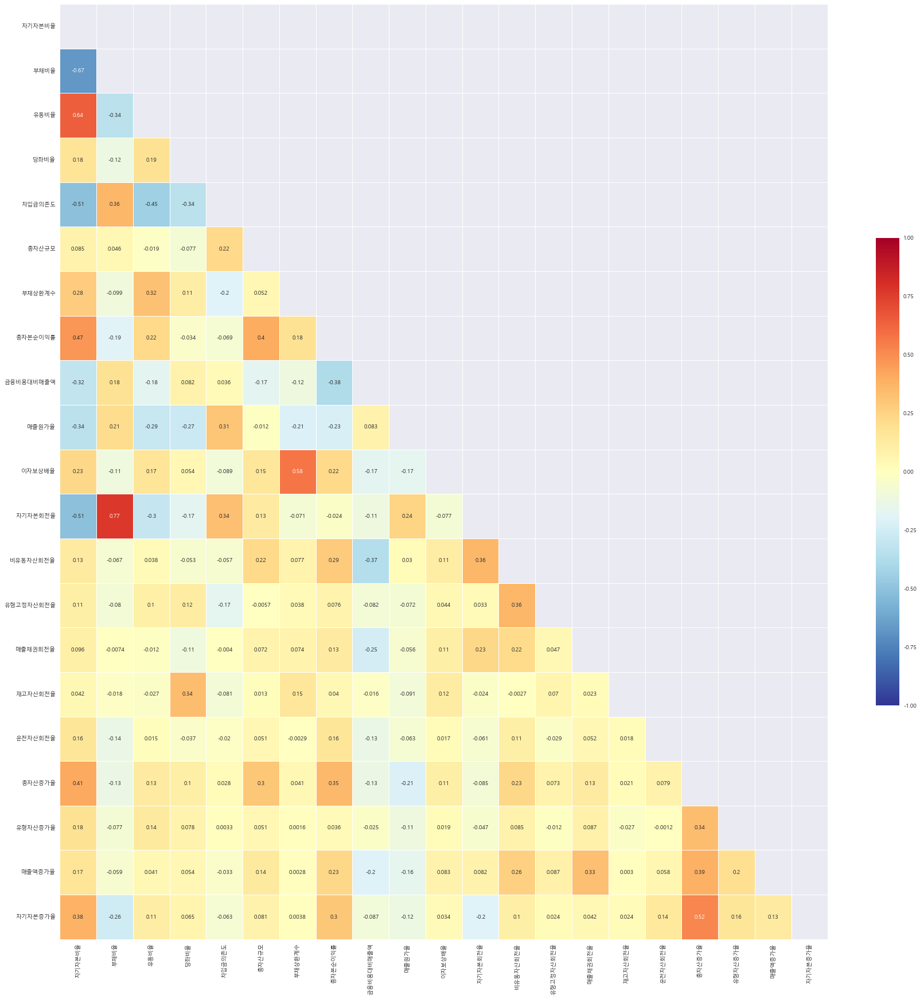

In [109]:
# 상관행렬 시각화
mask_ut=np.triu(np.ones(x11_mm.corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(x11_mm.corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut, vmin=-1, vmax=1)
plt.show()

### 2-3-3. 로지스틱 회귀 전 정규성 검정, 독립성 검정, 등분산성 검정

In [110]:
normal_s,notnormal_s = normal_test('shapiro',x11_mm)
normal_s

,normal


In [111]:
normal_a,notnormal_a = normal_test('anderson',x11_mm)
normal_a

,normal


In [112]:
normal_ks,notnormal_ks = normal_test('kstest',x11_mm)
normal_ks

,normal


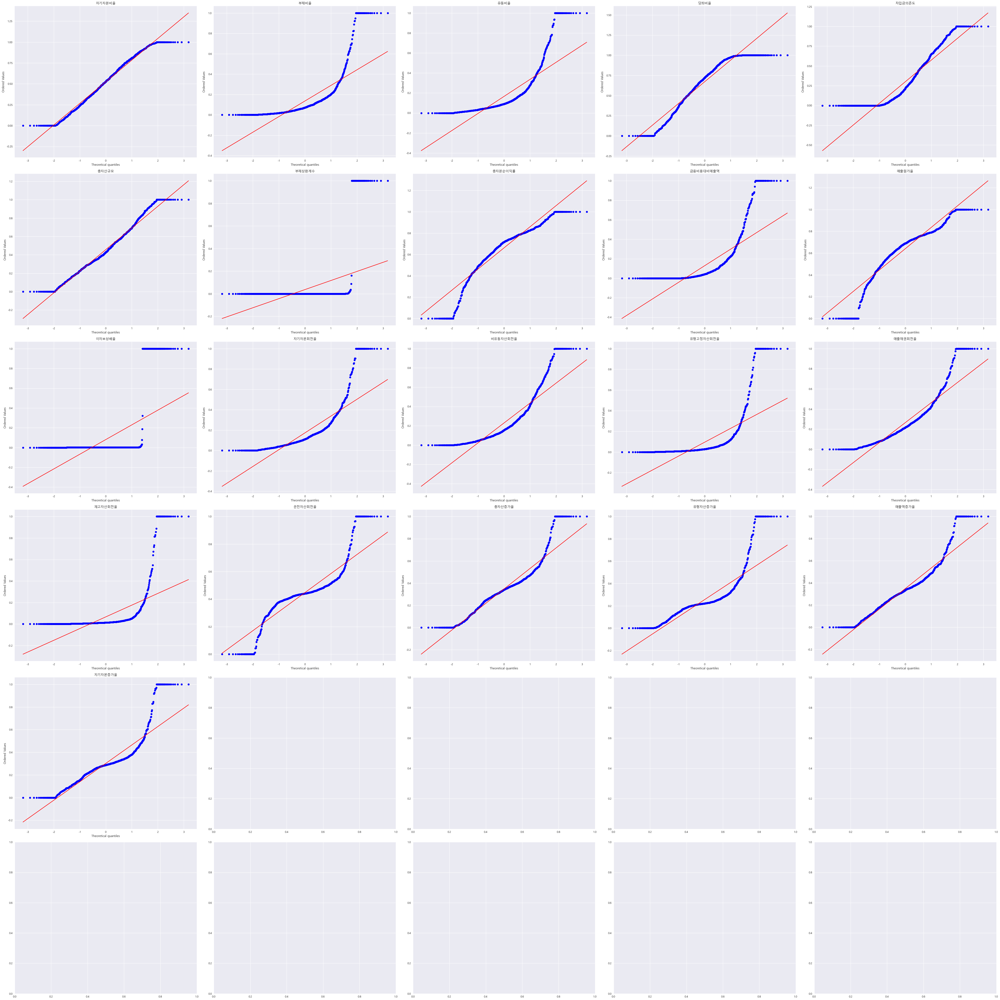

In [113]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 6

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), x11_mm):
       stats.probplot(x11_mm[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

In [114]:
# 이분산성 변수
x_hetero_mm = bartlett_test(x11_mm.columns, df_final_x11_mm[df_final_x11_mm['y']==0], df_final_x11_mm[df_final_x11_mm['y']==1], H = 1)
x_hetero_mm

,변수,p_value
1,부채비율,0.000000e+00
18,유형자산증가율,0.000000e+00
8,금융비용대비매출액,0.000000e+00
11,자기자본회전율,1.050863e-305
20,자기자본증가율,3.582216e-253
13,유형고정자산회전율,2.529598e-227
12,비유동자산회전율,1.732567e-160
7,총자본순이익률,7.157291e-82
16,운전자산회전율,1.429210e-72
19,매출액증가율,7.678056e-39


In [115]:
# 등분산성 변수
x_homo_mm =bartlett_test(x11_mm.columns, df_final_x11_mm[df_final_x11_mm['y']==0], df_final_x11_mm[df_final_x11_mm['y']==1], H = 0)
x_homo_mm

,변수,p_value
5,총자산규모,0.058306


### 2-3-4. T-test(등분산성,이분산성 변수가 있다는 가정 하에)

In [116]:
# 1) t_test 결과 p_value < 0.05보다 작은 유의한 변수 가져오기
x_ttest_mm = t_test(x11_mm.columns, x_homo_mm, x_hetero_mm, df_final_x11_mm[df_final_x11_mm['y']==0], df_final_x11_mm[df_final_x11_mm['y']==1], p_value=0.05)
x_ttest_mm

,변수,p_value
0,자기자본비율,7.304718e-41
5,총자산규모,3.665042e-36
7,총자본순이익률,1.196899e-33
17,총자산증가율,8.392682e-16
14,매출채권회전율,6.726408e-08
9,매출원가율,3.195533e-07
12,비유동자산회전율,1.739722e-06
10,이자보상배율,2.480247e-06
6,부채상환계수,1.320261e-03
8,금융비용대비매출액,1.964549e-03


In [118]:
# 2) t test 유의한 변수들만 모은 데이터 프레임
x_ttest_mm = x_ttest_mm.reset_index(drop=True)['변수']
x_ttest_mm[x_ttest_mm.index.max()+1] = 'y'
df_final_ttest_mm = df_final[x_ttest_mm]
df_final_ttest_mm

,자기자본비율,총자산규모,총자본순이익률,총자산증가율,매출채권회전율,매출원가율,비유동자산회전율,이자보상배율,부채상환계수,금융비용대비매출액,유동비율,유형고정자산회전율,매출액증가율,y
0,41.659492,17.583764,-10.714159,-40.698452,207.069186,95.288833,138.838749,-720.507696,-89.560725,2.181178,171.652368,268.103732,-10.095643,1.0
1,20.669768,17.714853,-7.445354,-18.218210,326.816705,69.517934,67.653693,-135.010369,7.374011,5.820381,51.192980,119.206669,-20.337630,1.0
2,48.368876,17.067764,-15.116177,-47.643241,252.028667,70.540226,69.634708,32.124816,-358.813255,2.936858,324.774250,133.138224,-37.703368,1.0
3,37.021190,17.231392,-35.200343,0.766632,433.103612,60.812603,37.308653,-166.569488,-144.152613,43.259518,41.744283,58.269717,-7.731282,1.0
4,-12.754704,16.765759,-17.252203,-37.226271,356.074466,39.940751,16.988581,-75.420044,-34.427106,73.155331,17.931353,37.846882,-47.782566,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.079812,17.722137,-2.380746,-4.626905,142.098806,42.938472,82.824390,-10533.731559,716.861254,0.390697,2761.424968,160.078301,-22.856771,0.0
934,59.525673,18.877611,-3.382666,33.344563,245.222662,70.527446,62.300649,-33.537862,10.571588,7.246359,117.374389,113.380942,-17.232473,0.0
935,89.105169,18.861992,-0.594747,-1.888743,686.028360,65.557883,65.255327,-520.817803,506.016413,0.069561,629.191005,72.544454,-7.706858,0.0
936,32.634844,18.960815,-14.352540,6.921679,190.586116,100.324936,515.545287,-297.795205,-51.875354,1.586723,135.740416,1136.845208,124.657694,0.0


### 2-3-5. Lasso

In [119]:
lasso = SelectFromModel(LogisticRegression(C=1, penalty='l1',solver='liblinear'))
lasso.fit(x11_mm, df_final_x11_mm['y'])
lasso_support = lasso.get_support()
lr_feature_mm = x11_mm.loc[:,lasso_support].columns.tolist()
print(str(len(lr_feature_mm)), 'selected features')

19 selected features


In [120]:
# lasso 선택된 변수들만 모은 데이터 프레임
lr_feature_mm.append('y')
df_final_lasso_mm = df_final[lr_feature_mm]
df_final_lasso_mm

,자기자본비율,부채비율,유동비율,당좌비율,차입금의존도,총자산규모,부채상환계수,총자본순이익률,금융비용대비매출액,매출원가율,이자보상배율,비유동자산회전율,유형고정자산회전율,매출채권회전율,재고자산회전율,총자산증가율,유형자산증가율,매출액증가율,자기자본증가율,y
0,41.659492,78.715434,171.652368,97.346502,12.303099,17.583764,-89.560725,-10.714159,2.181178,95.288833,-720.507696,138.838749,268.103732,207.069186,4103.261605,-40.698452,-7.485894,-10.095643,-36.568135,1.0
1,20.669768,335.311991,51.192980,78.536538,36.337895,17.714853,7.374011,-7.445354,5.820381,69.517934,-135.010369,67.653693,119.206669,326.816705,724.574248,-18.218210,21.664094,-20.337630,-55.327901,1.0
2,48.368876,42.093766,324.774250,80.879343,0.598762,17.067764,-358.813255,-15.116177,2.936858,70.540226,32.124816,69.634708,133.138224,252.028667,564.456445,-47.643241,-98.376233,-37.703368,60.397782,1.0
3,37.021190,171.147017,41.744283,76.596773,6.594573,17.231392,-144.152613,-35.200343,43.259518,60.812603,-166.569488,37.308653,58.269717,433.103612,348.484688,0.766632,38.002005,-7.731282,-8.762799,1.0
4,-12.754704,-704.718468,17.931353,77.878012,6.355326,16.765759,-34.427106,-17.252203,73.155331,39.940751,-75.420044,16.988581,37.846882,356.074466,368.856097,-37.226271,-61.348826,-47.782566,-128.146832,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.079812,4.890369,2761.424968,96.465210,0.000000,17.722137,716.861254,-2.380746,0.390697,42.938472,-10533.731559,82.824390,160.078301,142.098806,384.532165,-4.626905,45.244686,-22.856771,-2.185597,0.0
934,59.525673,92.000919,117.374389,75.839411,27.414434,18.877611,10.571588,-3.382666,7.246359,70.527446,-33.537862,62.300649,113.380942,245.222662,365.140571,33.344563,2.677153,-17.232473,66.091353,0.0
935,89.105169,11.156992,629.191005,78.976175,0.700766,18.861992,506.016413,-0.594747,0.069561,65.557883,-520.817803,65.255327,72.544454,686.028360,368.929136,-1.888743,19.122630,-7.706858,-3.774855,0.0
936,32.634844,216.670953,135.740416,100.000000,17.276681,18.960815,-51.875354,-14.352540,1.586723,100.324936,-297.795205,515.545287,1136.845208,190.586116,0.000000,6.921679,-2.693640,124.657694,55.448194,0.0


In [121]:
lr_feature_mm

['자기자본비율',
 '부채비율',
 '유동비율',
 '당좌비율',
 '차입금의존도',
 '총자산규모',
 '부채상환계수',
 '총자본순이익률',
 '금융비용대비매출액',
 '매출원가율',
 '이자보상배율',
 '비유동자산회전율',
 '유형고정자산회전율',
 '매출채권회전율',
 '재고자산회전율',
 '총자산증가율',
 '유형자산증가율',
 '매출액증가율',
 '자기자본증가율',
 'y']

### 2-3-6. Stepwise

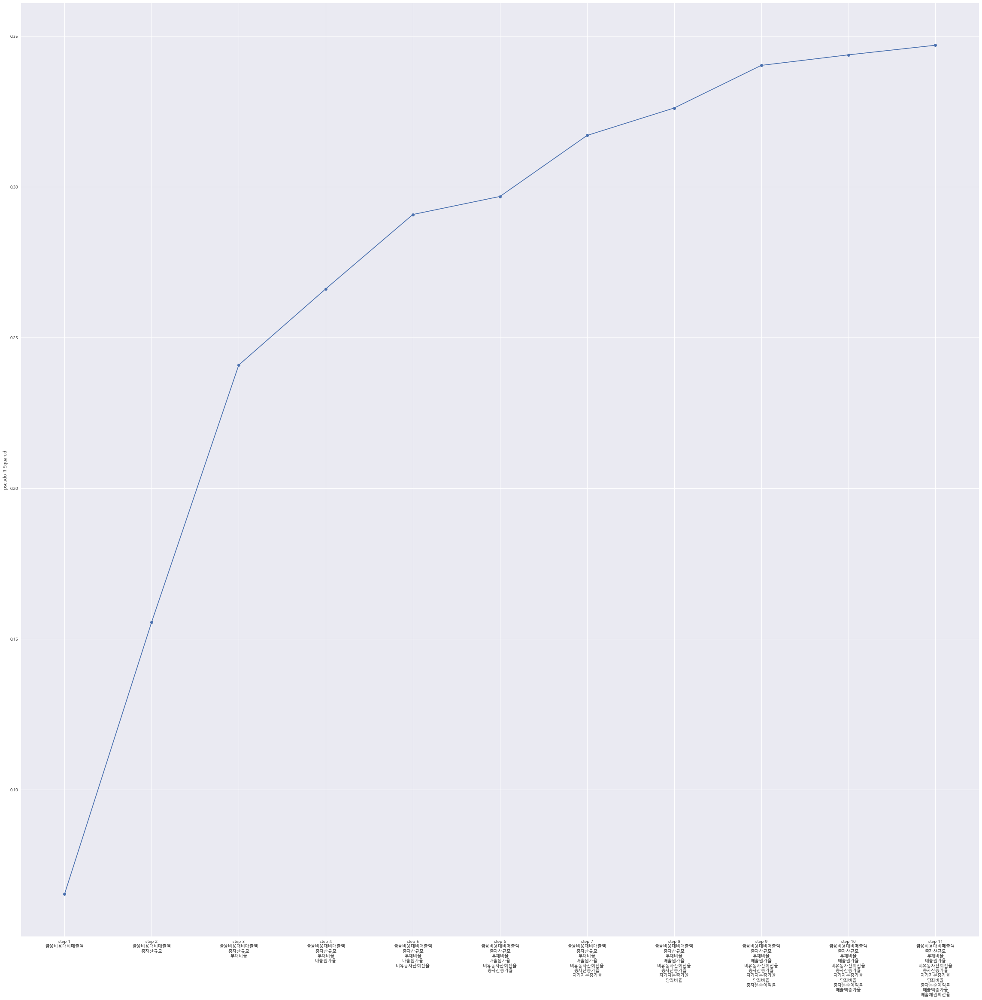

In [122]:
def stepwise_feature_selection(feature, target, variables):
    import statsmodels.api as sm
    import matplotlib.pyplot as plt
    import warnings
    import pandas as pd
    warnings.filterwarnings("ignore")
    
    y = target ## 반응 변수

    selected_variables = [] ## 선택된 변수들
    sl_enter = 0.05
    sl_remove = 0.05
    
    sv_per_step = [] ## 각 스텝별로 선택된 변수들
    r_squared = [] ## 각 스텝별 수정된 결정계수
    steps = [] ## 스텝
    step = 0
    while len(variables) > 0:
        remainder = list(set(variables) - set(selected_variables))
        pval = pd.Series(index=remainder) ## 변수의 p-value
        ## 기존에 포함된 변수와 새로운 변수 하나씩 돌아가면서
        ## 선형 모형을 적합한다.
        for col in remainder: 
            X = feature[selected_variables+[col]]
            model = sm.Logit(y,X).fit(disp=0)
            pval[col] = model.pvalues[col]
    
        min_pval = pval.min()
        if min_pval < sl_enter: ## 최소 p-value 값이 기준 값보다 작으면 포함
            selected_variables.append(pval.idxmin())
            ## 선택된 변수들에대해서
            ## 어떤 변수를 제거할지 고른다.
            while len(selected_variables) > 0:
                selected_X = feature[selected_variables]
                selected_pval = sm.Logit(y,selected_X).fit(disp=0).pvalues[:]
                max_pval = selected_pval.max()
                if max_pval >= sl_remove: ## 최대 p-value값이 기준값보다 크거나 같으면 제외
                    remove_variable = selected_pval.idxmax()
                    selected_variables.remove(remove_variable)
                else:
                    break
            
            step += 1
            steps.append(step)
            presudo_r_squared = sm.Logit(y,feature[selected_variables]).fit(disp=0).prsquared
            r_squared.append(presudo_r_squared)
            sv_per_step.append(selected_variables.copy())
        else:
            break

    
    # 시각화
    fig = plt.figure(figsize=(40,40))
    plt.xticks(steps,[f'step {s}\n'+'\n'.join(sv_per_step[i]) for i,s in enumerate(steps)])
    plt.plot(steps,r_squared, marker='o')
    plt.ylabel('pseudo R Squared')
    plt.grid(True)
    plt.show()

    return selected_variables
    
selected_variables = stepwise_feature_selection(x11_mm, df_final_x11_mm['y'],x11_mm.columns.tolist())

### 2-3-6. 선택 -> Step9
'금융비용대비매출액','총자산규모','부채비율','매출원가율','비유동자산회전율','총자산증가율','자기자본증가율','당좌비율','총자본순이익률'

In [123]:
# select된 변수 들고오기
select_mm = ['금융비용대비매출액','총자산규모','부채비율','매출원가율','비유동자산회전율','총자산증가율','자기자본증가율','당좌비율','총자본순이익률']
select_mm.append('y')
df_select_mm = df_final[select_mm]
df_select_mm

,금융비용대비매출액,총자산규모,부채비율,매출원가율,비유동자산회전율,총자산증가율,자기자본증가율,당좌비율,총자본순이익률,y
0,2.181178,17.583764,78.715434,95.288833,138.838749,-40.698452,-36.568135,97.346502,-10.714159,1.0
1,5.820381,17.714853,335.311991,69.517934,67.653693,-18.218210,-55.327901,78.536538,-7.445354,1.0
2,2.936858,17.067764,42.093766,70.540226,69.634708,-47.643241,60.397782,80.879343,-15.116177,1.0
3,43.259518,17.231392,171.147017,60.812603,37.308653,0.766632,-8.762799,76.596773,-35.200343,1.0
4,73.155331,16.765759,-704.718468,39.940751,16.988581,-37.226271,-128.146832,77.878012,-17.252203,1.0
...,...,...,...,...,...,...,...,...,...,...
933,0.390697,17.722137,4.890369,42.938472,82.824390,-4.626905,-2.185597,96.465210,-2.380746,0.0
934,7.246359,18.877611,92.000919,70.527446,62.300649,33.344563,66.091353,75.839411,-3.382666,0.0
935,0.069561,18.861992,11.156992,65.557883,65.255327,-1.888743,-3.774855,78.976175,-0.594747,0.0
936,1.586723,18.960815,216.670953,100.324936,515.545287,6.921679,55.448194,100.000000,-14.352540,0.0


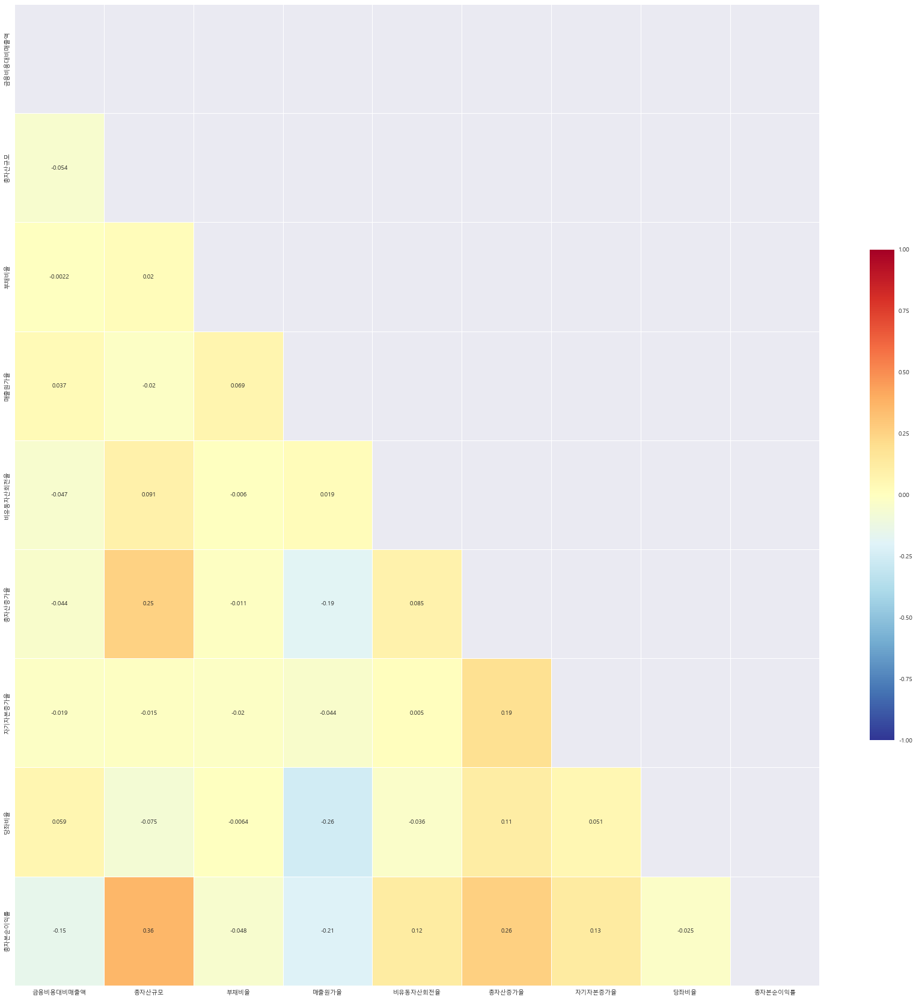

In [124]:
# 상관행렬 시각화
mask_ut=np.triu(np.ones(df_select_mm.drop('y',axis=1).corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(df_select_mm.drop('y',axis=1).corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut, vmin=-1, vmax=1)
plt.show()

In [126]:
df_final_mm_full = pd.concat([df_select_mm, df_final[['감사의견코드','광업', '교육 서비스업', '도매 및 소매업',
       '사업시설 관리, 사업 지원 및 임대 서비스업', '수도, 하수 및 폐기물 처리, 원료 재생업',
       '예술, 스포츠 및 여가관련 서비스업', '전기, 가스, 증기 및 공기조절 공급업', '전문, 과학 및 기술 서비스업',
       '정보통신업', '제조업','회계년도']]],axis=1)
df_final_mm_full

,금융비용대비매출액,총자산규모,부채비율,매출원가율,비유동자산회전율,총자산증가율,자기자본증가율,당좌비율,총자본순이익률,y,...,교육 서비스업,도매 및 소매업,"사업시설 관리, 사업 지원 및 임대 서비스업","수도, 하수 및 폐기물 처리, 원료 재생업","예술, 스포츠 및 여가관련 서비스업","전기, 가스, 증기 및 공기조절 공급업","전문, 과학 및 기술 서비스업",정보통신업,제조업,회계년도
0,2.181178,17.583764,78.715434,95.288833,138.838749,-40.698452,-36.568135,97.346502,-10.714159,1.0,...,0,0,0,0,0,0,0,0,1,2020
1,5.820381,17.714853,335.311991,69.517934,67.653693,-18.218210,-55.327901,78.536538,-7.445354,1.0,...,0,0,0,0,0,0,0,1,0,2014
2,2.936858,17.067764,42.093766,70.540226,69.634708,-47.643241,60.397782,80.879343,-15.116177,1.0,...,0,0,0,0,0,0,0,1,0,2015
3,43.259518,17.231392,171.147017,60.812603,37.308653,0.766632,-8.762799,76.596773,-35.200343,1.0,...,0,0,0,0,0,0,0,1,0,2019
4,73.155331,16.765759,-704.718468,39.940751,16.988581,-37.226271,-128.146832,77.878012,-17.252203,1.0,...,0,0,0,0,0,0,0,1,0,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,0.390697,17.722137,4.890369,42.938472,82.824390,-4.626905,-2.185597,96.465210,-2.380746,0.0,...,0,0,0,0,0,0,0,0,1,2020
934,7.246359,18.877611,92.000919,70.527446,62.300649,33.344563,66.091353,75.839411,-3.382666,0.0,...,0,0,0,0,0,0,0,0,1,2020
935,0.069561,18.861992,11.156992,65.557883,65.255327,-1.888743,-3.774855,78.976175,-0.594747,0.0,...,0,0,0,0,0,0,0,0,1,2020
936,1.586723,18.960815,216.670953,100.324936,515.545287,6.921679,55.448194,100.000000,-14.352540,0.0,...,0,0,0,0,0,0,0,0,1,2020


In [127]:
df_final_mm_full.to_csv('./data/df_final_mm_full.csv')

## 2-4. LogScaler

In [96]:
df_final_log = x.copy()

In [97]:
# 1) log scale 만들기
skew_feats = df_final_log.drop(['총자산규모','매출액규모'],axis=1).columns
# 기존 값 : np.log1p(df_final_log.loc[:,skew_feats])
# 2) BOX-COX 변환 : 절대값자연로그에 원래 부호를 붙임(마이너스인 경우도 사용이 가능하다.)
df_final_log.loc[:,skew_feats] = (np.sign(df_final_log.loc[:,skew_feats]))*(np.log1p(np.abs(df_final_log.loc[:,skew_feats])))

In [128]:
df_final_log.loc[:,skew_feats]

,자기자본비율,부채비율,유동비율,당좌비율,차입금의존도,부채상환계수,총자본순이익률,자본금세전순이익률,자기자본순이익률,매출액세전순이익률,...,운전자산회전율,총자산증가율,유형자산증가율,매출액증가율,순이익증가율,자기자본증가율,총자본투자효율,부가가치율,노동소득분배율,현금흐름
0,3.753250,4.378463,5.151280,4.588497,2.587997,-4.506021,-2.460798,-2.460798,-3.285353,-3.132996,...,5.567718,-3.730464,-2.138405,-2.406552,-4.991444,-3.626156,-1.471358,-2.063229,-4.605288,2.912218
1,3.075918,5.818039,3.954948,4.376217,3.620009,2.125133,-2.133616,-2.141778,-3.611472,-2.853284,...,-5.100606,-2.955858,3.120782,-3.060472,-5.450418,-4.031190,1.320595,1.949827,5.269727,-2.284289
2,3.899320,3.763378,5.786205,4.405247,0.469230,-5.885585,-2.779824,-0.890896,-3.473576,-3.624661,...,5.055888,-3.884513,-4.416664,-3.655927,-5.481319,4.117374,1.912546,2.703891,4.351837,2.129346
3,3.638144,5.148349,3.755235,4.351526,2.027434,-4.977786,-3.589069,-3.574487,-4.565198,-5.156949,...,-4.084985,0.569075,3.663613,-2.166912,-6.094955,-2.278579,-2.066844,-3.550740,-4.256802,-3.831002
4,0.762928,1.515447,3.089746,4.367903,1.995425,-3.567477,-2.904286,-2.900751,-7.274242,-4.893191,...,-2.935376,-3.643523,-4.132745,-3.887373,-4.949052,-4.588794,-0.113398,-0.653041,-6.037970,2.938242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,4.544143,1.773319,7.200787,4.579495,0.000000,6.576276,-1.218097,-1.218097,-1.269128,-3.110868,...,2.714902,-1.727560,3.833947,-3.172068,-5.792853,-1.158640,-0.590264,-2.109588,-5.825774,-1.629439
934,4.103068,4.532609,4.773852,4.341718,3.346897,2.448553,-1.477657,-1.481776,-1.899522,-2.309048,...,6.391883,3.536444,1.302139,-2.903204,-6.750621,4.206055,1.578861,2.426188,4.626378,2.222029
935,4.500978,2.497904,6.446023,4.381729,0.531079,6.228543,-0.466715,-0.525585,-0.511305,-1.017673,...,4.534961,-1.060821,3.001845,-2.164111,-4.713027,-1.563364,1.803395,2.776429,4.352003,1.758007
936,3.515563,5.382985,4.918084,4.615121,2.905626,-3.967937,-2.731281,-2.798370,-3.806200,-2.705662,...,6.118597,2.069603,-1.306612,4.833561,-7.795197,4.033323,-1.509641,-1.488339,-3.386933,-4.254499


In [274]:
# 3) histogram 그리기
n = 0
f, grid = plt.subplots(8, 4, figsize=(20, 50))
for row in grid:
    for ax in row:
        col = df_final_log.columns[n]
        ax.hist(df_final_log[col], bins=max(df_final_log[col].nunique()//20, 10))
        ax.set_title(col)
        n += 1

### 2-4-1. 히트맵을 이용한 다중공선성 확인

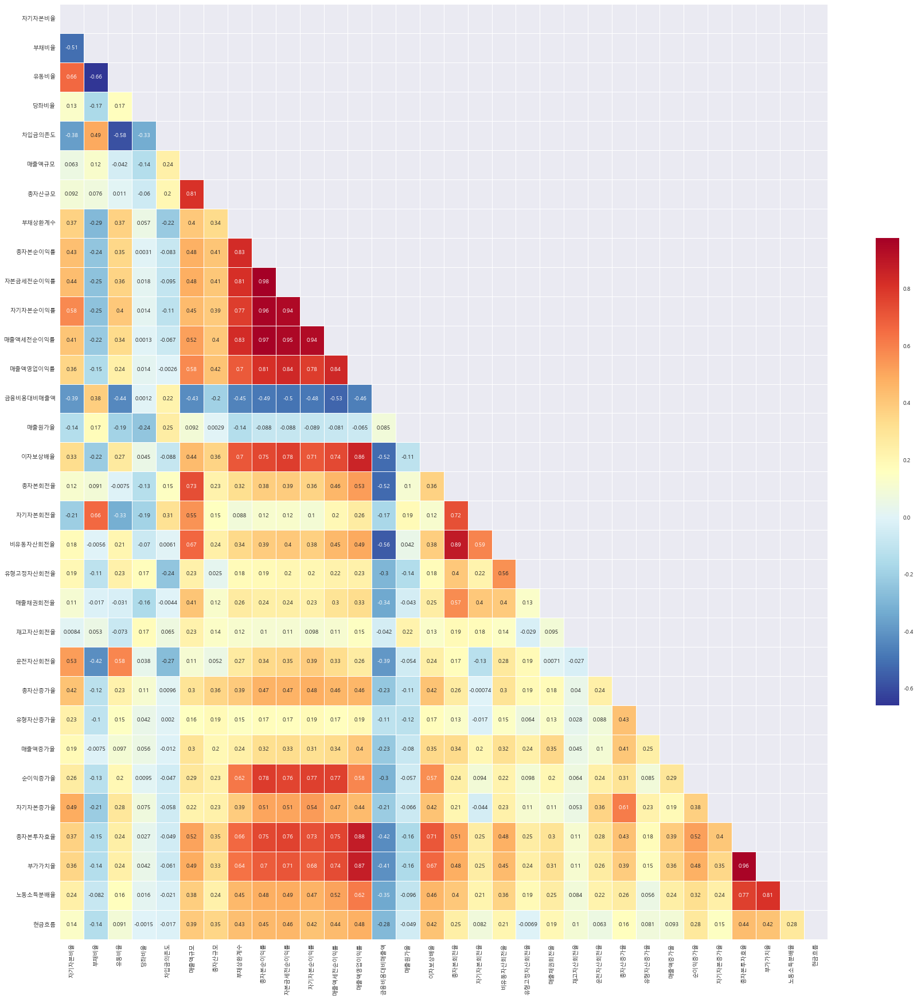

In [129]:
# 3. standard 상관행렬 시각화
mask_ut=np.triu(np.ones(df_final_log.corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(df_final_log.corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut)
plt.show()

### 2-4-2. 유의성검정,VIF를 이용한 다중공선성 확인

In [99]:
# 1-1) 상수항 추가
x_ = sm.add_constant(df_final_log, has_constant = "add")

# 1-2) 회귀모델 적합
multi_model4 = sm.Logit(df_final[['y']], x_)
fitted_multi_model4 = multi_model4.fit()

# 1-3) 결과 출력
fitted_multi_model4.summary()

Optimization terminated successfully.
         Current function value: 0.404746
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  938
Model:                          Logit   Df Residuals:                      905
Method:                           MLE   Df Model:                           32
Date:                Thu, 29 Sep 2022   Pseudo R-squ.:                  0.4161
Time:                        16:03:23   Log-Likelihood:                -379.65
converged:                       True   LL-Null:                       -650.17
Covariance Type:            nonrobust   LLR p-value:                 8.045e-94
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         27.1049      7.022      3.860      0.000      13.343      40.867
자기자본비율        -2.1996      0.925     -2.379      0.017      -4.012      -0.387
부채비율          -1.1019      0.346     -3.189      0.001      -1.779      -0.425
유동비율          -0.6568      0.234     -2.810      0.005      -1.115      -0.199
당좌비율           0.1697      0.447      0.379      0.704      -0.707       1.046
차입금의존도        -0.2161      0.102     -2.118      0.034      -0.416      -0.016
매출액규모         -0.8265      0.614     -1.346      0.178      -2.030       0.377
총자산규모          0.1505      0.611      0.246      0.806      -1.048       1.349
부채상환계수        -0.0439      0.035     -1.259      0.208      -0.112       0.024
총자본순이익률       -0.9011      0.534     -1.688      0.091      -1.947       0.145
자본금세전순이익률      0.3710      0.319      1.164      0.245      -0.254       0.996
자기자본순이익률      -0.1085      0.273     -0.398      0.691      -0.643       0.426
매출액세전순이익률      0.2487      0.193      1.287      0.198      -0.130       0.627
매출액영업이익률      -0.1962      0.141     -1.394      0.163      -0.472       0.080
금융비용대비매출액      0.3853      0.156      2.471      0.013       0.080       0.691
매출원가율          0.0866      0.120      0.722      0.470      -0.148       0.321
이자보상배율         0.0536      0.030      1.768      0.077      -0.006       0.113
총자본회전율        -0.2623      0.867     -0.303      0.762      -1.961       1.436
자기자본회전율        0.9350      0.779      1.200      0.230      -0.593       2.463
비유동자산회전율       0.0054      0.297      0.018      0.986      -0.577       0.588
유형고정자산회전율     -0.1844      0.098     -1.875      0.061      -0.377       0.008
매출채권회전율       -0.4106      0.170     -2.413      0.016      -0.744      -0.077
재고자산회전율        0.0139      0.047      0.295      0.768      -0.078       0.106
운전자산회전율       -0.0028      0.024     -0.117      0.907      -0.049       0.044
총자산증가율        -0.0966      0.055     -1.766      0.077      -0.204       0.011
유형자산증가율       -0.0547      0.033     -1.664      0.096      -0.119       0.010
매출액증가율         0.0079      0.035      0.227      0.821      -0.060       0.076
순이익증가율         0.0985      0.035      2.853      0.004       0.031       0.166
자기자본증가율        0.1044      0.042      2.478      0.013       0.022       0.187
총자본투자효율       -0.0721      0.266     -0.271      0.786      -0.593       0.449
부가가치율          0.2725      0.193      1.415      0.157      -0.105       0.650
노동소득분배율       -0.0627      0.044     -1.429      0.153      -0.149       0.023
현금흐름          -0.1349      0.045     -2.970      0.003      -0.224      -0.046
==============================================================================
"""

In [100]:
# 2) 유의한 변수들만 보이기
list_ = pd.DataFrame(fitted_multi_model4.pvalues, columns = ['p_value'])
list_[(list_['p_value'] < 0.05)][['p_value']].sort_values('p_value')

,p_value
const,0.000113
부채비율,0.001430
현금흐름,0.002981
순이익증가율,0.004334
유동비율,0.004961
자기자본증가율,0.013229
금융비용대비매출액,0.013477
매출채권회전율,0.015836
자기자본비율,0.017374
차입금의존도,0.034136


In [98]:
vif(df_final_log)

,VIF Factor,features
0,7953.306333,총자산규모
1,7849.796860,매출액규모
2,572.444248,총자본회전율
3,327.292675,당좌비율
4,240.983754,자기자본회전율
5,219.318988,비유동자산회전율
6,146.728746,부채비율
7,131.802058,유동비율
8,130.908211,자기자본비율
9,104.345976,매출채권회전율


In [101]:
# 총자산규모
x1_log = df_final_log.drop('총자산규모',axis = 1)
# vif 확인
vif(x1_log)

,VIF Factor,features
0,413.142491,총자본회전율
1,399.582883,매출액규모
2,276.380963,당좌비율
3,216.962181,비유동자산회전율
4,212.043072,자기자본회전율
5,121.978651,부채비율
6,120.395887,자기자본비율
7,115.376362,유동비율
8,100.734852,매출채권회전율
9,86.589052,총자본순이익률


In [102]:
# 총자본회전율
x2_log = x1_log.drop('총자본회전율',axis = 1)
# vif 확인
vif(x2_log)

,VIF Factor,features
0,377.014757,매출액규모
1,270.423895,당좌비율
2,138.253547,자기자본회전율
3,125.134929,비유동자산회전율
4,118.723402,자기자본비율
5,97.721504,유동비율
6,89.950192,부채비율
7,88.242549,매출채권회전율
8,86.202783,총자본순이익률
9,41.341796,매출액세전순이익률


In [103]:
# 매출액규모
x3_log = x2_log.drop('매출액규모',axis = 1)
# vif 확인
vif(x3_log)

,VIF Factor,features
0,214.528361,당좌비율
1,137.930075,자기자본회전율
2,117.727806,자기자본비율
3,109.130309,비유동자산회전율
4,96.614414,유동비율
5,87.120496,부채비율
6,84.490883,총자본순이익률
7,77.186592,매출채권회전율
8,41.198999,매출액세전순이익률
9,38.959892,자기자본순이익률


In [104]:
# 당좌비율
x4_log = x3_log.drop('당좌비율',axis = 1)
# vif 확인
vif(x4_log)

,VIF Factor,features
0,129.533766,자기자본회전율
1,108.067662,비유동자산회전율
2,102.695853,자기자본비율
3,85.324764,유동비율
4,83.217196,총자본순이익률
5,73.916396,부채비율
6,70.413277,매출채권회전율
7,41.127881,매출액세전순이익률
8,34.573070,자기자본순이익률
9,32.962963,유형고정자산회전율


In [130]:
# 비유동자산회전율
x5_log = x4_log.drop('비유동자산회전율',axis = 1)
# vif 확인
vif(x5_log)

,VIF Factor,features
0,101.714888,자기자본비율
1,92.534164,자기자본회전율
2,83.010694,총자본순이익률
3,76.900339,유동비율
4,69.745160,매출채권회전율
5,67.981180,부채비율
6,40.915521,매출액세전순이익률
7,34.562958,자기자본순이익률
8,30.185043,부가가치율
9,29.823778,자본금세전순이익률


In [131]:
# 부채비율
x6_log = x5_log.drop('부채비율',axis = 1)
# vif 확인
vif(x6_log)

,VIF Factor,features
0,101.711816,자기자본비율
1,82.613174,총자본순이익률
2,76.889412,유동비율
3,68.860318,매출채권회전율
4,40.279425,매출액세전순이익률
5,34.512794,자기자본순이익률
6,33.008517,자기자본회전율
7,29.815462,자본금세전순이익률
8,29.496102,부가가치율
9,29.031373,매출원가율


In [132]:
# 매출액세전순이익률
x7_log = x6_log.drop('매출액세전순이익률',axis = 1)
# vif 확인
vif(x7_log)

,VIF Factor,features
0,99.322596,자기자본비율
1,76.761285,유동비율
2,68.532665,매출채권회전율
3,61.966505,총자본순이익률
4,33.870541,자기자본순이익률
5,32.302748,자기자본회전율
6,29.786883,자본금세전순이익률
7,28.991943,매출원가율
8,24.381139,부가가치율
9,24.146457,유형고정자산회전율


In [133]:
# 자기자본순이익률
x8_log = x7_log.drop('자기자본순이익률',axis = 1)
# vif 확인
vif(x8_log)

,VIF Factor,features
0,66.311171,유동비율
1,62.279758,매출채권회전율
2,57.083893,자기자본비율
3,33.655765,총자본순이익률
4,31.918964,자기자본회전율
5,29.759643,자본금세전순이익률
6,28.599339,매출원가율
7,24.351177,부가가치율
8,24.031599,유형고정자산회전율
9,21.209567,총자본투자효율


In [134]:
# 자본금세전순이익률
x9_log = x8_log.drop('자본금세전순이익률',axis = 1)
# vif 확인
vif(x9_log)

,VIF Factor,features
0,66.243166,유동비율
1,62.250723,매출채권회전율
2,57.079572,자기자본비율
3,31.918962,자기자본회전율
4,28.593178,매출원가율
5,24.263481,부가가치율
6,24.030278,유형고정자산회전율
7,21.113099,총자본투자효율
8,14.472721,매출액영업이익률
9,10.596955,총자본순이익률


In [135]:
# 매출원가율
x10_log = x9_log.drop('매출원가율',axis = 1)
# vif 확인
vif(x10_log)

,VIF Factor,features
0,63.911848,유동비율
1,61.703747,매출채권회전율
2,56.442486,자기자본비율
3,30.406510,자기자본회전율
4,24.009196,유형고정자산회전율
5,23.996442,부가가치율
6,21.061178,총자본투자효율
7,14.270806,매출액영업이익률
8,10.596762,총자본순이익률
9,9.643076,재고자산회전율


In [136]:
# 유형고정자산회전율
x11_log = x10_log.drop('유형고정자산회전율',axis = 1)
# vif 확인
vif(x11_log)

,VIF Factor,features
0,61.341879,매출채권회전율
1,58.912004,유동비율
2,56.248660,자기자본비율
3,27.123788,자기자본회전율
4,23.924905,부가가치율
5,20.914226,총자본투자효율
6,14.265372,매출액영업이익률
7,10.589396,총자본순이익률
8,9.636269,재고자산회전율
9,5.473872,이자보상배율


In [137]:
# 부가가치율
x12_log = x11_log.drop('부가가치율',axis = 1)
# vif 확인
vif(x12_log)

,VIF Factor,features
0,61.335982,매출채권회전율
1,58.908939,유동비율
2,55.842325,자기자본비율
3,26.922473,자기자본회전율
4,10.263662,매출액영업이익률
5,9.900644,총자본순이익률
6,9.632946,재고자산회전율
7,9.110097,총자본투자효율
8,5.336428,차입금의존도
9,4.821989,이자보상배율


In [139]:
# 매출액영업이익률
x13_log = x12_log.drop('매출액영업이익률',axis = 1)
# vif 확인
df_x13_log = vif(x13_log)
df_x13_log

,VIF Factor,features
0,61.156098,매출채권회전율
1,57.870002,유동비율
2,55.727506,자기자본비율
3,26.669554,자기자본회전율
4,9.632246,재고자산회전율
5,9.072213,총자본순이익률
6,6.948438,총자본투자효율
7,5.336427,차입금의존도
8,4.047615,부채상환계수
9,3.633537,금융비용대비매출액


In [140]:
# 3) 다중 공선성이 없는 변수들만 모은 데이터 프레임
df_x13_log = df_x13_log.reset_index(drop=True)['features']
df_x13_log[df_x13_log.index.max()+1] = 'y'
df_final_x13_log = df_final[df_x13_log]
df_final_x13_log

,매출채권회전율,유동비율,자기자본비율,자기자본회전율,재고자산회전율,총자본순이익률,총자본투자효율,차입금의존도,부채상환계수,금융비용대비매출액,순이익증가율,노동소득분배율,이자보상배율,총자산증가율,자기자본증가율,운전자산회전율,매출액증가율,현금흐름,유형자산증가율,y
0,207.069186,171.652368,41.659492,117.207626,4103.261605,-10.714159,-3.355146,12.303099,-89.560725,2.181178,-146.148683,-99.011783,-720.507696,-40.698452,-36.568135,260.835838,-10.095643,17.397557,-7.485894,1.0
1,326.816705,51.192980,20.669768,220.381043,724.574248,-7.445354,2.745650,36.337895,7.374011,5.820381,-231.855405,193.362805,-135.010369,-18.218210,-55.327901,-163.121344,-20.337630,-8.818698,21.664094,1.0
2,252.028667,324.774250,48.368876,85.593433,564.456445,-15.116177,5.770305,0.598762,-358.813255,2.936858,-239.163255,76.620945,32.124816,-47.643241,60.397782,155.943863,-37.703368,7.409362,-98.376233,1.0
3,433.103612,41.744283,37.021190,55.077048,348.484688,-35.200343,-6.899849,6.594573,-144.152613,43.259518,-442.614164,-69.583921,-166.569488,0.766632,-8.762799,-58.441035,-7.731282,-45.108715,38.002005,1.0
4,356.074466,17.931353,-12.754704,-102.177825,368.856097,-17.252203,-0.120078,6.355326,-34.427106,73.155331,-140.041210,-2612.069777,-75.420044,-37.226271,-128.146832,-17.828586,-47.782566,17.882626,-61.348826,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,142.098806,2761.424968,93.079812,11.929506,384.532165,-2.380746,-0.804465,0.000000,716.861254,0.390697,-326.947283,-337.923284,-10533.731559,-4.626905,-2.185597,14.103125,-22.856771,-4.101015,45.244686,0.0
934,245.222662,117.374389,59.525673,62.689478,365.140571,-3.382666,3.849428,27.414434,10.571588,7.246359,-853.589342,101.143427,-33.537862,33.344563,66.091353,595.979618,-17.232473,8.226030,2.677153,0.0
935,686.028360,629.191005,89.105169,37.779315,368.929136,-0.594747,5.070220,0.700766,506.016413,0.069561,-110.388840,76.633829,-520.817803,-1.888743,-3.774855,92.219919,-7.706858,4.800863,19.122630,0.0
936,190.586116,135.740416,32.634844,314.941934,0.000000,-14.352540,-3.525107,17.276681,-51.875354,1.586723,-2427.908560,-28.575109,-297.795205,6.921679,55.448194,453.226828,124.657694,-69.421513,-2.693640,0.0


### 2-4-3. 로지스틱 회귀 전 정규성 검정, 독립성 검정, 등분산성 검정

In [141]:
normal_s,notnormal_s = normal_test('shapiro',x13_log)
normal_s

,normal


In [142]:
normal_a,notnormal_a = normal_test('anderson',x13_log)
normal_a

,normal


In [143]:
normal_ks,notnormal_ks = normal_test('kstest',x13_log)
normal_ks

,normal


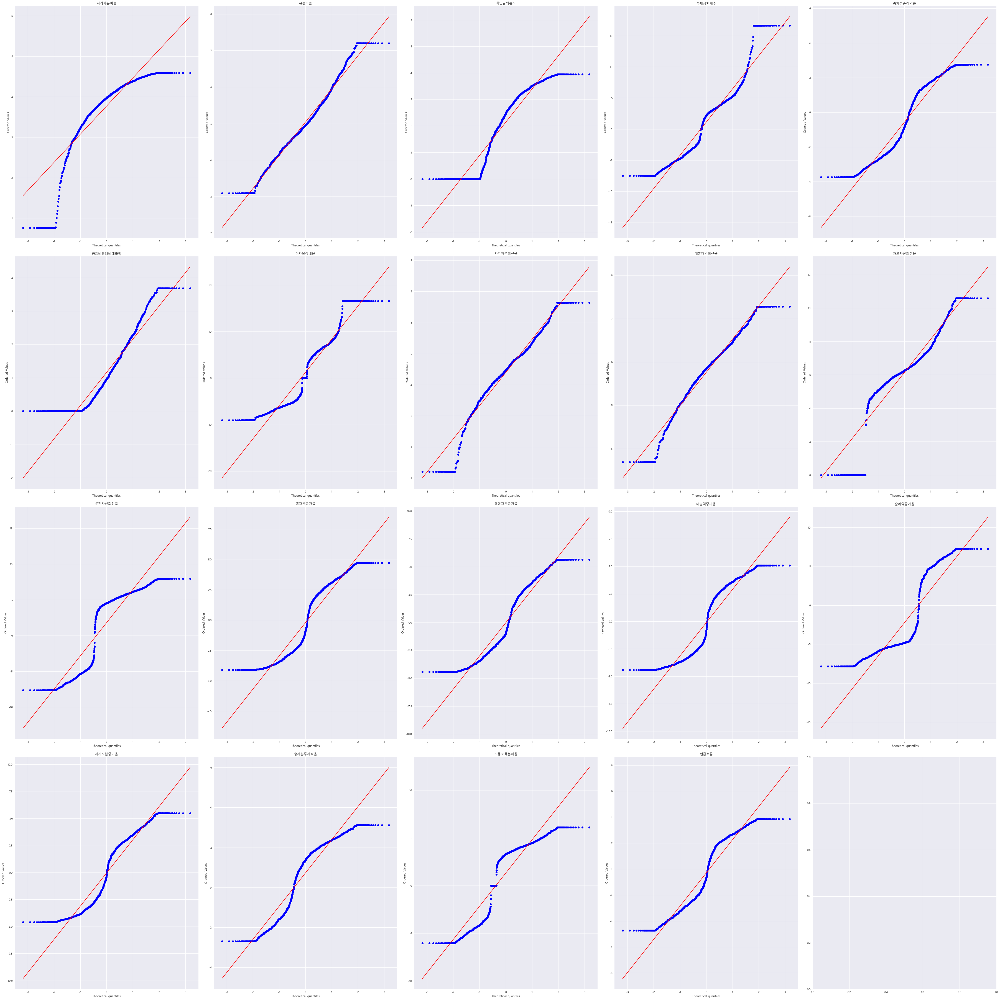

In [144]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 4

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), x13_log):
       stats.probplot(x13_log[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

In [145]:
# 이분산성 변수
x_hetero_log = bartlett_test(x13_log.columns, df_final_x13_log[df_final_x13_log['y']==0], df_final_x13_log[df_final_x13_log['y']==1], H = 1)
x_hetero_log

,변수,p_value
18,현금흐름,0.000000e+00
5,금융비용대비매출액,0.000000e+00
12,유형자산증가율,0.000000e+00
7,자기자본회전율,1.050863e-305
15,자기자본증가율,3.582216e-253
14,순이익증가율,4.340822e-161
17,노동소득분배율,4.153142e-97
4,총자본순이익률,7.157291e-82
10,운전자산회전율,1.429210e-72
13,매출액증가율,7.678056e-39


In [146]:
# 등분산성 변수
x_homo_log =bartlett_test(x13_log.columns, df_final_x13_log[df_final_x13_log['y']==0], df_final_x13_log[df_final_x13_log['y']==1], H = 0)
x_homo_log

,변수,p_value


### 2-4-4. T-test(등분산성,이분산성 변수가 있다는 가정 하에)

In [147]:
# 2) t_test 결과 p_value < 0.05보다 작은 유의한 변수 가져오기
x_ttest_log = t_test(x13_log.columns, x_homo_log, x_hetero_log, df_final_x13_log[df_final_x13_log['y']==0], df_final_x13_log[df_final_x13_log['y']==1], p_value=0.05)
x_ttest_log

,변수,p_value
0,자기자본비율,7.304718e-41
4,총자본순이익률,1.196899e-33
16,총자본투자효율,1.860080e-33
11,총자산증가율,8.392682e-16
8,매출채권회전율,6.726408e-08
6,이자보상배율,2.480247e-06
3,부채상환계수,1.320261e-03
5,금융비용대비매출액,1.964549e-03
1,유동비율,9.025795e-03
18,현금흐름,1.950471e-02


In [155]:
len(x_ttest_log)

12

In [148]:
# 3) t test 유의한 변수들만 모은 데이터 프레임
x_ttest_log = x_ttest_log.reset_index(drop=True)['변수']
x_ttest_log[x_ttest_log.index.max()+1] = 'y'
df_final_ttest_log = df_final[x_ttest_log]
df_final_ttest_log

,자기자본비율,총자본순이익률,총자본투자효율,총자산증가율,매출채권회전율,이자보상배율,부채상환계수,금융비용대비매출액,유동비율,현금흐름,매출액증가율,y
0,41.659492,-10.714159,-3.355146,-40.698452,207.069186,-720.507696,-89.560725,2.181178,171.652368,17.397557,-10.095643,1.0
1,20.669768,-7.445354,2.745650,-18.218210,326.816705,-135.010369,7.374011,5.820381,51.192980,-8.818698,-20.337630,1.0
2,48.368876,-15.116177,5.770305,-47.643241,252.028667,32.124816,-358.813255,2.936858,324.774250,7.409362,-37.703368,1.0
3,37.021190,-35.200343,-6.899849,0.766632,433.103612,-166.569488,-144.152613,43.259518,41.744283,-45.108715,-7.731282,1.0
4,-12.754704,-17.252203,-0.120078,-37.226271,356.074466,-75.420044,-34.427106,73.155331,17.931353,17.882626,-47.782566,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.079812,-2.380746,-0.804465,-4.626905,142.098806,-10533.731559,716.861254,0.390697,2761.424968,-4.101015,-22.856771,0.0
934,59.525673,-3.382666,3.849428,33.344563,245.222662,-33.537862,10.571588,7.246359,117.374389,8.226030,-17.232473,0.0
935,89.105169,-0.594747,5.070220,-1.888743,686.028360,-520.817803,506.016413,0.069561,629.191005,4.800863,-7.706858,0.0
936,32.634844,-14.352540,-3.525107,6.921679,190.586116,-297.795205,-51.875354,1.586723,135.740416,-69.421513,124.657694,0.0


### 2-4-5. Lasso

In [149]:
lasso = SelectFromModel(LogisticRegression(C=1, penalty='l1',solver='liblinear'))
lasso.fit(x13_log, df_final_x13_log['y'])
lasso_support = lasso.get_support()
lr_feature_log = x13_log.loc[:,lasso_support].columns.tolist()
print(str(len(lr_feature_log)), 'selected features')

19 selected features


In [150]:
# lasso 선택된 변수들만 모은 데이터 프레임
lr_feature_log.append('y')
df_final_lasso_log = df_final[lr_feature_log]
df_final_lasso_log

,자기자본비율,유동비율,차입금의존도,부채상환계수,총자본순이익률,금융비용대비매출액,이자보상배율,자기자본회전율,매출채권회전율,재고자산회전율,운전자산회전율,총자산증가율,유형자산증가율,매출액증가율,순이익증가율,자기자본증가율,총자본투자효율,노동소득분배율,현금흐름,y
0,41.659492,171.652368,12.303099,-89.560725,-10.714159,2.181178,-720.507696,117.207626,207.069186,4103.261605,260.835838,-40.698452,-7.485894,-10.095643,-146.148683,-36.568135,-3.355146,-99.011783,17.397557,1.0
1,20.669768,51.192980,36.337895,7.374011,-7.445354,5.820381,-135.010369,220.381043,326.816705,724.574248,-163.121344,-18.218210,21.664094,-20.337630,-231.855405,-55.327901,2.745650,193.362805,-8.818698,1.0
2,48.368876,324.774250,0.598762,-358.813255,-15.116177,2.936858,32.124816,85.593433,252.028667,564.456445,155.943863,-47.643241,-98.376233,-37.703368,-239.163255,60.397782,5.770305,76.620945,7.409362,1.0
3,37.021190,41.744283,6.594573,-144.152613,-35.200343,43.259518,-166.569488,55.077048,433.103612,348.484688,-58.441035,0.766632,38.002005,-7.731282,-442.614164,-8.762799,-6.899849,-69.583921,-45.108715,1.0
4,-12.754704,17.931353,6.355326,-34.427106,-17.252203,73.155331,-75.420044,-102.177825,356.074466,368.856097,-17.828586,-37.226271,-61.348826,-47.782566,-140.041210,-128.146832,-0.120078,-2612.069777,17.882626,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.079812,2761.424968,0.000000,716.861254,-2.380746,0.390697,-10533.731559,11.929506,142.098806,384.532165,14.103125,-4.626905,45.244686,-22.856771,-326.947283,-2.185597,-0.804465,-337.923284,-4.101015,0.0
934,59.525673,117.374389,27.414434,10.571588,-3.382666,7.246359,-33.537862,62.689478,245.222662,365.140571,595.979618,33.344563,2.677153,-17.232473,-853.589342,66.091353,3.849428,101.143427,8.226030,0.0
935,89.105169,629.191005,0.700766,506.016413,-0.594747,0.069561,-520.817803,37.779315,686.028360,368.929136,92.219919,-1.888743,19.122630,-7.706858,-110.388840,-3.774855,5.070220,76.633829,4.800863,0.0
936,32.634844,135.740416,17.276681,-51.875354,-14.352540,1.586723,-297.795205,314.941934,190.586116,0.000000,453.226828,6.921679,-2.693640,124.657694,-2427.908560,55.448194,-3.525107,-28.575109,-69.421513,0.0


In [151]:
lr_feature_log

['자기자본비율',
 '유동비율',
 '차입금의존도',
 '부채상환계수',
 '총자본순이익률',
 '금융비용대비매출액',
 '이자보상배율',
 '자기자본회전율',
 '매출채권회전율',
 '재고자산회전율',
 '운전자산회전율',
 '총자산증가율',
 '유형자산증가율',
 '매출액증가율',
 '순이익증가율',
 '자기자본증가율',
 '총자본투자효율',
 '노동소득분배율',
 '현금흐름',
 'y']

### 2-4-6. Stepwise

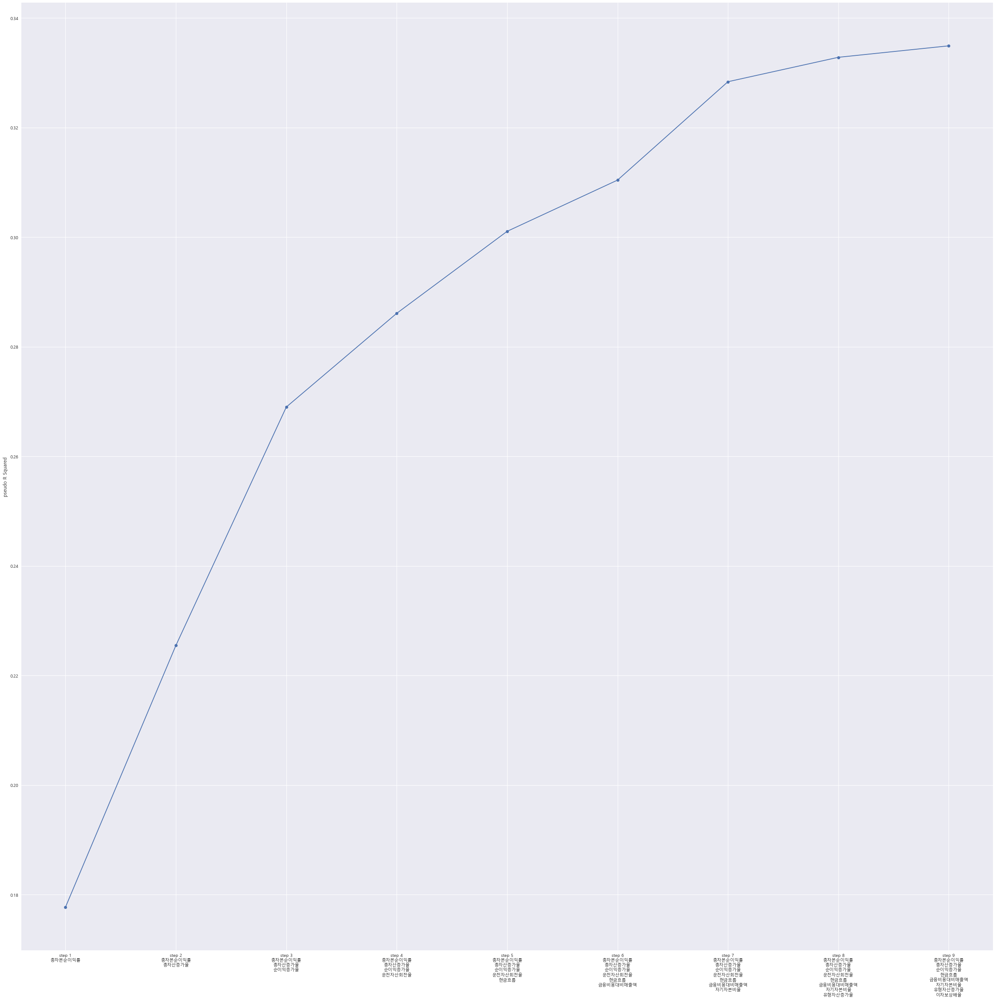

In [152]:
def stepwise_feature_selection(feature, target, variables):
    import statsmodels.api as sm
    import matplotlib.pyplot as plt
    import warnings
    import pandas as pd
    warnings.filterwarnings("ignore")
    
    y = target ## 반응 변수

    selected_variables = [] ## 선택된 변수들
    sl_enter = 0.05
    sl_remove = 0.05
    
    sv_per_step = [] ## 각 스텝별로 선택된 변수들
    r_squared = [] ## 각 스텝별 수정된 결정계수
    steps = [] ## 스텝
    step = 0
    while len(variables) > 0:
        remainder = list(set(variables) - set(selected_variables))
        pval = pd.Series(index=remainder) ## 변수의 p-value
        ## 기존에 포함된 변수와 새로운 변수 하나씩 돌아가면서
        ## 선형 모형을 적합한다.
        for col in remainder: 
            X = feature[selected_variables+[col]]
            model = sm.Logit(y,X).fit(disp=0)
            pval[col] = model.pvalues[col]
    
        min_pval = pval.min()
        if min_pval < sl_enter: ## 최소 p-value 값이 기준 값보다 작으면 포함
            selected_variables.append(pval.idxmin())
            ## 선택된 변수들에대해서
            ## 어떤 변수를 제거할지 고른다.
            while len(selected_variables) > 0:
                selected_X = feature[selected_variables]
                selected_pval = sm.Logit(y,selected_X).fit(disp=0).pvalues[:]
                max_pval = selected_pval.max()
                if max_pval >= sl_remove: ## 최대 p-value값이 기준값보다 크거나 같으면 제외
                    remove_variable = selected_pval.idxmax()
                    selected_variables.remove(remove_variable)
                else:
                    break
            
            step += 1
            steps.append(step)
            presudo_r_squared = sm.Logit(y,feature[selected_variables]).fit(disp=0).prsquared
            r_squared.append(presudo_r_squared)
            sv_per_step.append(selected_variables.copy())
        else:
            break

    
    # 시각화
    fig = plt.figure(figsize=(40,40))
    plt.xticks(steps,[f'step {s}\n'+'\n'.join(sv_per_step[i]) for i,s in enumerate(steps)])
    plt.plot(steps,r_squared, marker='o')
    plt.ylabel('pseudo R Squared')
    plt.grid(True)
    plt.show()

    return selected_variables
    
selected_variables = stepwise_feature_selection(x13_log, df_final_x13_log['y'],x13_log.columns.tolist())

### 2-4-6. 선택 -> Step8
'총자본순이익률','총자산증가율','순이익증가율','운전자산회전율','현금흐름','금융비용대비매출액','자기자본비율','유형자산증가율'

In [153]:
# select된 변수 들고오기
select_log = ['총자본순이익률','총자산증가율','순이익증가율','운전자산회전율','현금흐름','금융비용대비매출액','자기자본비율','유형자산증가율']
select_log.append('y')
df_select_log = df_final[select_log]
df_select_log

,총자본순이익률,총자산증가율,순이익증가율,운전자산회전율,현금흐름,금융비용대비매출액,자기자본비율,유형자산증가율,y
0,-10.714159,-40.698452,-146.148683,260.835838,17.397557,2.181178,41.659492,-7.485894,1.0
1,-7.445354,-18.218210,-231.855405,-163.121344,-8.818698,5.820381,20.669768,21.664094,1.0
2,-15.116177,-47.643241,-239.163255,155.943863,7.409362,2.936858,48.368876,-98.376233,1.0
3,-35.200343,0.766632,-442.614164,-58.441035,-45.108715,43.259518,37.021190,38.002005,1.0
4,-17.252203,-37.226271,-140.041210,-17.828586,17.882626,73.155331,-12.754704,-61.348826,1.0
...,...,...,...,...,...,...,...,...,...
933,-2.380746,-4.626905,-326.947283,14.103125,-4.101015,0.390697,93.079812,45.244686,0.0
934,-3.382666,33.344563,-853.589342,595.979618,8.226030,7.246359,59.525673,2.677153,0.0
935,-0.594747,-1.888743,-110.388840,92.219919,4.800863,0.069561,89.105169,19.122630,0.0
936,-14.352540,6.921679,-2427.908560,453.226828,-69.421513,1.586723,32.634844,-2.693640,0.0


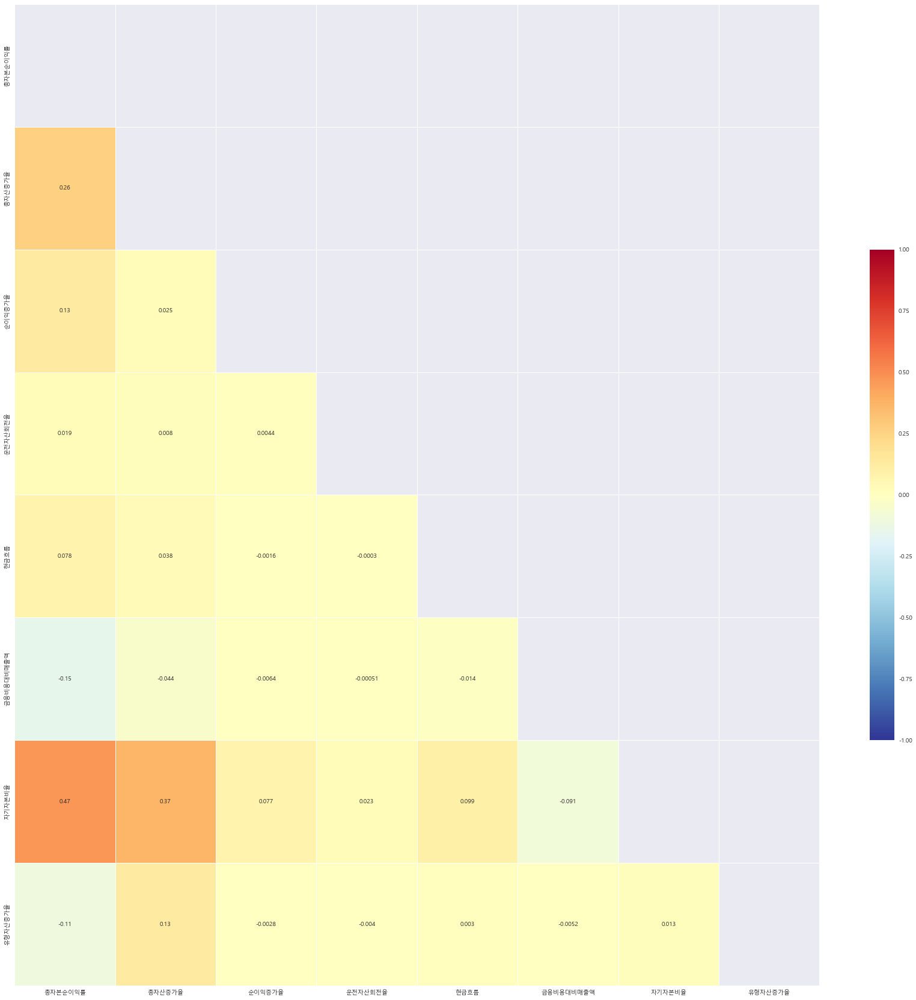

In [154]:
# 상관행렬 시각화
mask_ut=np.triu(np.ones(df_select_log.drop('y',axis=1).corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(df_select_log.drop('y',axis=1).corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut, vmin=-1, vmax=1)
plt.show()

In [156]:
df_final_log_full = pd.concat([df_select_log, df_final[['감사의견코드','광업', '교육 서비스업', '도매 및 소매업',
       '사업시설 관리, 사업 지원 및 임대 서비스업', '수도, 하수 및 폐기물 처리, 원료 재생업',
       '예술, 스포츠 및 여가관련 서비스업', '전기, 가스, 증기 및 공기조절 공급업', '전문, 과학 및 기술 서비스업',
       '정보통신업', '제조업','회계년도']]],axis=1)
df_final_log_full

,총자본순이익률,총자산증가율,순이익증가율,운전자산회전율,현금흐름,금융비용대비매출액,자기자본비율,유형자산증가율,y,감사의견코드,...,교육 서비스업,도매 및 소매업,"사업시설 관리, 사업 지원 및 임대 서비스업","수도, 하수 및 폐기물 처리, 원료 재생업","예술, 스포츠 및 여가관련 서비스업","전기, 가스, 증기 및 공기조절 공급업","전문, 과학 및 기술 서비스업",정보통신업,제조업,회계년도
0,-10.714159,-40.698452,-146.148683,260.835838,17.397557,2.181178,41.659492,-7.485894,1.0,1,...,0,0,0,0,0,0,0,0,1,2020
1,-7.445354,-18.218210,-231.855405,-163.121344,-8.818698,5.820381,20.669768,21.664094,1.0,1,...,0,0,0,0,0,0,0,1,0,2014
2,-15.116177,-47.643241,-239.163255,155.943863,7.409362,2.936858,48.368876,-98.376233,1.0,1,...,0,0,0,0,0,0,0,1,0,2015
3,-35.200343,0.766632,-442.614164,-58.441035,-45.108715,43.259518,37.021190,38.002005,1.0,0,...,0,0,0,0,0,0,0,1,0,2019
4,-17.252203,-37.226271,-140.041210,-17.828586,17.882626,73.155331,-12.754704,-61.348826,1.0,1,...,0,0,0,0,0,0,0,1,0,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,-2.380746,-4.626905,-326.947283,14.103125,-4.101015,0.390697,93.079812,45.244686,0.0,1,...,0,0,0,0,0,0,0,0,1,2020
934,-3.382666,33.344563,-853.589342,595.979618,8.226030,7.246359,59.525673,2.677153,0.0,1,...,0,0,0,0,0,0,0,0,1,2020
935,-0.594747,-1.888743,-110.388840,92.219919,4.800863,0.069561,89.105169,19.122630,0.0,1,...,0,0,0,0,0,0,0,0,1,2020
936,-14.352540,6.921679,-2427.908560,453.226828,-69.421513,1.586723,32.634844,-2.693640,0.0,1,...,0,0,0,0,0,0,0,0,1,2020


In [157]:
df_final_log_full.to_csv('./data/df_final_log_full.csv')

# 3. Scaler 선택 (Logistic 정확도 비교)

In [158]:
# 기본 setting
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import font_manager, rc
font_path = "C:/Windows/Fonts/malgun.ttf"
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)
import warnings
warnings.filterwarnings(action = 'ignore')
pd.options.display.float_format = '{:.5f}'.format

# Model
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
import graphviz
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from lightgbm import plot_importance
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import Sequential
from keras.layers import Dense,Dropout

from sklearn.preprocessing import StandardScaler, RobustScaler, QuantileTransformer, MinMaxScaler
from sklearn.model_selection import KFold , GridSearchCV , train_test_split
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score ,roc_auc_score, roc_curve,confusion_matrix
from sklearn.preprocessing import Binarizer


## 3-1. 모델 돌리기 전 함수 만들기

In [200]:
df_sd = pd.read_csv('./data/df_final_sd_full.csv', index_col=0)
df_rb = pd.read_csv('./data/df_final_rb_full.csv', index_col=0)
df_mm = pd.read_csv('./data/df_final_mm_full.csv', index_col=0)
df_log = pd.read_csv('./data/df_final_log_full.csv', index_col=0)

### 3-1-1. Standard

### 3-1-1(1). confusion matrix 만드는 함수 만들기

In [201]:
# 1) train, test 나누는 함수
def data(df):
    X = df_sd.drop(['y'], axis=1)
    y = df_sd[['y']]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2 ,random_state=121)

    return X_train, X_test, y_train, y_test

In [202]:
# 2) confusion matrix 만드는 함수
def score(y_test, pred):
    # score print
    print('accuracy score : {0:.3f}'.format(accuracy_score(y_test, pred)))
    print('precision score : {0:.3f}'.format(precision_score(y_test, pred)))
    print('recall score : {0:.3f}'.format(recall_score(y_test, pred)))
    print('f1 score : {0:.3f}'.format(f1_score(y_test, pred)))
    print('roc score : {0:.3f}'.format(roc_auc_score(y_test, pred)))
    # confusion matirx 함수
    cm = confusion_matrix(y_test, pred)
    sns.heatmap(cm, annot=True, annot_kws={"size": 20}, cmap='PuBu', fmt='g')
    plt.xlabel('Predicted', fontsize=20)
    plt.ylabel('Actual', fontsize=20)

In [203]:
# 3) thresholds를 무엇으로 하는가에 따라 score 산출하는 함수
def get_f1_score(y_test, pred_proba_1):

    thresholds = [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    accuracys = []
    precisions = []
    recalls = []
    f1_scores = []
    auc_scores=[]

    for threshold in thresholds:
        binarizer = Binarizer(threshold = threshold)
        pred_proba = binarizer.fit_transform(pred_proba_1)

        accuracy = accuracy_score(y_test, pred_proba)
        precision = precision_score(y_test, pred_proba)
        recall = recall_score(y_test, pred_proba)
        f1score = f1_score(y_test, pred_proba)
        auc_score=roc_auc_score(y_test, pred_proba)

        accuracys.append(accuracy)
        precisions.append(precision)
        recalls.append(recall)
        f1_scores.append(f1score)
        auc_scores.append(auc_score)
        
    results = pd.DataFrame(data = {"Accuracy": accuracys, "Precision": precisions, "Recall": recalls, "F1 score": f1_scores,"Auc_Score":auc_scores}, index = thresholds)
    print(results)

### 3-1-1(2). Logistic

In [211]:
def Logistic(df):
    X_train, X_test, y_train, y_test = data(df)

    logistic = LogisticRegression()
    param_logit = {'penalty' : ['l2'],
                   'C' : [0.001, 0.01, 0.1, 1, 10, 100],
                   'solver' : ['liblinear'], # 'lbfgs', 'newton-cg' 
                   'random_state' : [121],
                   'class_weight' : ['balanced', None]}

    gridsearch = GridSearchCV(logistic, param_grid = param_logit, cv = KFold(n_splits=5, shuffle = True, random_state=121), n_jobs=-1, scoring='f1', verbose=0)
    gridsearch.fit(X_train, y_train)

    print('최적 파라미터\n', gridsearch.best_params_)
    print('학습 데이터 정확도 : ', gridsearch.best_score_)

    estimator = gridsearch.best_estimator_
    pred = pd.DataFrame(estimator.predict(X_test))
    # pred = estimator.predict(X_test)
    print('\n예측 데이터 정확도')
    score(y_test, pred)
    
    return gridsearch.fit(X_train, y_train)

최적 파라미터
 {'C': 0.1, 'class_weight': None, 'penalty': 'l2', 'random_state': 121, 'solver': 'liblinear'}
학습 데이터 정확도 :  0.8062230888448572

예측 데이터 정확도
accuracy score : 0.787
precision score : 0.833
recall score : 0.707
f1 score : 0.765
roc score : 0.786


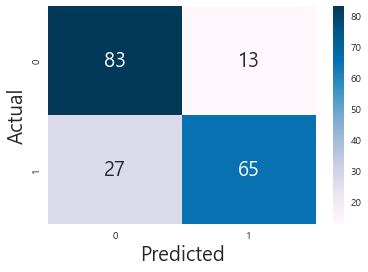

In [205]:
logistic = Logistic(df_sd)

### 3-1-2. Robust

In [210]:
# 1) train, test 나누는 함수
def data(df):
    X = df.drop(['y'], axis=1)
    y = df[['y']]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2 ,random_state=121)

    return X_train, X_test, y_train, y_test
# df_mm = pd.read_csv('./data/df_final_x4_mm.csv', index_col=0)
# 1) train, test 나누는 함수

최적 파라미터
 {'C': 0.1, 'class_weight': None, 'penalty': 'l2', 'random_state': 121, 'solver': 'liblinear'}
학습 데이터 정확도 :  0.8062230888448572

예측 데이터 정확도
accuracy score : 0.787
precision score : 0.833
recall score : 0.707
f1 score : 0.765
roc score : 0.786


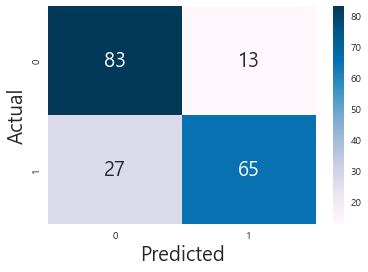

In [212]:
logistic2 = Logistic(df_rb)

### 3-1-3. MinMax

In [187]:
# 1) train, test 나누는 함수
def data(df):
    X = df_mm.drop(['y'], axis=1)
    y = df_mm[['y']]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2 ,random_state=121)

    return X_train, X_test, y_train, y_test
# df_mm = pd.read_csv('./data/df_final_x4_mm.csv', index_col=0)
# 1) train, test 나누는 함수

최적 파라미터
 {'C': 0.1, 'class_weight': 'balanced', 'penalty': 'l2', 'random_state': 121, 'solver': 'liblinear'}
학습 데이터 정확도 :  0.7860663144958447

예측 데이터 정확도
accuracy score : 0.750
precision score : 0.778
recall score : 0.685
f1 score : 0.728
roc score : 0.749


GridSearchCV(cv=KFold(n_splits=5, random_state=121, shuffle=True),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'class_weight': ['balanced', None], 'penalty': ['l2'],
                         'random_state': [121], 'solver': ['liblinear']},
             scoring='f1')

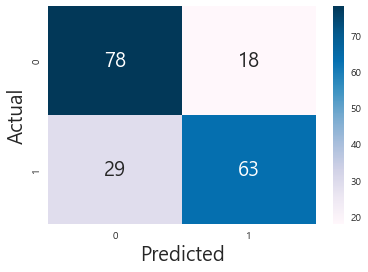

In [188]:
Logistic(df_mm)

### 3-1-4. Log

In [189]:
# 1) train, test 나누는 함수
def data(df):
    X = df_log.drop(['y'], axis=1)
    y = df_log[['y']]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2 ,random_state=121)

    return X_train, X_test, y_train, y_test
# df_mm = pd.read_csv('./data/df_final_x4_mm.csv', index_col=0)
# 1) train, test 나누는 함수

최적 파라미터
 {'C': 1, 'class_weight': None, 'penalty': 'l2', 'random_state': 121, 'solver': 'liblinear'}
학습 데이터 정확도 :  0.7818935504487754

예측 데이터 정확도
accuracy score : 0.691
precision score : 0.724
recall score : 0.598
f1 score : 0.655
roc score : 0.690


GridSearchCV(cv=KFold(n_splits=5, random_state=121, shuffle=True),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'class_weight': ['balanced', None], 'penalty': ['l2'],
                         'random_state': [121], 'solver': ['liblinear']},
             scoring='f1')

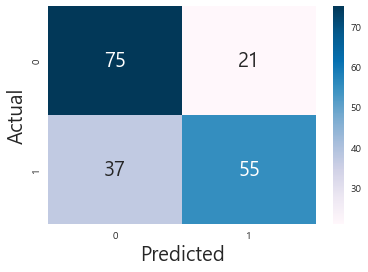

In [190]:
Logistic(df_log)

In [34]:
# 스케일러 방식 중 정확도가 높은 ROBUSTScaler 로 선정
# ROBUSTScaler 에서 t-test, lasso, stepwise 를 거쳐 셀렉션된 교집합 피처 추출(final_select)
final_select = ['자기자본비율','총자산규모','차입금의존도','총자본순이익률','총자본회전율','자기자본회전율','총자산증가율','자기자본증가율']
df_final_select = x[final_select]
df_final_select

,자기자본비율,총자산규모,차입금의존도,총자본순이익률,총자본회전율,자기자본회전율,총자산증가율,자기자본증가율
0,41.659492,17.583764,12.303099,-10.714159,48.828101,117.207626,-40.698452,-36.568135
1,20.669768,17.714853,36.337895,-7.445354,45.552250,220.381043,-18.218210,-55.327901
2,48.368876,17.067764,0.598762,-15.116177,41.400582,85.593433,-47.643241,60.397782
3,37.021190,17.231392,6.594573,-35.200343,20.390178,55.077048,0.766632,-8.762799
4,1.144547,16.765759,6.355326,-17.252203,13.032479,2.323566,-37.226271,-97.375746
...,...,...,...,...,...,...,...,...
933,93.079812,17.722137,0.000000,-2.380746,11.103961,11.929506,-4.626905,-2.185597
934,59.525673,18.877611,27.414434,-3.382666,37.316334,62.689478,33.344563,66.091353
935,89.105169,18.861992,0.700766,-0.594747,33.663323,37.779315,-1.888743,-3.774855
936,32.634844,18.960815,17.276681,-14.352540,102.780809,314.941934,6.921679,55.448194


In [ ]:
# 상관행렬 시각화
mask_ut=np.triu(np.ones(df_final_select.drop('y',axis=1).corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(df_final_select.drop('y',axis=1).corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut, vmin=-1, vmax=1)
plt.show()

In [38]:
df_featureselection = pd.concat([df_final_select, df_final[['감사의견코드','광업', '교육 서비스업', '도매 및 소매업',
       '사업시설 관리, 사업 지원 및 임대 서비스업', '수도, 하수 및 폐기물 처리, 원료 재생업',
       '예술, 스포츠 및 여가관련 서비스업', '전기, 가스, 증기 및 공기조절 공급업', '전문, 과학 및 기술 서비스업',
       '정보통신업', '제조업','회계년도','y']]],axis=1)
df_featureselection

,자기자본비율,총자산규모,차입금의존도,총자본순이익률,총자본회전율,자기자본회전율,총자산증가율,자기자본증가율,감사의견코드,광업,...,도매 및 소매업,"사업시설 관리, 사업 지원 및 임대 서비스업","수도, 하수 및 폐기물 처리, 원료 재생업","예술, 스포츠 및 여가관련 서비스업","전기, 가스, 증기 및 공기조절 공급업","전문, 과학 및 기술 서비스업",정보통신업,제조업,회계년도,y
0,41.659492,17.583764,12.303099,-10.714159,48.828101,117.207626,-40.698452,-36.568135,1,0,...,0,0,0,0,0,0,0,1,2020,1.0
1,20.669768,17.714853,36.337895,-7.445354,45.552250,220.381043,-18.218210,-55.327901,1,0,...,0,0,0,0,0,0,1,0,2014,1.0
2,48.368876,17.067764,0.598762,-15.116177,41.400582,85.593433,-47.643241,60.397782,1,0,...,0,0,0,0,0,0,1,0,2015,1.0
3,37.021190,17.231392,6.594573,-35.200343,20.390178,55.077048,0.766632,-8.762799,0,0,...,0,0,0,0,0,0,1,0,2019,1.0
4,1.144547,16.765759,6.355326,-17.252203,13.032479,2.323566,-37.226271,-97.375746,1,0,...,0,0,0,0,0,0,1,0,2020,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
933,93.079812,17.722137,0.000000,-2.380746,11.103961,11.929506,-4.626905,-2.185597,1,0,...,0,0,0,0,0,0,0,1,2020,0.0
934,59.525673,18.877611,27.414434,-3.382666,37.316334,62.689478,33.344563,66.091353,1,0,...,0,0,0,0,0,0,0,1,2020,0.0
935,89.105169,18.861992,0.700766,-0.594747,33.663323,37.779315,-1.888743,-3.774855,1,0,...,0,0,0,0,0,0,0,1,2020,0.0
936,32.634844,18.960815,17.276681,-14.352540,102.780809,314.941934,6.921679,55.448194,1,0,...,0,0,0,0,0,0,0,1,2020,0.0


In [39]:
df_featureselection.to_csv('./data/df_featureselection.csv')

---

# 4. df_raw_scaled_df 이상치, scaling

In [24]:
import pandas as pd
import numpy as np

In [40]:
df_raw = pd.read_csv('./data/df_raw_scaled_df.csv',index_col=0)
df_raw

,자기자본비율,부채비율,유동비율,당좌비율,차입금의존도,매출액규모,총자산규모,부채상환계수,총자본순이익률,자본금세전순이익률,...,도매 및 소매업,"사업시설 관리, 사업 지원 및 임대 서비스업","수도, 하수 및 폐기물 처리, 원료 재생업",숙박 및 음식점업,"예술, 스포츠 및 여가관련 서비스업",운수 및 창고업,"전기, 가스, 증기 및 공기조절 공급업","전문, 과학 및 기술 서비스업",정보통신업,제조업
0,75.627489,47.267492,230.996351,77.287792,7.556527,16.323210,17.199146,6.893390e+03,2.162576,2.162576,...,0,0,0,0,0,0,0,0,0,1
1,41.797464,190.414329,424.286941,92.831089,0.000000,16.330659,17.633568,-3.814426e+02,-8.970669,-8.970669,...,0,0,0,0,0,0,0,0,0,1
2,95.597728,16.321186,633.696024,88.098714,0.013432,16.535886,17.858520,2.230817e+02,1.056814,1.115638,...,0,0,0,0,0,0,0,0,0,1
3,85.914846,17.053378,422.691875,83.270423,0.007751,16.648058,17.869845,1.440493e+03,0.464809,0.464809,...,0,0,0,0,0,0,0,0,0,1
4,86.334675,16.442479,358.939268,81.390646,0.000000,16.792332,17.880450,9.365915e+02,-1.240894,-1.240894,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10654,88.159174,14.979385,512.170957,85.348949,7.728559,18.467144,18.181074,1.366841e+02,1.760619,2.210060,...,1,0,0,0,0,0,0,0,0,0
10655,87.218955,14.947469,170.530914,83.775334,1.267496,18.558622,18.186194,1.780308e+01,1.353920,1.709123,...,1,0,0,0,0,0,0,0,0,0
10656,88.579677,11.376688,190.727293,75.544440,3.843712,18.641085,18.159334,3.486386e+01,1.270174,1.592513,...,1,0,0,0,0,0,0,0,0,0
10657,95.366942,8.628975,448.803427,89.984485,0.000000,18.515681,18.231288,1.295423e+09,9.359543,12.360547,...,1,0,0,0,0,0,0,0,0,0


## 4-1. 결측치 확인

In [41]:
df_raw.isna().sum()

자기자본비율                      0
부채비율                        0
유동비율                        0
당좌비율                        0
차입금의존도                      0
매출액규모                       0
총자산규모                       0
부채상환계수                      0
총자본순이익률                     0
자본금세전순이익률                   0
자기자본순이익률                    0
매출액세전순이익률                   0
매출액영업이익률                    0
금융비용대비매출액                   0
매출원가율                       0
이자보상배율                      0
총자본회전율                      0
자기자본회전율                     0
비유동자산회전율                    0
유형고정자산회전율                   0
매출채권회전율                     0
재고자산회전율                     0
운전자산회전율                     0
총자산증가율                      0
유형자산증가율                     0
매출액증가율                      0
순이익증가율                      0
자기자본증가율                     0
총자본투자효율                     0
부가가치율                       0
노동소득분배율                     0
현금흐름                        0
회사명                         0
거래소코드     

## 4-2. 무한대 확인

In [42]:
np.isinf(abs(df_raw.iloc[:,:32])).sum()

자기자본비율       0
부채비율         0
유동비율         0
당좌비율         0
차입금의존도       0
매출액규모        0
총자산규모        0
부채상환계수       0
총자본순이익률      0
자본금세전순이익률    0
자기자본순이익률     0
매출액세전순이익률    0
매출액영업이익률     0
금융비용대비매출액    0
매출원가율        0
이자보상배율       0
총자본회전율       0
자기자본회전율      0
비유동자산회전율     0
유형고정자산회전율    0
매출채권회전율      0
재고자산회전율      0
운전자산회전율      0
총자산증가율       0
유형자산증가율      0
매출액증가율       0
순이익증가율       0
자기자본증가율      0
총자본투자효율      0
부가가치율        0
노동소득분배율      0
현금흐름         0
dtype: int64

## 4-3. boxplot 이상치 처리

이상치 조정
- 너무 극단적인 이상치에 대해서는 winsorising 진행
- winsorize시 분포의 95% 외의 값은 max와 min 값으로 대체

In [43]:
x = df_raw.iloc[:,:32]
x

,자기자본비율,부채비율,유동비율,당좌비율,차입금의존도,매출액규모,총자산규모,부채상환계수,총자본순이익률,자본금세전순이익률,...,운전자산회전율,총자산증가율,유형자산증가율,매출액증가율,순이익증가율,자기자본증가율,총자본투자효율,부가가치율,노동소득분배율,현금흐름
0,75.627489,47.267492,230.996351,77.287792,7.556527,16.323210,17.199146,6.893390e+03,2.162576,2.162576,...,146.669141,25.669219,9.441161,53.831859,831.580106,158.833603,12.634668,27.239028,56.204155,-3.379967
1,41.797464,190.414329,424.286941,92.831089,0.000000,16.330659,17.633568,-3.814426e+02,-8.970669,-8.970669,...,47.927974,54.407046,-3.004507,0.747696,-687.677616,-21.701042,-5.113080,-15.501043,-0.000000,-11.284429
2,95.597728,16.321186,633.696024,88.098714,0.013432,16.535886,17.858520,2.230817e+02,1.056814,1.115638,...,44.257043,25.226274,11.193917,22.780406,720.967790,212.647290,6.852398,23.128577,58.087209,-7.429570
3,85.914846,17.053378,422.691875,83.270423,0.007751,16.648058,17.869845,1.440493e+03,0.464809,0.464809,...,77.520482,1.138907,76.940488,11.870458,-50.813199,0.506265,5.258565,17.743146,76.622734,0.189064
4,86.334675,16.442479,358.939268,81.390646,0.000000,16.792332,17.880450,9.365915e+02,-1.240894,-1.240894,...,100.565231,1.066129,-6.083943,15.520101,-369.911312,1.596356,4.993929,14.747191,85.089072,2.766692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10654,88.159174,14.979385,512.170957,85.348949,7.728559,18.467144,18.181074,1.366841e+02,1.760619,2.210060,...,902.263092,2.767526,-5.884943,-10.444207,-39.415574,1.102305,0.813320,0.602748,0.000000,0.838766
10655,87.218955,14.947469,170.530914,83.775334,1.267496,18.558622,18.186194,1.780308e+01,1.353920,1.709123,...,1850.608041,0.513277,-0.314656,9.579261,-21.850091,0.541185,0.243113,0.167092,0.000000,1.690812
10656,88.579677,11.376688,190.727293,75.544440,3.843712,18.641085,18.159334,3.486386e+01,1.270174,1.592513,...,2062.242565,-2.650191,-0.118776,8.595912,-7.191638,0.470883,0.065704,0.041138,0.000000,-0.419006
10657,95.366942,8.628975,448.803427,89.984485,0.000000,18.515681,18.231288,1.295423e+09,9.359543,12.360547,...,648.082242,7.460554,-7.724280,-11.786013,654.093800,10.178712,0.589476,0.428166,0.000000,1.625282


In [44]:
# boxplot에서 보이는 이상치 처리 -> 5% winsorizing 활용
from scipy.stats.mstats import winsorize
for i in range(len(x.columns)):
  x.iloc[:,i]= winsorize(x.iloc[:,i], limits=[0.025, 0.025])

# 5. 변수 선택 및 변수 세분화

In [45]:
# select된 변수 들고오기
select_rb = ['자기자본비율','총자산규모','총자본회전율','총자본순이익률','자기자본증가율','자기자본회전율','차입금의존도','총자산증가율']
df_select_rb = x[select_rb]
df_select_rb

,자기자본비율,총자산규모,총자본회전율,총자본순이익률,자기자본증가율,자기자본회전율,차입금의존도,총자산증가율
0,75.627489,17.199146,46.384431,2.162576,118.891914,61.332767,7.556527,25.669219
1,41.797464,17.633568,32.985391,-8.970669,-21.701042,78.917205,0.000000,54.407046
2,95.597728,17.858520,29.627408,1.056814,118.891914,30.991750,0.013432,25.226274
3,85.914846,17.869845,29.637160,0.464809,0.506265,34.495971,0.007751,1.138907
4,86.334675,17.880450,33.863595,-1.240894,1.596356,39.223632,0.000000,1.066129
...,...,...,...,...,...,...,...,...
10654,88.159174,18.181074,134.935394,1.760619,1.102305,153.058822,7.728559,2.767526
10655,87.218955,18.186194,145.496858,1.353920,0.541185,166.817932,1.267496,0.513277
10656,88.579677,18.159334,158.752865,1.270174,0.470883,180.308414,3.843712,-2.650191
10657,95.366942,18.231288,137.674531,9.359543,10.178712,144.362951,0.000000,7.460554


In [ ]:
# 상관행렬 시각화
mask_ut=np.triu(np.ones(df_select_rb.drop('y',axis=1).corr().shape)).astype(bool)  # 배열 행렬에 위쪽 삼각형 반환 -> True
plt.figure(figsize=(30,30))
sns.heatmap(df_select_rb.drop('y',axis=1).corr(method='pearson'), annot = True, cmap = 'RdYlBu_r', cbar_kws={"shrink": .5}, 
              annot_kws={"size": 10}, linewidths=.5, mask=mask_ut, vmin=-1, vmax=1)
plt.show()

In [12]:
df_raw.columns

Index(['자기자본비율', '부채비율', '유동비율', '당좌비율', '차입금의존도', '매출액규모', '총자산규모', '부채상환계수',
       '총자본순이익률', '자본금세전순이익률', '자기자본순이익률', '매출액세전순이익률', '매출액영업이익률',
       '금융비용대비매출액', '매출원가율', '이자보상배율', '총자본회전율', '자기자본회전율', '비유동자산회전율',
       '유형고정자산회전율', '매출채권회전율', '재고자산회전율', '운전자산회전율', '총자산증가율', '유형자산증가율',
       '매출액증가율', '순이익증가율', '자기자본증가율', '총자본투자효율', '부가가치율', '노동소득분배율', '현금흐름',
       '회사명', '거래소코드', '회계년도', '감사의견코드', 'y', '광업', '교육 서비스업', '금융 및 보험업',
       '농업, 임업 및 어업', '도매 및 소매업', '사업시설 관리, 사업 지원 및 임대 서비스업',
       '수도, 하수 및 폐기물 처리, 원료 재생업', '숙박 및 음식점업', '예술, 스포츠 및 여가관련 서비스업',
       '운수 및 창고업', '전기, 가스, 증기 및 공기조절 공급업', '전문, 과학 및 기술 서비스업', '정보통신업',
       '제조업'],
      dtype='object')

In [46]:
df_final_raw = pd.concat([df_select_rb, df_raw[['회사명', '거래소코드', '회계년도','감사의견코드','광업', '교육 서비스업', '도매 및 소매업',
       '사업시설 관리, 사업 지원 및 임대 서비스업', '수도, 하수 및 폐기물 처리, 원료 재생업',
       '예술, 스포츠 및 여가관련 서비스업', '전기, 가스, 증기 및 공기조절 공급업', '전문, 과학 및 기술 서비스업',
       '정보통신업', '제조업','y']]],axis=1)
df_final_raw

,자기자본비율,총자산규모,총자본회전율,총자본순이익률,자기자본증가율,자기자본회전율,차입금의존도,총자산증가율,회사명,거래소코드,...,교육 서비스업,도매 및 소매업,"사업시설 관리, 사업 지원 및 임대 서비스업","수도, 하수 및 폐기물 처리, 원료 재생업","예술, 스포츠 및 여가관련 서비스업","전기, 가스, 증기 및 공기조절 공급업","전문, 과학 및 기술 서비스업",정보통신업,제조업,y
0,75.627489,17.199146,46.384431,2.162576,118.891914,61.332767,7.556527,25.669219,(주)CMG제약,58820,...,0,0,0,0,0,0,0,0,1,0.0
1,41.797464,17.633568,32.985391,-8.970669,-21.701042,78.917205,0.000000,54.407046,(주)CMG제약,58820,...,0,0,0,0,0,0,0,0,1,0.0
2,95.597728,17.858520,29.627408,1.056814,118.891914,30.991750,0.013432,25.226274,(주)CMG제약,58820,...,0,0,0,0,0,0,0,0,1,0.0
3,85.914846,17.869845,29.637160,0.464809,0.506265,34.495971,0.007751,1.138907,(주)CMG제약,58820,...,0,0,0,0,0,0,0,0,1,0.0
4,86.334675,17.880450,33.863595,-1.240894,1.596356,39.223632,0.000000,1.066129,(주)CMG제약,58820,...,0,0,0,0,0,0,0,0,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10654,88.159174,18.181074,134.935394,1.760619,1.102305,153.058822,7.728559,2.767526,흥구석유(주),24060,...,0,1,0,0,0,0,0,0,0,0.0
10655,87.218955,18.186194,145.496858,1.353920,0.541185,166.817932,1.267496,0.513277,흥구석유(주),24060,...,0,1,0,0,0,0,0,0,0,0.0
10656,88.579677,18.159334,158.752865,1.270174,0.470883,180.308414,3.843712,-2.650191,흥구석유(주),24060,...,0,1,0,0,0,0,0,0,0,0.0
10657,95.366942,18.231288,137.674531,9.359543,10.178712,144.362951,0.000000,7.460554,흥구석유(주),24060,...,0,1,0,0,0,0,0,0,0,0.0


In [47]:
df_final_raw.to_csv('./data/df_final_raw.csv')